In [247]:
import sqlalchemy
from scipy.stats import mode
import sqlite3, csv, os
from sqlalchemy import (Boolean, Column, Enum, ForeignKey, Integer, String,PickleType,MetaData,
                        Float,Table, UniqueConstraint, create_engine)
from sqlalchemy import (not_, select,and_) 
from datetime import datetime
from sqlalchemy import *
from sqlalchemy.dialects.postgresql import ARRAY
from sklearn import datasets
from sklearn import *
# from sklearn.model_selection import train_test_split
from numpy import genfromtxt
import numpy as np
import time
from scipy.spatial.distance import cdist, pdist
from sklearn.decomposition import PCA
from scipy.spatial.distance import cdist, pdist
from sklearn.cluster import KMeans
from sklearn.cluster import MiniBatchKMeans
from sklearn import preprocessing
from sklearn.metrics import silhouette_samples, silhouette_score, accuracy_score
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.colors import LogNorm
# from sklearn import model_selection
import time
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.colors import ListedColormap
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'
# from unsupervised_alt import *
from scipy import interp
from itertools import cycle
from sklearn.metrics import roc_curve, auc
from sklearn.model_selection import StratifiedKFold

In [125]:
# set up all dictionaries to store the results
fpr_dict = dict()
tpr_dict = dict()
auc_dict = dict()
acc_dict = dict()

In [97]:
# load dataset
data_path = '/media/SpatialPathology'
data_fname = 'ComputedFeatures_Label.csv'
data = []
Class = []
CaseName = []
ClassGrade = []

with open(os.path.join(data_path,data_fname),'rb') as csvfile:
    f_csv = csv.reader(csvfile,delimiter=',')
    f_csv = csv.DictReader(csvfile)
    for row in f_csv:
        data.append([float(value) for key, value in row.items() if key not in [
                   'Class','ClassGrade','CaseName','ER']])
        Class.append(row['Class'])
        ClassGrade.append(row['ClassGrade'])
        CaseName.append(row['CaseName'])

data = np.vstack(data)
print data.shape
ClassLabel = np.asarray([int(Class[i]=='DCIS') for i in xrange(len(Class))])
# print ClassLabel
data_train = data[:116,:]
data_test = data[116:,:]
y_train = ClassLabel[:116]
y_test = ClassLabel[116:]

print data_train.shape, data_test.shape, y_train.shape, y_test.shape


(167, 392)
(116, 392) (51, 392) (116,) (51,)


## Binary classification

(167, 392)
(116, 392) (51, 392) (116,) (51,)
Fold 0: validation auc = 0.99 and accuracy =0.90
Fold 1: validation auc = 0.93 and accuracy =0.84
Fold 2: validation auc = 0.98 and accuracy =0.84
Fold 3: validation auc = 0.92 and accuracy =0.84
Fold 4: validation auc = 0.91 and accuracy =0.83
Fold 5: validation auc = 1.00 and accuracy =0.83
Fold 6: validation auc = 1.00 and accuracy =0.94
Fold 7: validation auc = 0.91 and accuracy =0.67
Fold 8: validation auc = 0.81 and accuracy =0.72


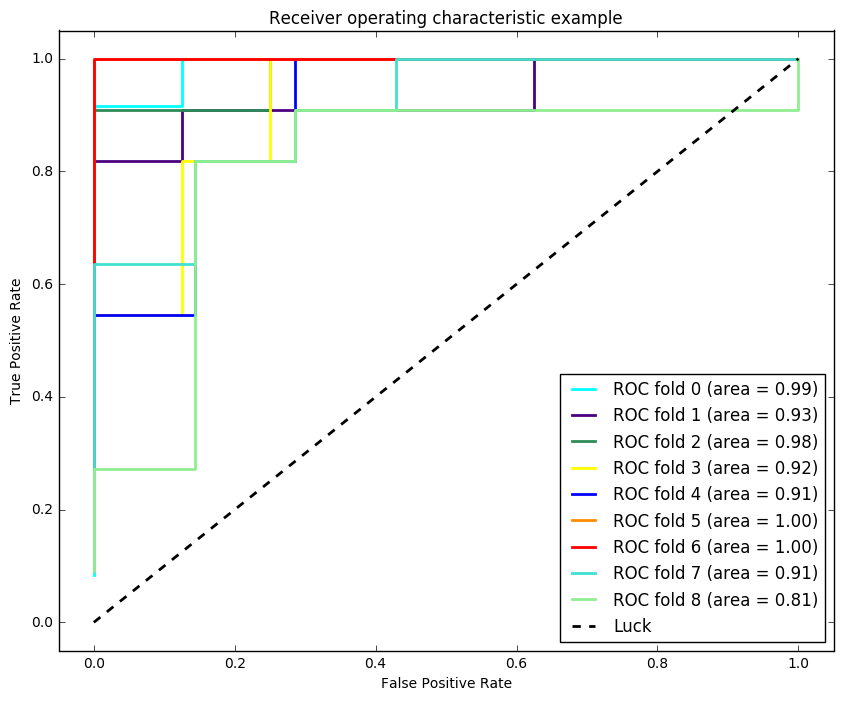

In [212]:
# load dataset
data_path = '/media/SpatialPathology'
data_fname = 'ComputedFeatures_Label.csv'
data = []
Class = []
CaseName = []
ClassGrade = []

with open(os.path.join(data_path,data_fname),'rb') as csvfile:
    f_csv = csv.reader(csvfile,delimiter=',')
    f_csv = csv.DictReader(csvfile)
    for row in f_csv:
        data.append([float(value) for key, value in row.items() if key not in [
                   'Class','ClassGrade','CaseName','ER']])
        Class.append(row['Class'])
        ClassGrade.append(row['ClassGrade'])
        CaseName.append(row['CaseName'])

data = np.vstack(data)
print data.shape
ClassLabel = np.asarray([int(Class[i]=='DCIS') for i in xrange(len(Class))])
# print ClassLabel
data_train = data[:116,:]
data_test = data[116:,:]
y_train = ClassLabel[:116]
y_test = ClassLabel[116:]

print data_train.shape, data_test.shape, y_train.shape, y_test.shape

scaler = preprocessing.StandardScaler().fit(data)
data_scaled = scaler.transform(data)

X = data_scaled
y = np.asarray(ClassLabel)

random_state = np.random.RandomState(123)
C = 0.359
clf = linear_model.LogisticRegression(penalty='l1',C = C, scoring = 'roc_auc',random_state=random_state)

colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2

cv = StratifiedKFold(n_splits=9)

i = 0
model = []
model_perf = []
for (train, test), color in zip(cv.split(X, y), colors):
    clf = linear_model.LogisticRegression(penalty='l1',
                                          C = C, random_state=random_state)
    model.append(clf.fit(X[train], y[train]))
    probas_ = model[i].predict_proba(X[test])
    # Compute ROC curve and area the curve
    fpr, tpr, _ = roc_curve(y[test], probas_[:, 1])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=lw, color=color,
             label='ROC fold %d (area = %0.2f)' % (i, roc_auc))
    ypred = model[i].predict(X[test])
    acc = accuracy_score(y[test],ypred)
    model_perf.append(acc+ roc_auc)
    
    fpr_cv[(i,'val')] = fpr
    tpr_cv[(i,'val')] = tpr
    auc_cv[(i,'val')] = roc_auc
    acc_cv[(i,'val')] = acc
    print('Fold %d: validation auc = %0.2f and accuracy =%0.2f' %(i, roc_auc, acc))
    i += 1
    
plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

setting = 'nucFeats'
# get the best model
model_perf = np.asarray(model_perf)
best_model = np.argmax(model_perf)
curr_key = (setting + '_CV' + '_bin' )
fpr_dict[curr_key] = fpr_cv[(best_model,'val')]
tpr_dict[curr_key] = tpr_cv[(best_model,'val')]
acc_dict[curr_key] = acc_cv[(best_model,'val')]
auc_dict[curr_key] = auc_cv[(best_model,'val')]

## cross validation to select the best C

In [213]:
# load dataset
data_path = '/media/SpatialPathology'
data_fname = 'ComputedFeatures_Label.csv'
data = []
Class = []
CaseName = []
ClassGrade = []

with open(os.path.join(data_path,data_fname),'rb') as csvfile:
    f_csv = csv.reader(csvfile,delimiter=',')
    f_csv = csv.DictReader(csvfile)
    for row in f_csv:
        data.append([float(value) for key, value in row.items() if key not in [
                   'Class','ClassGrade','CaseName','ER']])
        Class.append(row['Class'])
        ClassGrade.append(row['ClassGrade'])
        CaseName.append(row['CaseName'])

data = np.vstack(data)
print data.shape
ClassLabel = np.asarray([int(Class[i]=='DCIS') for i in xrange(len(Class))])
# print ClassLabel
data_train = data[:116,:]
data_test = data[116:,:]
y_train = ClassLabel[:116]
y_test = ClassLabel[116:]

print data_train.shape, data_test.shape, y_train.shape, y_test.shape
scaler = preprocessing.StandardScaler().fit(data_train)
data_train_scaled = scaler.transform(data_train)

# X = data_scaled
# y = np.asarray(ClassLabel)

X = data_train_scaled
y = np.asarray(y_train)

random_state = np.random.RandomState(1235)
cv = StratifiedKFold(n_splits=8)

model = linear_model.LogisticRegressionCV(cv = cv, penalty='l1', scoring='roc_auc',solver='liblinear')
model.fit(X,y)
print model.Cs_
print model.C_


(167, 392)
(116, 392) (51, 392) (116,) (51,)
[  1.00000000e-04   7.74263683e-04   5.99484250e-03   4.64158883e-02
   3.59381366e-01   2.78255940e+00   2.15443469e+01   1.66810054e+02
   1.29154967e+03   1.00000000e+04]
[ 2.7825594]


(167, 392)
(116, 392) (51, 392) (116,) (51,)
Fold 0: validation auc = 1.00 and accuracy =1.00
Fold 0: Test auc = 0.75 and accuracy =0.61
Fold 1: validation auc = 0.89 and accuracy =0.77
Fold 1: Test auc = 0.80 and accuracy =0.65
Fold 2: validation auc = 1.00 and accuracy =1.00
Fold 2: Test auc = 0.82 and accuracy =0.65
Fold 3: validation auc = 0.94 and accuracy =0.92
Fold 3: Test auc = 0.83 and accuracy =0.75
Fold 4: validation auc = 1.00 and accuracy =0.92
Fold 4: Test auc = 0.82 and accuracy =0.47
Fold 5: validation auc = 0.94 and accuracy =0.77
Fold 5: Test auc = 0.81 and accuracy =0.76
Fold 6: validation auc = 0.97 and accuracy =0.85
Fold 6: Test auc = 0.85 and accuracy =0.51
Fold 7: validation auc = 0.83 and accuracy =0.62
Fold 7: Test auc = 0.86 and accuracy =0.69
Fold 8: validation auc = 0.94 and accuracy =0.67
Fold 8: Test auc = 0.86 and accuracy =0.84


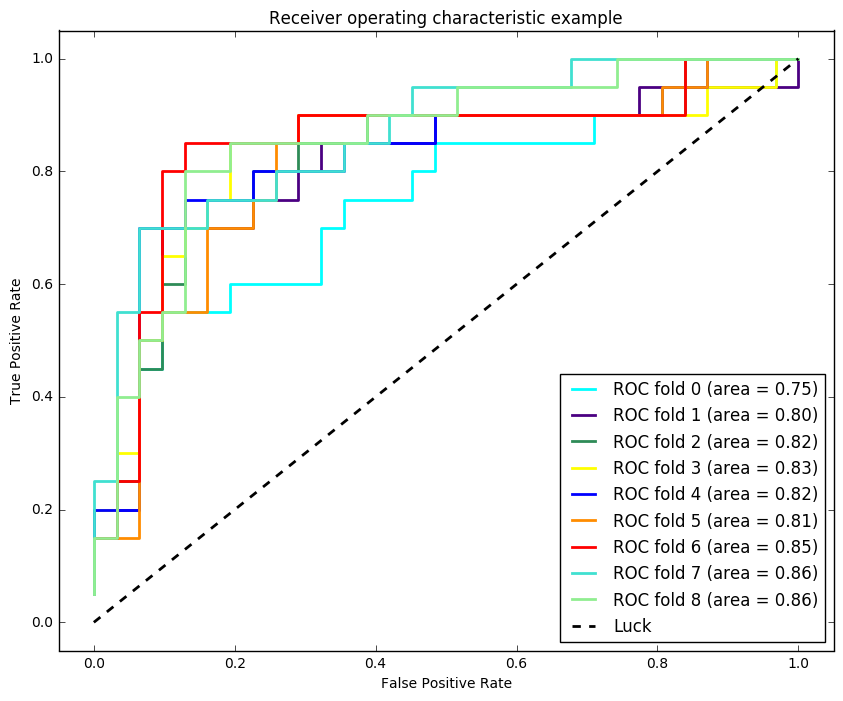

In [432]:
# load dataset
data_path = '/media/SpatialPathology'
data_fname = 'ComputedFeatures_Label.csv'
data = []
Class = []
CaseName = []
ClassGrade = []

with open(os.path.join(data_path,data_fname),'rb') as csvfile:
    f_csv = csv.reader(csvfile,delimiter=',')
    f_csv = csv.DictReader(csvfile)
    for row in f_csv:
        data.append([float(value) for key, value in row.items() if key not in [
                   'Class','ClassGrade','CaseName','ER']])
        Class.append(row['Class'])
        ClassGrade.append(row['ClassGrade'])
        CaseName.append(row['CaseName'])

data = np.vstack(data)
print data.shape
ClassLabel = np.asarray([int(Class[i]=='DCIS') for i in xrange(len(Class))])
# print ClassLabel
data_train = data[:116,:]
data_test = data[116:,:]
y_train = ClassLabel[:116]
y_test = ClassLabel[116:]

print data_train.shape, data_test.shape, y_train.shape, y_test.shape

scaler = preprocessing.StandardScaler().fit(data_train)
data_train_scaled = scaler.transform(data_train)
data_test_scaled = scaler.transform(data_test)

X = data_train_scaled
y = y_train

random_state = np.random.RandomState(123)

# cv_model = linear_model.LogisticRegressionCV(penalty='l1', scoring='roc_auc',solver='liblinear')
# cv_model.fit(X,y)
# print cv_model.C_
# C = cv_model.C_[0]
C = 0.5
#C = 2.7825594
clf = linear_model.LogisticRegression(penalty='l1',C = C, random_state=random_state)

colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2
cv = StratifiedKFold(n_splits=9)

i = 0
model = []
model_perf = []

# story value for cross validation
fpr_cv = dict()
tpr_cv = dict()
auc_cv = dict()
acc_cv = dict()
    
for (train, test), color in zip(cv.split(X, y), colors):
    clf = linear_model.LogisticRegression(penalty='l1',C = C, random_state=random_state)
    model.append(clf.fit(X[train], y[train]))
    probas_ = model[i].predict_proba(X[test])
    # Compute ROC curve and area the curve
    fpr, tpr, _ = roc_curve(y[test], probas_[:, 1])
    roc_auc = auc(fpr, tpr)
    
    ypred = model[i].predict(X[test])
    acc = accuracy_score(y[test],ypred)
    print('Fold %d: validation auc = %0.2f and accuracy =%0.2f' %(i, roc_auc, acc))
    model_perf.append(roc_auc + acc)
    fpr_cv[(i,'val')] = fpr
    tpr_cv[(i,'val')] = tpr
    auc_cv[(i,'val')] = roc_auc
    acc_cv[(i,'val')] = acc
    
    # onto the test set
    probas_ = model[i].predict_proba(data_test_scaled)
    fpr, tpr, _ = roc_curve(y_test, probas_[:,1])
    roc_auc = auc(fpr, tpr)
    ypred = model[i].predict(data_test_scaled)
    acc = accuracy_score(y_test, ypred)
    fpr_cv[(i,'test')] = fpr
    tpr_cv[(i,'test')] = tpr
    auc_cv[(i,'test')] = roc_auc
    acc_cv[(i,'test')] = acc
    print('Fold %d: Test auc = %0.2f and accuracy =%0.2f' %(i, roc_auc, acc))
    plt.plot(fpr, tpr, lw=lw, color=color,
             label='ROC fold %d (area = %0.2f)' % (i, roc_auc))
    
    i += 1
plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

setting = 'nucFeats'
# get the best model
model_perf = np.asarray(model_perf)
#best_model = np.argmax(model_perf)
best_model = 2
curr_key = (setting + '_val' + '_bin' )
fpr_dict[curr_key] = fpr_cv[(best_model,'val')]
tpr_dict[curr_key] = tpr_cv[(best_model,'val')]
acc_dict[curr_key] = acc_cv[(best_model,'val')]
auc_dict[curr_key] = auc_cv[(best_model,'val')]
curr_key = (setting + '_test' + '_bin' )
fpr_dict[curr_key] = fpr_cv[(best_model,'test')]
tpr_dict[curr_key] = tpr_cv[(best_model,'test')]
acc_dict[curr_key] = acc_cv[(best_model,'test')]
auc_dict[curr_key] = auc_cv[(best_model,'test')]

In [431]:
print model_perf.reshape(1,-1)
print best_model
print np.argmax(model_perf.reshape(1,-1))

[[ 2.          1.65811966  2.          1.86752137  1.92307692  1.71367521
   1.81837607  1.44871795  1.60416667]]
0
0


(167, 392)
(116, 392) (51, 392) (116,) (51,)
Regularization parameter:  5.42867543932
Num of features:  42
1 (9, 50)
Accuracy is 0.59


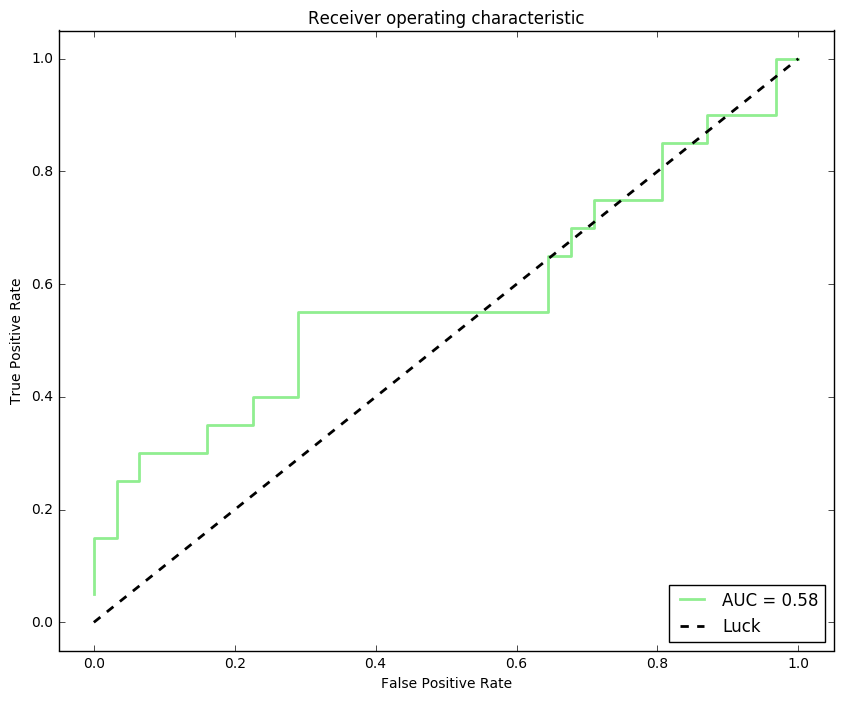

In [370]:
# load dataset
data_path = '/media/SpatialPathology'
data_fname = 'ComputedFeatures_Label.csv'
data = []
Class = []
CaseName = []
ClassGrade = []

with open(os.path.join(data_path,data_fname),'rb') as csvfile:
    f_csv = csv.reader(csvfile,delimiter=',')
    f_csv = csv.DictReader(csvfile)
    for row in f_csv:
        data.append([float(value) for key, value in row.items() if key not in [
                   'Class','ClassGrade','CaseName','ER']])
        Class.append(row['Class'])
        ClassGrade.append(row['ClassGrade'])
        CaseName.append(row['CaseName'])

data = np.vstack(data)
print data.shape
ClassLabel = np.asarray([int(Class[i]=='DCIS') 
                         for i in xrange(len(Class))])
# print ClassLabel
data_train = data[:116,:]
data_test = data[116:,:]
y_train = ClassLabel[:116]
y_test = ClassLabel[116:]

print data_train.shape, data_test.shape, y_train.shape, y_test.shape

colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2
cv = StratifiedKFold(n_splits=9)

scaler = preprocessing.StandardScaler().fit(data_train)
data_train_scaled = scaler.transform(data_train)
# scaler = preprocessing.StandardScaler().fit(data_test)
data_test_scaled = scaler.transform(data_test)

X = data_train_scaled
y = y_train

random_state = np.random.RandomState(1234)
# , scoring='roc_auc'
cv_model = linear_model.LogisticRegressionCV(Cs = 50,cv = cv, 
            penalty='l1',solver='liblinear', refit = True,
            random_state = random_state)
cv_model.fit(data_train_scaled,y_train)
# print cv_model.C_
C = cv_model.C_[0]
print 'Regularization parameter: ', C
print 'Num of features: ', np.sum(cv_model.coef_ != 0)
for key in cv_model.scores_:
    print key, cv_model.scores_[key].shape
# clf = linear_model.LogisticRegression(
#     penalty='l1',C = C, random_state=random_state)
# clf.fit(X,y)

# probas_ = clf.predict_proba(data_test_scaled)
probas_ = cv_model.predict_proba(data_test_scaled)
fpr, tpr, _ = roc_curve(y_test, probas_[:,1])
roc_auc = auc(fpr, tpr)
# ypred = clf.predict(data_test_scaled)
# ypred = cv_model.predict(data_test_scaled)
# acc = accuracy_score(y_test, ypred)
acc = cv_model.score(data_test_scaled,y_test)

print 'Accuracy is %0.2f' %(acc)
plt.plot(fpr, tpr, lw=lw, color=color,
             label='AUC = %0.2f' % (roc_auc))

plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

## Random walk features

In [256]:
rw_settings = ['colorobjectclusters',
               'cellclusters_maxD5_k90',
               'cellclusters_maxD5_k90_SI',
               'cellclusters_maxD5_k95',
               'cellclusters_maxD5_k95_SI',
               'cellclusters_maxD10_k90',
               'cellclusters_maxD10_k90_SI',
               'cellclusters_maxD10_k95',
               'cellclusters_maxD10_k95_SI',
               'combinedcellclusters_maxD5_k90',
              'combinedcellclusters_maxD5_k90_SI',
              'combinedcellclusters_maxD5_k95',
              'combinedcellclusters_maxD5_k95_SI',
               'combinedcellclusters_maxD10_k90',
              'combinedcellclusters_maxD10_k90_SI',
              'combinedcellclusters_maxD10_k95',
              'combinedcellclusters_maxD10_k95_SI'
              ]
rw_dir = '/media/SpatialPathology/random_walk_features/'

In [399]:
colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2
cv = StratifiedKFold(n_splits=9)

# CaseName = []
# ClassGrade = []
# Hospital = []
# rw_data = []
for param_set in xrange(len(rw_settings)):
    #print('parameter setting %s' %(rw_settings[param_set]))
    # read in the file
    CaseName = []
    ClassGrade = []
    Hospital = []
    rw_data = []
    with open(os.path.join(rw_dir, (
                'train_test_list_' + rw_settings[param_set]+'.csv')),'rb') as csvfile:
        f_csv = csv.reader(csvfile,delimiter = ',')
        for row in f_csv:
            CaseName.append(row[0])
            ClassGrade.append(int(row[1]))
            Hospital.append(int(row[2]))
            rw_data.append([float(row[i]) for i in xrange(3,len(row))])
    data = np.vstack(rw_data)
    ClassGrade = np.asarray(ClassGrade)
    ClassLabel = np.asarray([int(ClassGrade[i] > 0) for i in 
                                 xrange(len(ClassGrade))])
    Hospital = np.asarray(Hospital)
    #print rw_data.shape, ClassGrade.shape
    data_train = data[Hospital == 1,:]
    data_test = data[Hospital == 0, :]
    y_train = ClassLabel[Hospital == 1]
    y_test = ClassLabel[Hospital == 0]
    #print data_train.shape, data_test.shape, len(y_train), len(y_test)
    ###################################################
    ###################BINARY###################
    ###################################################
    scaler = preprocessing.StandardScaler().fit(data_train)
    data_train_scaled = scaler.transform(data_train)
    data_test_scaled = scaler.transform(data_test)
    
    random_state = np.random.RandomState(123)
    #C = 5
    
    cv_model = linear_model.LogisticRegressionCV(
        Cs = 50, cv = 9, penalty='l1', 
        scoring='roc_auc',solver='liblinear')
    cv_model.fit(data_train_scaled,y_train)
    C = cv_model.C_[0]
    #####################################################
    ######################FOR TRAIN######################
    #####################################################
    #print model.Cs_    
    probas_ = cv_model.predict_proba(data_train_scaled)
    fpr, tpr, _ = roc_curve(y_train, probas_[:,1])
    roc_auc = auc(fpr, tpr)
    
    #val_auc = np.max(np.mean(cv_model.scores_[1],axis=0))
    #print val_auc
    # ypred = clf.predict(data_test_scaled)
    #ypred = cv_model.predict(data_test_scaled)
    #acc = accuracy_score(y_test, ypred)
    acc = cv_model.score(data_train_scaled, y_train)
    setting = rw_settings[param_set]
    print('Setting %s has C=%0.2f and %d non zero coefficients' %(
        setting, C,np.sum(cv_model.coef_ !=0 ) ))
    print('Train: AUC = %0.2f, acc = %0.2f' %(
            roc_auc,acc))
    
    curr_key = (setting + '_val' + '_bin' )
    fpr_dict[curr_key] = fpr
    tpr_dict[curr_key] = tpr
    auc_dict[curr_key] = roc_auc
    acc_dict[curr_key] = acc
    #####################################################
    ######################FOR TEST######################
    #####################################################
    probas_ = cv_model.predict_proba(data_test_scaled)
    fpr, tpr, _ = roc_curve(y_test, probas_[:,1])
    roc_auc = auc(fpr, tpr)
    acc = cv_model.score(data_test_scaled, y_test)
    print('Test: AUC = %0.2f, acc = %0.2f' %(
            roc_auc,acc))
    
    curr_key = (setting + '_test' + '_bin' )
    fpr_dict[curr_key] = fpr
    tpr_dict[curr_key] = tpr
    auc_dict[curr_key] = roc_auc
    acc_dict[curr_key] = acc

Setting colorobjectclusters has C=0.27 and 3 non zero coefficients
Train: AUC = 0.87, acc = 0.79
Test: AUC = 0.68, acc = 0.53
Setting cellclusters_maxD5_k90 has C=0.06 and 3 non zero coefficients
Train: AUC = 0.73, acc = 0.72
Test: AUC = 0.63, acc = 0.37
Setting cellclusters_maxD5_k90_SI has C=0.06 and 1 non zero coefficients
Train: AUC = 0.68, acc = 0.71
Test: AUC = 0.64, acc = 0.39
Setting cellclusters_maxD5_k95 has C=0.13 and 4 non zero coefficients
Train: AUC = 0.73, acc = 0.71
Test: AUC = 0.64, acc = 0.43
Setting cellclusters_maxD5_k95_SI has C=0.39 and 7 non zero coefficients
Train: AUC = 0.70, acc = 0.71
Test: AUC = 0.58, acc = 0.39
Setting cellclusters_maxD10_k90 has C=0.13 and 3 non zero coefficients
Train: AUC = 0.75, acc = 0.72
Test: AUC = 0.70, acc = 0.53
Setting cellclusters_maxD10_k90_SI has C=0.06 and 2 non zero coefficients
Train: AUC = 0.70, acc = 0.71
Test: AUC = 0.58, acc = 0.39
Setting cellclusters_maxD10_k95 has C=0.83 and 10 non zero coefficients
Train: AUC = 0.77

In [401]:
for param_set in xrange(len(rw_settings)):
    #print('parameter setting %s' %(rw_settings[param_set]))
    # read in the file
    CaseName = []
    ClassGrade = []
    Hospital = []
    rw_data = []
    with open(os.path.join(rw_dir, (
                'train_test_list_' + rw_settings[param_set]+'.csv')),'rb') as csvfile:
        f_csv = csv.reader(csvfile,delimiter = ',')
        for row in f_csv:
            CaseName.append(row[0])
            ClassGrade.append(int(row[1]))
            Hospital.append(int(row[2]))
            rw_data.append([float(row[i]) for i in xrange(3,len(row))])
    data = np.vstack(rw_data)
    ClassGrade = np.asarray(ClassGrade)
    ClassLabel = np.asarray([int(ClassGrade[i] > 0) for i in 
                                 xrange(len(ClassGrade))])
    Hospital = np.asarray(Hospital)
    #print rw_data.shape, ClassGrade.shape
    data_train = data[Hospital == 1,:]
    data_test = data[Hospital == 0, :]
    y_train = ClassLabel[Hospital == 1]
    y_test = ClassLabel[Hospital == 0]
    #print data_train.shape, data_test.shape, len(y_train), len(y_test)
    ###################################################
    ###################BINARY###################
    ###################################################
    scaler = preprocessing.StandardScaler().fit(data)
    X = scaler.transform(data)
    y = ClassLabel
    random_state = np.random.RandomState(123)
    #C = 5
    
    cv_model = linear_model.LogisticRegressionCV(
        Cs = 50, cv = 9, penalty='l1', 
        scoring='roc_auc',solver='liblinear')
    cv_model.fit(X,y)
    C = cv_model.C_[0]
    #####################################################
    ######################FOR CV######################
    #####################################################
    #print model.Cs_    
    probas_ = cv_model.predict_proba(X)
    fpr, tpr, _ = roc_curve(y, probas_[:,1])
    roc_auc = auc(fpr, tpr)
    acc = cv_model.score(X,y)
    
    setting = rw_settings[param_set]
    print('Setting %s has C=%0.2f and %d non zero coefficients' %(
        setting, C,np.sum(cv_model.coef_ !=0 ) ))
    print('all CV: AUC = %0.2f, acc = %0.2f' %(
            roc_auc,acc))
    
    curr_key = (setting + '_CV' + '_bin' )
    fpr_dict[curr_key] = fpr
    tpr_dict[curr_key] = tpr
    auc_dict[curr_key] = roc_auc
    acc_dict[curr_key] = acc

Setting colorobjectclusters has C=0.39 and 3 non zero coefficients
all CV: AUC = 0.84, acc = 0.78
Setting cellclusters_maxD5_k90 has C=0.09 and 3 non zero coefficients
all CV: AUC = 0.74, acc = 0.68
Setting cellclusters_maxD5_k90_SI has C=11.51 and 6 non zero coefficients
all CV: AUC = 0.71, acc = 0.68
Setting cellclusters_maxD5_k95 has C=0.03 and 1 non zero coefficients
all CV: AUC = 0.72, acc = 0.68
Setting cellclusters_maxD5_k95_SI has C=0.13 and 5 non zero coefficients
all CV: AUC = 0.69, acc = 0.66
Setting cellclusters_maxD10_k90 has C=0.03 and 1 non zero coefficients
all CV: AUC = 0.76, acc = 0.70
Setting cellclusters_maxD10_k90_SI has C=1.76 and 9 non zero coefficients
all CV: AUC = 0.73, acc = 0.67
Setting cellclusters_maxD10_k95 has C=0.18 and 8 non zero coefficients
all CV: AUC = 0.79, acc = 0.72
Setting cellclusters_maxD10_k95_SI has C=0.39 and 11 non zero coefficients
all CV: AUC = 0.75, acc = 0.70
Setting combinedcellclusters_maxD5_k90 has C=0.06 and 1 non zero coefficient

parameter setting colorobjectclusters
(276, 8) (51, 8) 276 51
Regularization is  [ 0.35938137]
Fold 0: validation auc = 0.83 and accuracy =0.68
Fold 0: Test auc = 0.68 and accuracy =0.53
Fold 1: validation auc = 0.90 and accuracy =0.90
Fold 1: Test auc = 0.68 and accuracy =0.55
Fold 2: validation auc = 0.88 and accuracy =0.77
Fold 2: Test auc = 0.68 and accuracy =0.53
Fold 3: validation auc = 0.99 and accuracy =0.97
Fold 3: Test auc = 0.68 and accuracy =0.53
Fold 4: validation auc = 0.97 and accuracy =0.77
Fold 4: Test auc = 0.68 and accuracy =0.57
Fold 5: validation auc = 0.89 and accuracy =0.74
Fold 5: Test auc = 0.68 and accuracy =0.53
Fold 6: validation auc = 0.88 and accuracy =0.74
Fold 6: Test auc = 0.69 and accuracy =0.53
Fold 7: validation auc = 0.86 and accuracy =0.83
Fold 7: Test auc = 0.68 and accuracy =0.53
Fold 8: validation auc = 0.56 and accuracy =0.59
Fold 8: Test auc = 0.69 and accuracy =0.57


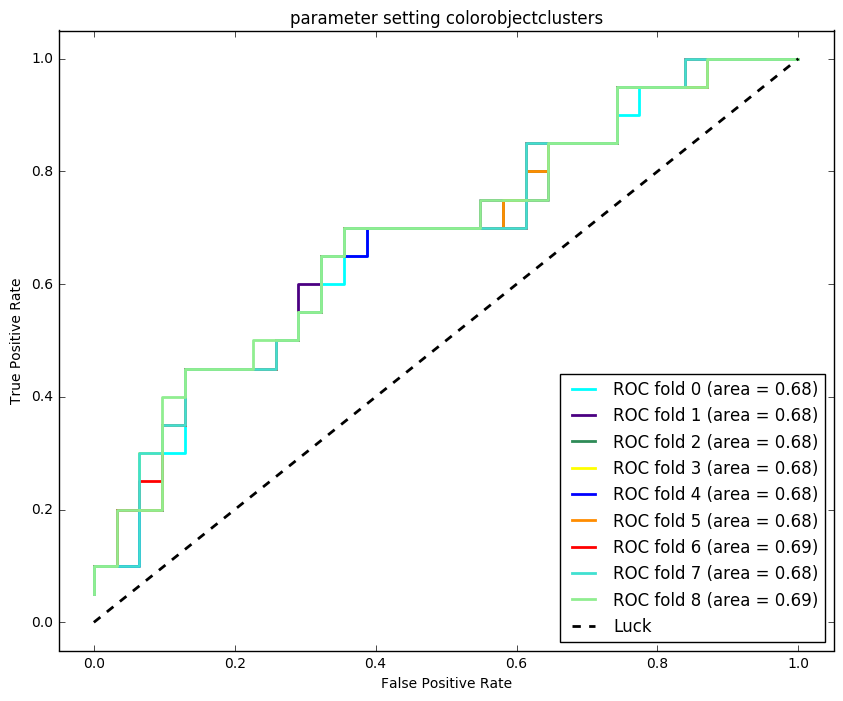

parameter setting cellclusters_maxD5_k90
(276, 8) (51, 8) 276 51
Regularization is  [ 2.7825594]
Fold 0: validation auc = 0.39 and accuracy =0.42
Fold 0: Test auc = 0.67 and accuracy =0.61
Fold 1: validation auc = 0.48 and accuracy =0.52
Fold 1: Test auc = 0.66 and accuracy =0.49
Fold 2: validation auc = 0.70 and accuracy =0.65
Fold 2: Test auc = 0.66 and accuracy =0.43
Fold 3: validation auc = 0.67 and accuracy =0.71
Fold 3: Test auc = 0.69 and accuracy =0.45
Fold 4: validation auc = 0.97 and accuracy =0.71
Fold 4: Test auc = 0.69 and accuracy =0.39
Fold 5: validation auc = 0.76 and accuracy =0.68
Fold 5: Test auc = 0.69 and accuracy =0.43
Fold 6: validation auc = 0.78 and accuracy =0.74
Fold 6: Test auc = 0.70 and accuracy =0.57
Fold 7: validation auc = 0.77 and accuracy =0.70
Fold 7: Test auc = 0.68 and accuracy =0.49
Fold 8: validation auc = 0.81 and accuracy =0.79
Fold 8: Test auc = 0.69 and accuracy =0.53


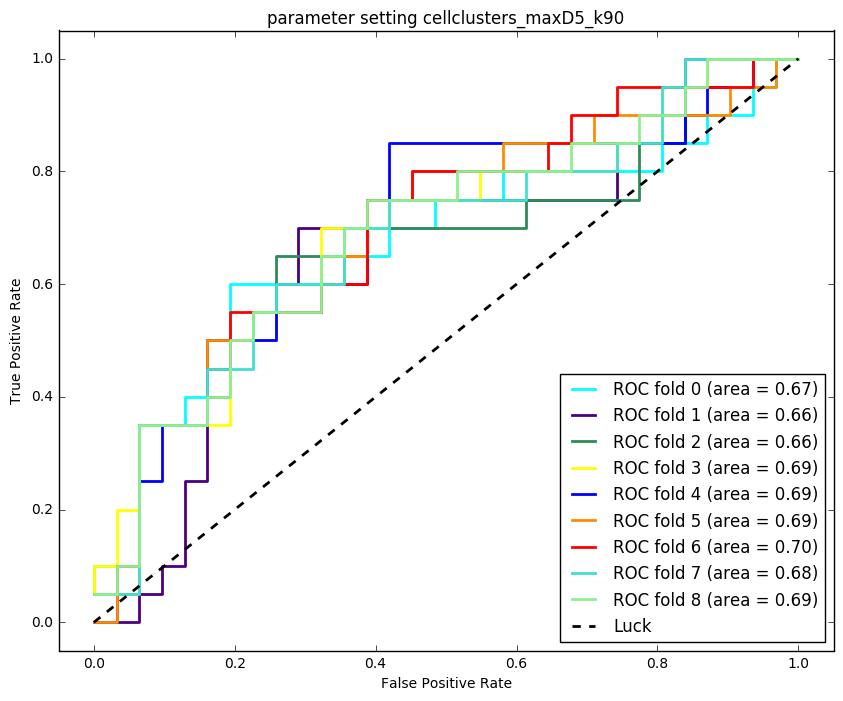

parameter setting cellclusters_maxD5_k90_SI
(276, 7) (51, 7) 276 51
Regularization is  [ 0.04641589]
Fold 0: validation auc = 0.48 and accuracy =0.71
Fold 0: Test auc = 0.64 and accuracy =0.39
Fold 1: validation auc = 0.68 and accuracy =0.71
Fold 1: Test auc = 0.64 and accuracy =0.39
Fold 2: validation auc = 0.56 and accuracy =0.71
Fold 2: Test auc = 0.64 and accuracy =0.39
Fold 3: validation auc = 0.67 and accuracy =0.71
Fold 3: Test auc = 0.64 and accuracy =0.39
Fold 4: validation auc = 0.95 and accuracy =0.71
Fold 4: Test auc = 0.64 and accuracy =0.39
Fold 5: validation auc = 0.85 and accuracy =0.71
Fold 5: Test auc = 0.64 and accuracy =0.39
Fold 6: validation auc = 0.70 and accuracy =0.71
Fold 6: Test auc = 0.64 and accuracy =0.39
Fold 7: validation auc = 0.55 and accuracy =0.73
Fold 7: Test auc = 0.64 and accuracy =0.39
Fold 8: validation auc = 0.72 and accuracy =0.72
Fold 8: Test auc = 0.64 and accuracy =0.39


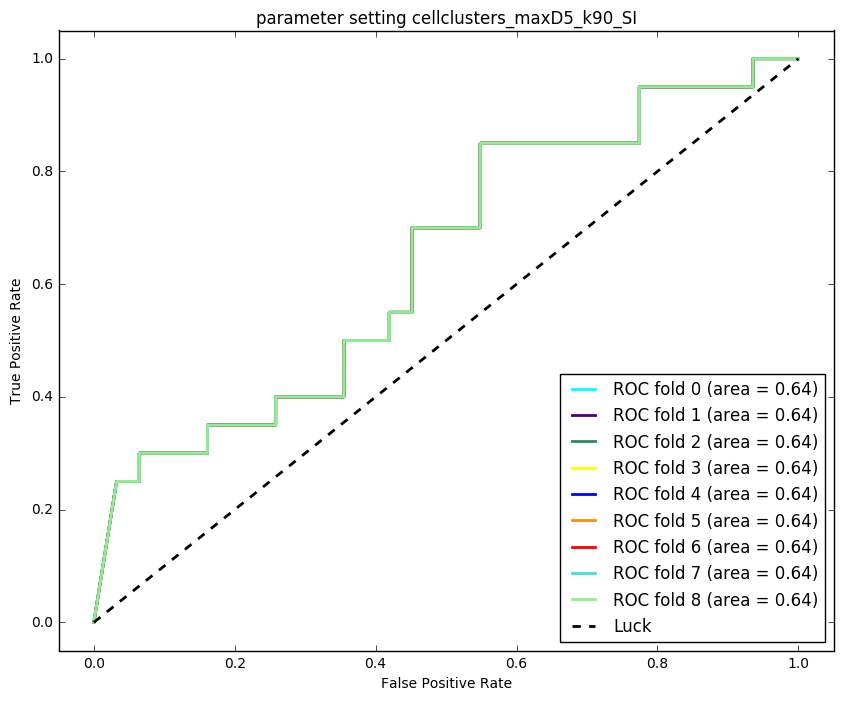

parameter setting cellclusters_maxD5_k95
(276, 14) (51, 14) 276 51
Regularization is  [ 0.04641589]
Fold 0: validation auc = 0.32 and accuracy =0.35
Fold 0: Test auc = 0.65 and accuracy =0.57
Fold 1: validation auc = 0.83 and accuracy =0.71
Fold 1: Test auc = 0.65 and accuracy =0.39
Fold 2: validation auc = 0.57 and accuracy =0.77
Fold 2: Test auc = 0.65 and accuracy =0.35
Fold 3: validation auc = 0.62 and accuracy =0.71
Fold 3: Test auc = 0.65 and accuracy =0.39
Fold 4: validation auc = 0.99 and accuracy =0.71
Fold 4: Test auc = 0.65 and accuracy =0.39
Fold 5: validation auc = 0.85 and accuracy =0.71
Fold 5: Test auc = 0.65 and accuracy =0.39
Fold 6: validation auc = 0.69 and accuracy =0.71
Fold 6: Test auc = 0.65 and accuracy =0.39
Fold 7: validation auc = 0.64 and accuracy =0.73
Fold 7: Test auc = 0.65 and accuracy =0.41
Fold 8: validation auc = 0.71 and accuracy =0.72
Fold 8: Test auc = 0.65 and accuracy =0.37


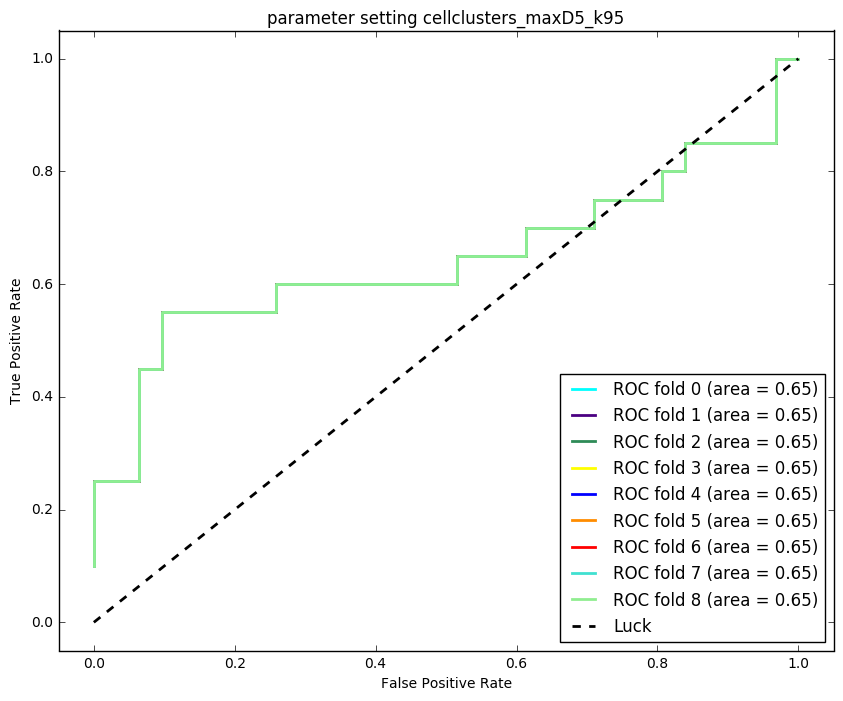

parameter setting cellclusters_maxD5_k95_SI
(276, 9) (51, 9) 276 51
Regularization is  [ 0.35938137]
Fold 0: validation auc = 0.46 and accuracy =0.71
Fold 0: Test auc = 0.59 and accuracy =0.39
Fold 1: validation auc = 0.66 and accuracy =0.71
Fold 1: Test auc = 0.58 and accuracy =0.39
Fold 2: validation auc = 0.66 and accuracy =0.71
Fold 2: Test auc = 0.59 and accuracy =0.39
Fold 3: validation auc = 0.71 and accuracy =0.71
Fold 3: Test auc = 0.59 and accuracy =0.39
Fold 4: validation auc = 0.85 and accuracy =0.71
Fold 4: Test auc = 0.58 and accuracy =0.39
Fold 5: validation auc = 0.75 and accuracy =0.71
Fold 5: Test auc = 0.58 and accuracy =0.39
Fold 6: validation auc = 0.66 and accuracy =0.71
Fold 6: Test auc = 0.59 and accuracy =0.39
Fold 7: validation auc = 0.70 and accuracy =0.73
Fold 7: Test auc = 0.60 and accuracy =0.39
Fold 8: validation auc = 0.68 and accuracy =0.72
Fold 8: Test auc = 0.60 and accuracy =0.39


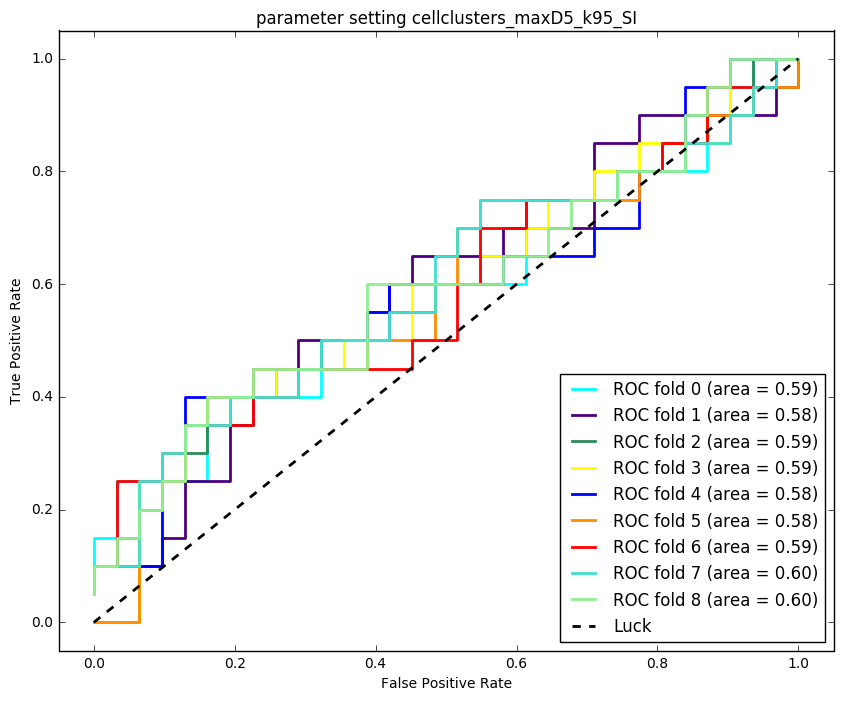

parameter setting cellclusters_maxD10_k90
(276, 13) (51, 13) 276 51
Regularization is  [ 0.04641589]
Fold 0: validation auc = 0.36 and accuracy =0.45
Fold 0: Test auc = 0.75 and accuracy =0.71
Fold 1: validation auc = 0.84 and accuracy =0.71
Fold 1: Test auc = 0.75 and accuracy =0.37
Fold 2: validation auc = 0.65 and accuracy =0.71
Fold 2: Test auc = 0.75 and accuracy =0.51
Fold 3: validation auc = 0.70 and accuracy =0.71
Fold 3: Test auc = 0.75 and accuracy =0.43
Fold 4: validation auc = 0.94 and accuracy =0.71
Fold 4: Test auc = 0.75 and accuracy =0.39
Fold 5: validation auc = 0.80 and accuracy =0.77
Fold 5: Test auc = 0.75 and accuracy =0.37
Fold 6: validation auc = 0.81 and accuracy =0.74
Fold 6: Test auc = 0.75 and accuracy =0.37
Fold 7: validation auc = 0.82 and accuracy =0.73
Fold 7: Test auc = 0.75 and accuracy =0.39
Fold 8: validation auc = 0.79 and accuracy =0.79
Fold 8: Test auc = 0.75 and accuracy =0.49


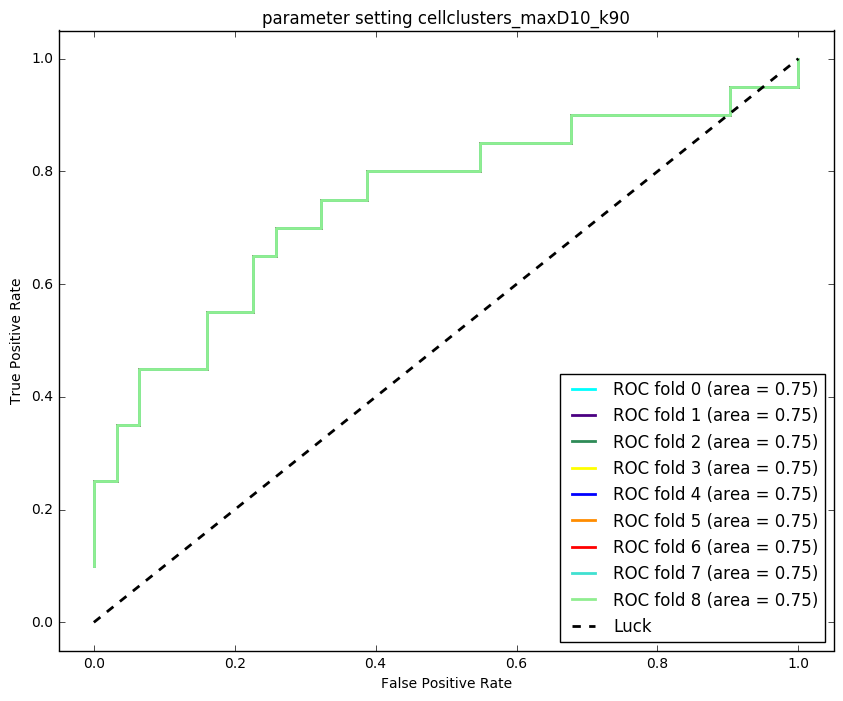

parameter setting cellclusters_maxD10_k90_SI
(276, 11) (51, 11) 276 51
Regularization is  [ 0.04641589]
Fold 0: validation auc = 0.30 and accuracy =0.71
Fold 0: Test auc = 0.58 and accuracy =0.39
Fold 1: validation auc = 0.68 and accuracy =0.71
Fold 1: Test auc = 0.65 and accuracy =0.39
Fold 2: validation auc = 0.62 and accuracy =0.71
Fold 2: Test auc = 0.65 and accuracy =0.39
Fold 3: validation auc = 0.72 and accuracy =0.71
Fold 3: Test auc = 0.58 and accuracy =0.39
Fold 4: validation auc = 0.96 and accuracy =0.71
Fold 4: Test auc = 0.65 and accuracy =0.39
Fold 5: validation auc = 0.82 and accuracy =0.71
Fold 5: Test auc = 0.65 and accuracy =0.39
Fold 6: validation auc = 0.65 and accuracy =0.71
Fold 6: Test auc = 0.65 and accuracy =0.39
Fold 7: validation auc = 0.73 and accuracy =0.73
Fold 7: Test auc = 0.65 and accuracy =0.39
Fold 8: validation auc = 0.70 and accuracy =0.72
Fold 8: Test auc = 0.58 and accuracy =0.39


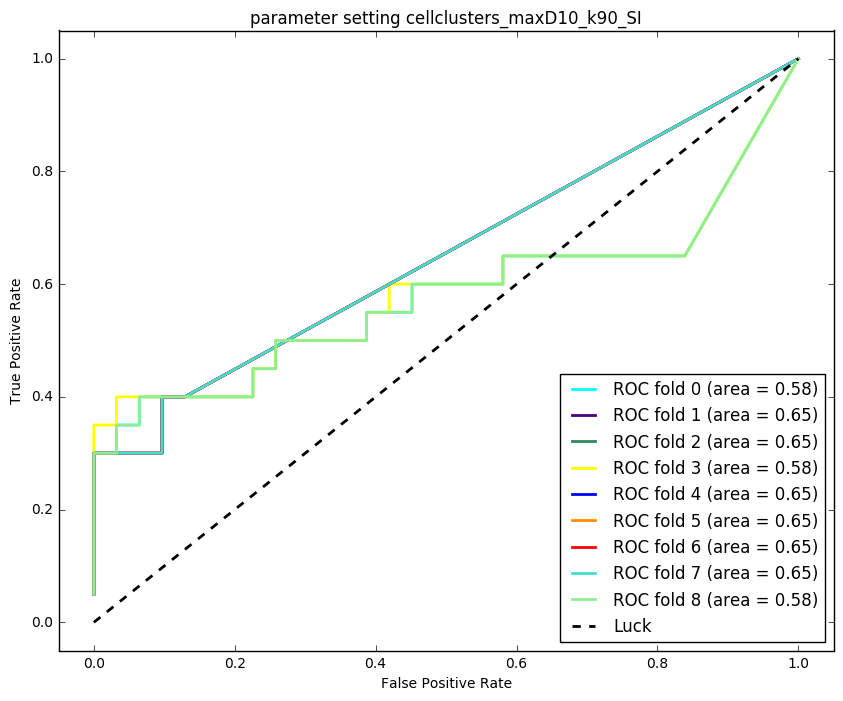

parameter setting cellclusters_maxD10_k95
(276, 14) (51, 14) 276 51
Regularization is  [ 2.7825594]
Fold 0: validation auc = 0.40 and accuracy =0.48
Fold 0: Test auc = 0.72 and accuracy =0.73
Fold 1: validation auc = 0.85 and accuracy =0.68
Fold 1: Test auc = 0.77 and accuracy =0.67
Fold 2: validation auc = 0.62 and accuracy =0.52
Fold 2: Test auc = 0.82 and accuracy =0.69
Fold 3: validation auc = 0.65 and accuracy =0.74
Fold 3: Test auc = 0.82 and accuracy =0.76
Fold 4: validation auc = 0.90 and accuracy =0.74
Fold 4: Test auc = 0.83 and accuracy =0.69
Fold 5: validation auc = 0.68 and accuracy =0.65
Fold 5: Test auc = 0.83 and accuracy =0.76
Fold 6: validation auc = 0.83 and accuracy =0.74
Fold 6: Test auc = 0.82 and accuracy =0.76
Fold 7: validation auc = 0.77 and accuracy =0.83
Fold 7: Test auc = 0.78 and accuracy =0.67
Fold 8: validation auc = 0.70 and accuracy =0.66
Fold 8: Test auc = 0.81 and accuracy =0.73


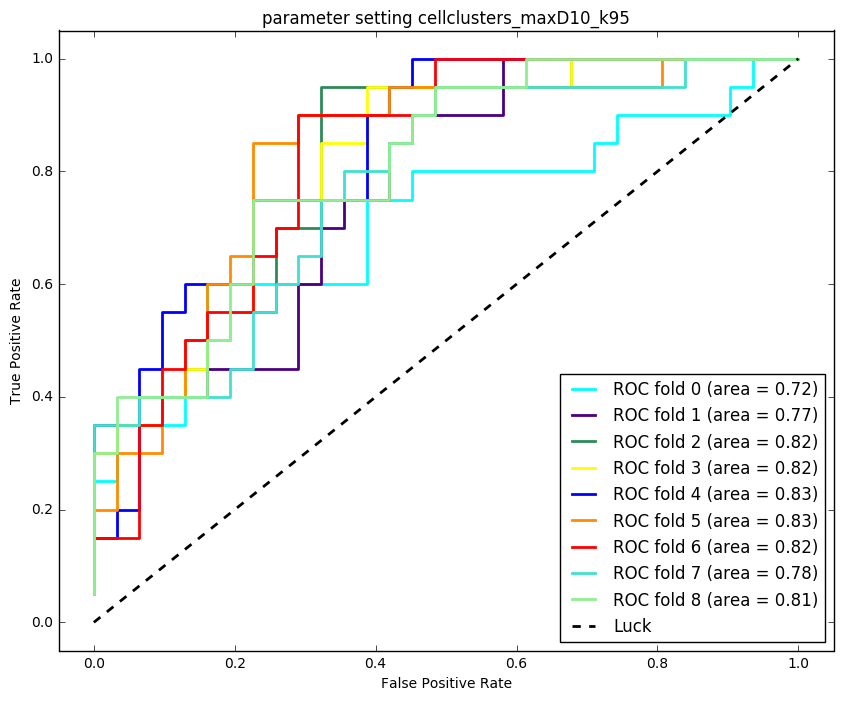

parameter setting cellclusters_maxD10_k95_SI
(276, 17) (51, 17) 276 51
Regularization is  [ 0.35938137]
Fold 0: validation auc = 0.37 and accuracy =0.39
Fold 0: Test auc = 0.63 and accuracy =0.65
Fold 1: validation auc = 0.59 and accuracy =0.61
Fold 1: Test auc = 0.69 and accuracy =0.39
Fold 2: validation auc = 0.59 and accuracy =0.65
Fold 2: Test auc = 0.63 and accuracy =0.39
Fold 3: validation auc = 0.72 and accuracy =0.71
Fold 3: Test auc = 0.63 and accuracy =0.43
Fold 4: validation auc = 1.00 and accuracy =0.71
Fold 4: Test auc = 0.63 and accuracy =0.39
Fold 5: validation auc = 0.80 and accuracy =0.71
Fold 5: Test auc = 0.62 and accuracy =0.39
Fold 6: validation auc = 0.74 and accuracy =0.71
Fold 6: Test auc = 0.62 and accuracy =0.39
Fold 7: validation auc = 0.76 and accuracy =0.73
Fold 7: Test auc = 0.63 and accuracy =0.39
Fold 8: validation auc = 0.77 and accuracy =0.62
Fold 8: Test auc = 0.63 and accuracy =0.63


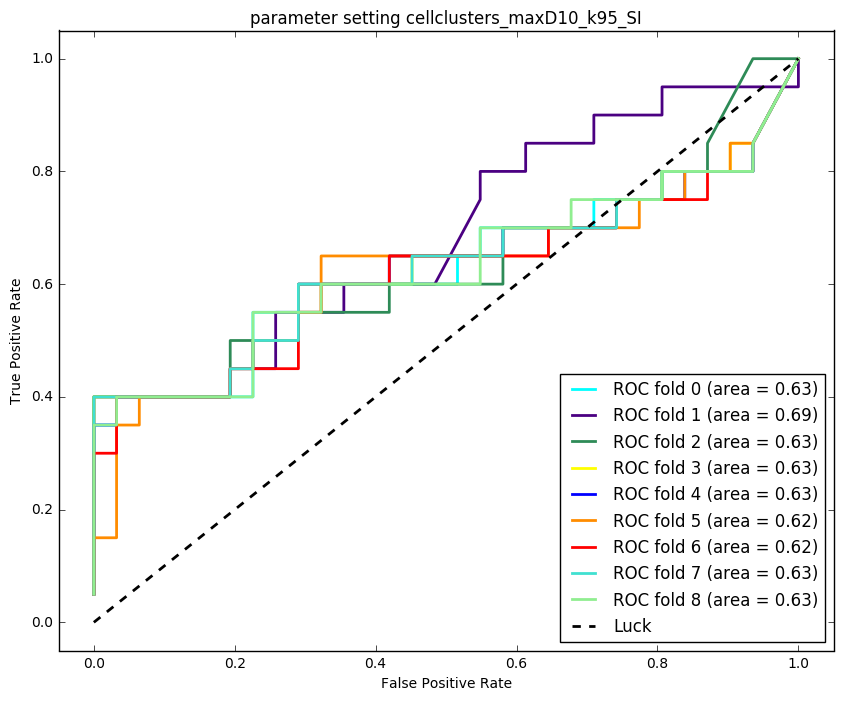

parameter setting combinedcellclusters_maxD5_k90
(276, 9) (51, 9) 276 51
Regularization is  [ 21.5443469]
Fold 0: validation auc = 0.67 and accuracy =0.55
Fold 0: Test auc = 0.66 and accuracy =0.41
Fold 1: validation auc = 0.76 and accuracy =0.68
Fold 1: Test auc = 0.67 and accuracy =0.41
Fold 2: validation auc = 0.75 and accuracy =0.65
Fold 2: Test auc = 0.67 and accuracy =0.47
Fold 3: validation auc = 0.98 and accuracy =0.71
Fold 3: Test auc = 0.65 and accuracy =0.41
Fold 4: validation auc = 0.86 and accuracy =0.74
Fold 4: Test auc = 0.62 and accuracy =0.41
Fold 5: validation auc = 0.82 and accuracy =0.71
Fold 5: Test auc = 0.66 and accuracy =0.45
Fold 6: validation auc = 0.86 and accuracy =0.81
Fold 6: Test auc = 0.66 and accuracy =0.43
Fold 7: validation auc = 0.88 and accuracy =0.80
Fold 7: Test auc = 0.65 and accuracy =0.43
Fold 8: validation auc = 0.71 and accuracy =0.72
Fold 8: Test auc = 0.65 and accuracy =0.45


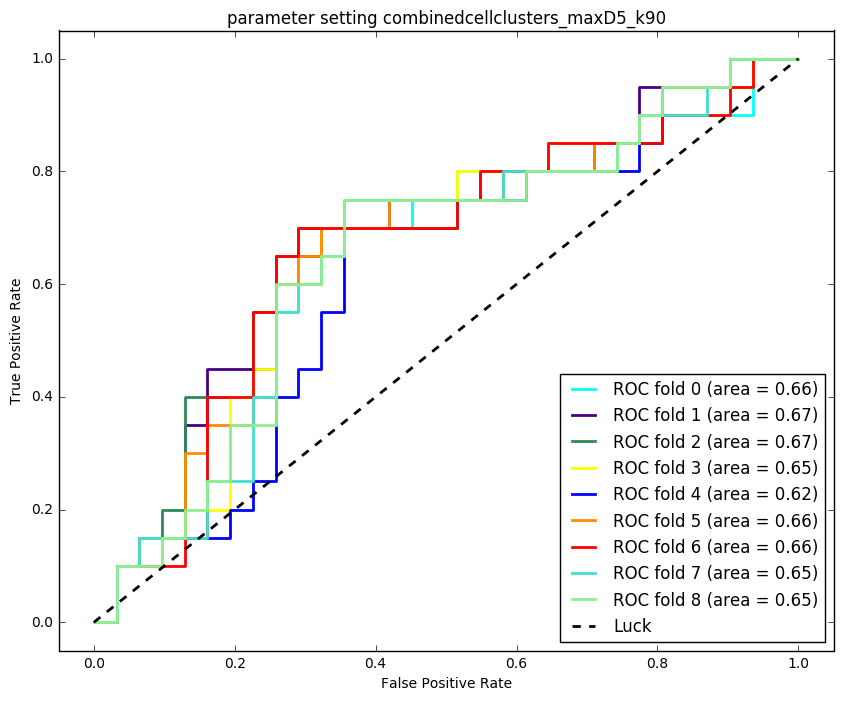

parameter setting combinedcellclusters_maxD5_k90_SI
(276, 11) (51, 11) 276 51
Regularization is  [ 2.7825594]
Fold 0: validation auc = 0.37 and accuracy =0.71
Fold 0: Test auc = 0.58 and accuracy =0.39
Fold 1: validation auc = 0.64 and accuracy =0.71
Fold 1: Test auc = 0.58 and accuracy =0.39
Fold 2: validation auc = 0.41 and accuracy =0.71
Fold 2: Test auc = 0.59 and accuracy =0.39
Fold 3: validation auc = 0.60 and accuracy =0.71
Fold 3: Test auc = 0.56 and accuracy =0.39
Fold 4: validation auc = 0.69 and accuracy =0.71
Fold 4: Test auc = 0.58 and accuracy =0.39
Fold 5: validation auc = 0.58 and accuracy =0.71
Fold 5: Test auc = 0.57 and accuracy =0.39
Fold 6: validation auc = 0.59 and accuracy =0.71
Fold 6: Test auc = 0.58 and accuracy =0.39
Fold 7: validation auc = 0.45 and accuracy =0.73
Fold 7: Test auc = 0.55 and accuracy =0.39
Fold 8: validation auc = 0.43 and accuracy =0.72
Fold 8: Test auc = 0.59 and accuracy =0.39


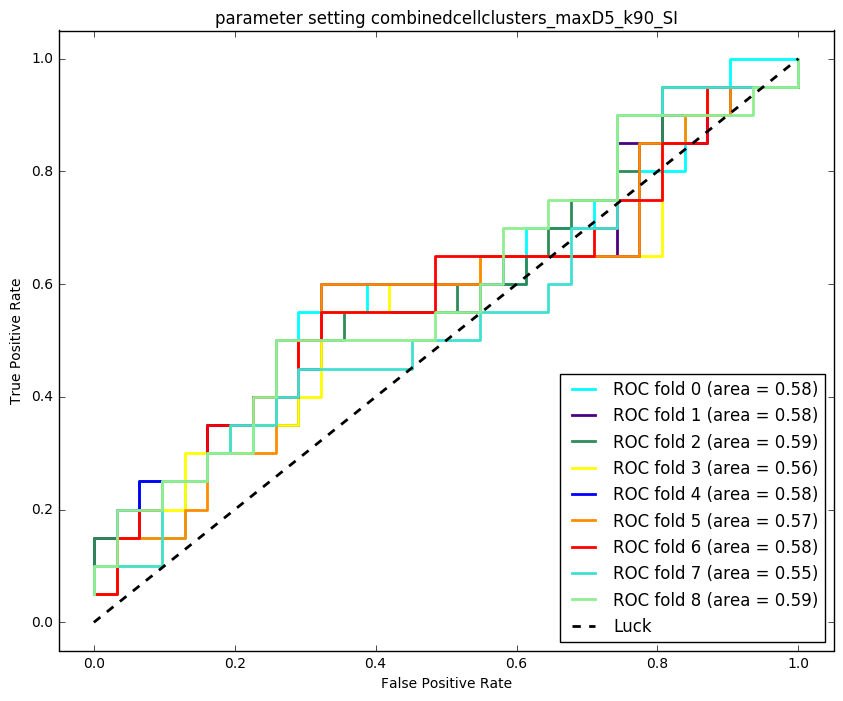

parameter setting combinedcellclusters_maxD5_k95
(276, 17) (51, 17) 276 51
Regularization is  [ 2.7825594]
Fold 0: validation auc = 0.57 and accuracy =0.65
Fold 0: Test auc = 0.65 and accuracy =0.43
Fold 1: validation auc = 0.83 and accuracy =0.84
Fold 1: Test auc = 0.68 and accuracy =0.45
Fold 2: validation auc = 0.60 and accuracy =0.65
Fold 2: Test auc = 0.65 and accuracy =0.43
Fold 3: validation auc = 1.00 and accuracy =0.74
Fold 3: Test auc = 0.66 and accuracy =0.43
Fold 4: validation auc = 0.86 and accuracy =0.87
Fold 4: Test auc = 0.66 and accuracy =0.39
Fold 5: validation auc = 0.84 and accuracy =0.77
Fold 5: Test auc = 0.67 and accuracy =0.39
Fold 6: validation auc = 0.85 and accuracy =0.81
Fold 6: Test auc = 0.66 and accuracy =0.45
Fold 7: validation auc = 0.81 and accuracy =0.77
Fold 7: Test auc = 0.66 and accuracy =0.41
Fold 8: validation auc = 0.73 and accuracy =0.69
Fold 8: Test auc = 0.65 and accuracy =0.43


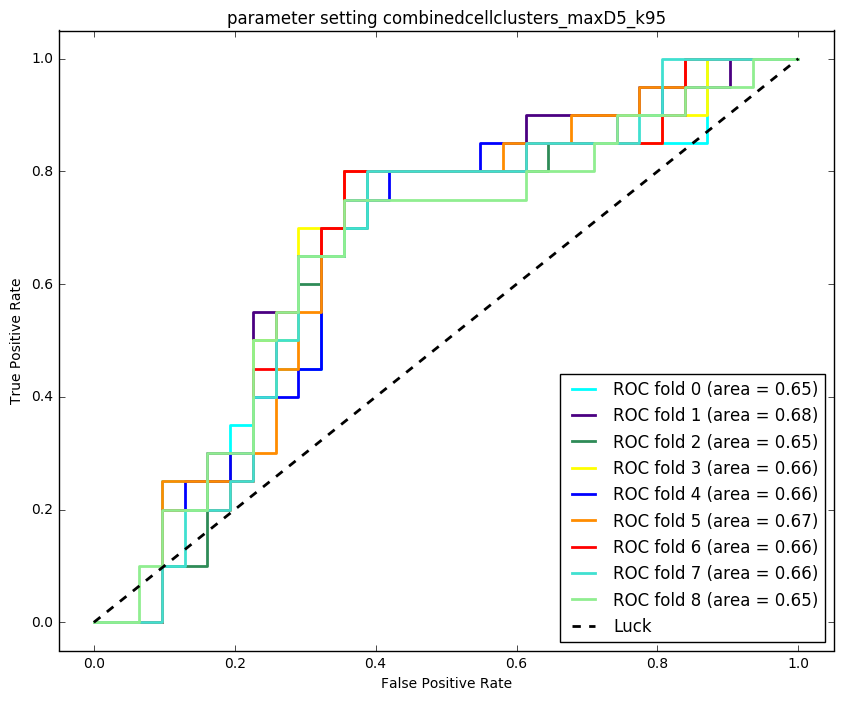

parameter setting combinedcellclusters_maxD5_k95_SI
(276, 12) (51, 12) 276 51
Regularization is  [ 21.5443469]
Fold 0: validation auc = 0.33 and accuracy =0.71
Fold 0: Test auc = 0.57 and accuracy =0.41
Fold 1: validation auc = 0.65 and accuracy =0.71
Fold 1: Test auc = 0.53 and accuracy =0.39
Fold 2: validation auc = 0.43 and accuracy =0.71
Fold 2: Test auc = 0.55 and accuracy =0.39
Fold 3: validation auc = 0.84 and accuracy =0.71
Fold 3: Test auc = 0.57 and accuracy =0.39
Fold 4: validation auc = 0.75 and accuracy =0.71
Fold 4: Test auc = 0.54 and accuracy =0.39
Fold 5: validation auc = 0.68 and accuracy =0.71
Fold 5: Test auc = 0.54 and accuracy =0.39
Fold 6: validation auc = 0.47 and accuracy =0.71
Fold 6: Test auc = 0.53 and accuracy =0.39
Fold 7: validation auc = 0.64 and accuracy =0.73
Fold 7: Test auc = 0.53 and accuracy =0.39
Fold 8: validation auc = 0.75 and accuracy =0.72
Fold 8: Test auc = 0.57 and accuracy =0.39


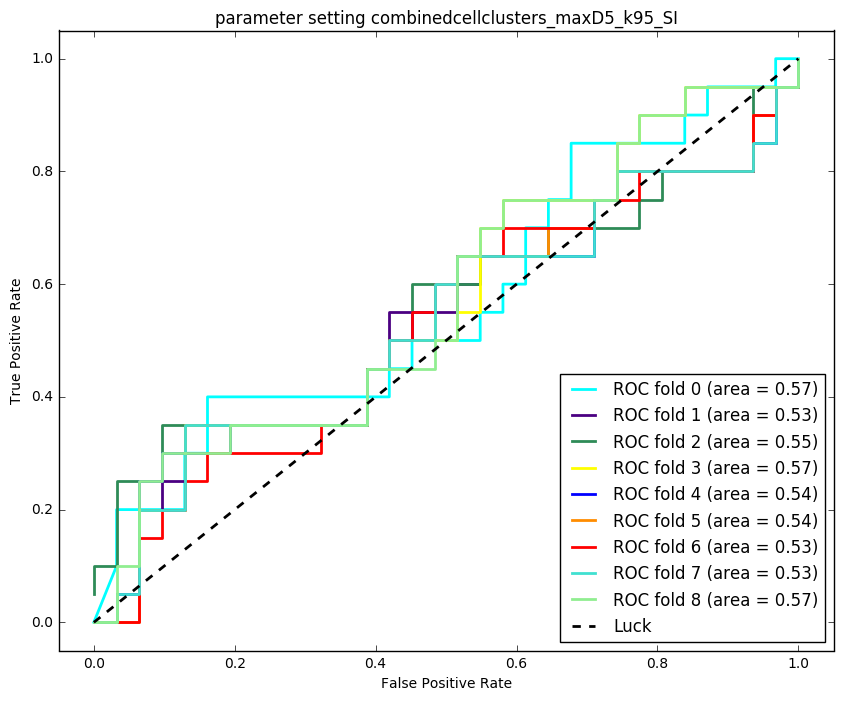

parameter setting combinedcellclusters_maxD10_k90
(276, 10) (51, 10) 276 51
Regularization is  [ 166.81005372]
Fold 0: validation auc = 0.47 and accuracy =0.45
Fold 0: Test auc = 0.74 and accuracy =0.43
Fold 1: validation auc = 0.92 and accuracy =0.81
Fold 1: Test auc = 0.75 and accuracy =0.43
Fold 2: validation auc = 0.75 and accuracy =0.68
Fold 2: Test auc = 0.75 and accuracy =0.41
Fold 3: validation auc = 0.79 and accuracy =0.71
Fold 3: Test auc = 0.74 and accuracy =0.41
Fold 4: validation auc = 0.97 and accuracy =0.87
Fold 4: Test auc = 0.73 and accuracy =0.39
Fold 5: validation auc = 0.93 and accuracy =0.77
Fold 5: Test auc = 0.74 and accuracy =0.41
Fold 6: validation auc = 0.77 and accuracy =0.71
Fold 6: Test auc = 0.74 and accuracy =0.41
Fold 7: validation auc = 0.83 and accuracy =0.73
Fold 7: Test auc = 0.75 and accuracy =0.39
Fold 8: validation auc = 0.79 and accuracy =0.76
Fold 8: Test auc = 0.75 and accuracy =0.41


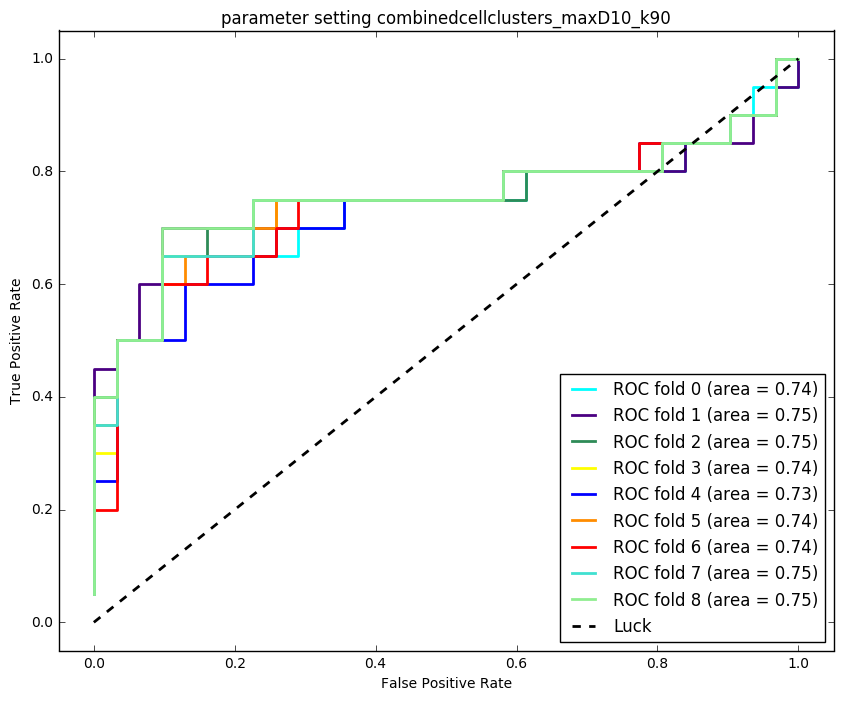

parameter setting combinedcellclusters_maxD10_k90_SI
(276, 18) (51, 18) 276 51
Regularization is  [ 2.7825594]
Fold 0: validation auc = 0.51 and accuracy =0.55
Fold 0: Test auc = 0.62 and accuracy =0.53
Fold 1: validation auc = 0.74 and accuracy =0.68
Fold 1: Test auc = 0.58 and accuracy =0.37
Fold 2: validation auc = 0.71 and accuracy =0.71
Fold 2: Test auc = 0.64 and accuracy =0.39
Fold 3: validation auc = 0.55 and accuracy =0.68
Fold 3: Test auc = 0.65 and accuracy =0.49
Fold 4: validation auc = 0.85 and accuracy =0.71
Fold 4: Test auc = 0.63 and accuracy =0.39
Fold 5: validation auc = 0.79 and accuracy =0.71
Fold 5: Test auc = 0.64 and accuracy =0.39
Fold 6: validation auc = 0.62 and accuracy =0.71
Fold 6: Test auc = 0.62 and accuracy =0.39
Fold 7: validation auc = 0.76 and accuracy =0.73
Fold 7: Test auc = 0.63 and accuracy =0.49
Fold 8: validation auc = 0.59 and accuracy =0.72
Fold 8: Test auc = 0.64 and accuracy =0.53


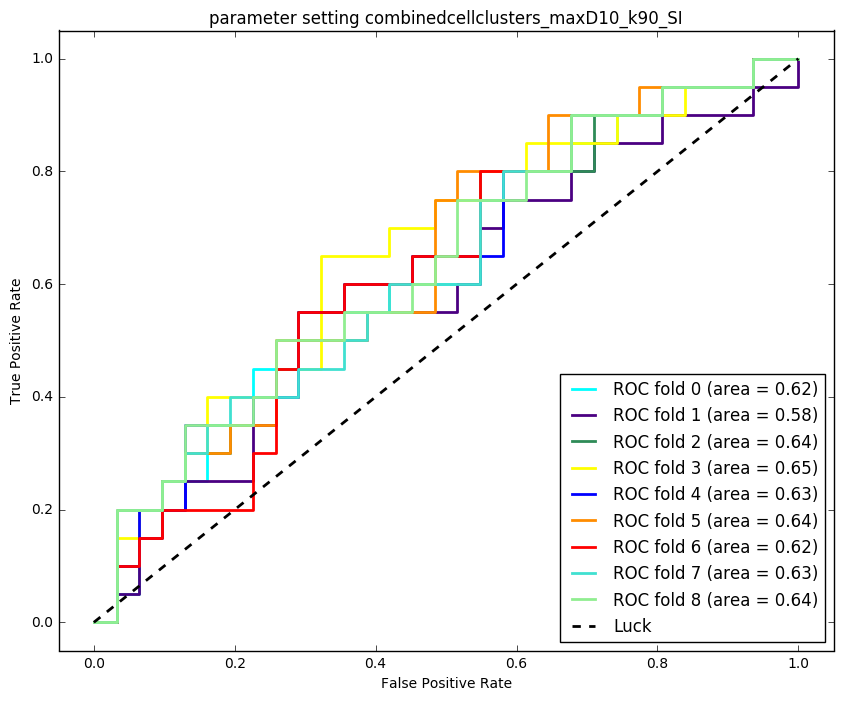

parameter setting combinedcellclusters_maxD10_k95
(276, 23) (51, 23) 276 51
Regularization is  [ 0.35938137]
Fold 0: validation auc = 0.51 and accuracy =0.48
Fold 0: Test auc = 0.76 and accuracy =0.43
Fold 1: validation auc = 0.61 and accuracy =0.68
Fold 1: Test auc = 0.74 and accuracy =0.45
Fold 2: validation auc = 0.72 and accuracy =0.68
Fold 2: Test auc = 0.75 and accuracy =0.43
Fold 3: validation auc = 0.91 and accuracy =0.71
Fold 3: Test auc = 0.76 and accuracy =0.45
Fold 4: validation auc = 0.93 and accuracy =0.84
Fold 4: Test auc = 0.75 and accuracy =0.41
Fold 5: validation auc = 0.97 and accuracy =0.81
Fold 5: Test auc = 0.75 and accuracy =0.37
Fold 6: validation auc = 0.74 and accuracy =0.77
Fold 6: Test auc = 0.75 and accuracy =0.43
Fold 7: validation auc = 0.90 and accuracy =0.77
Fold 7: Test auc = 0.75 and accuracy =0.45
Fold 8: validation auc = 0.80 and accuracy =0.76
Fold 8: Test auc = 0.74 and accuracy =0.45


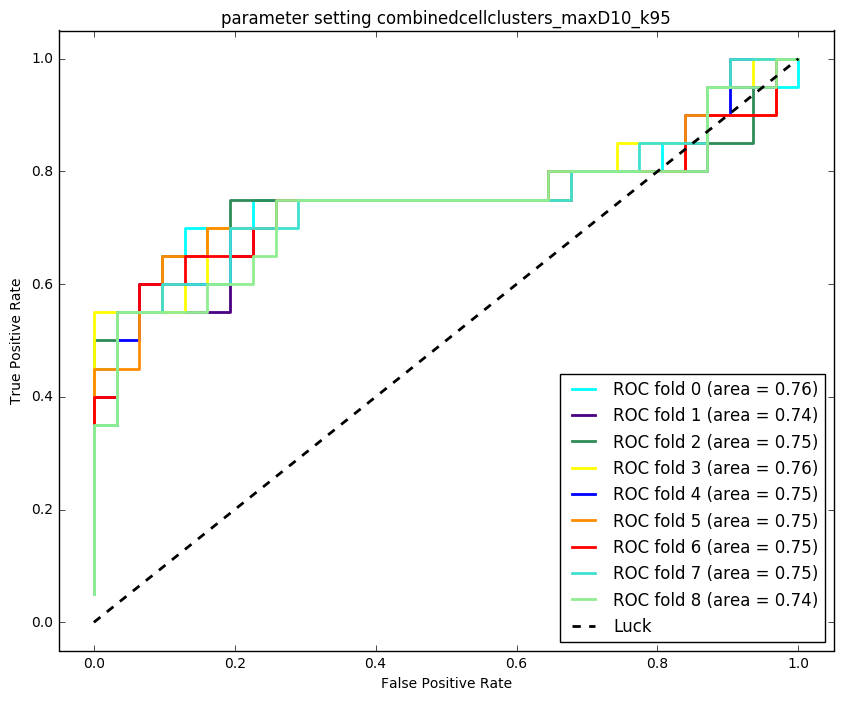

parameter setting combinedcellclusters_maxD10_k95_SI
(276, 22) (51, 22) 276 51
Regularization is  [ 1291.54966501]
Fold 0: validation auc = 0.54 and accuracy =0.52
Fold 0: Test auc = 0.60 and accuracy =0.49
Fold 1: validation auc = 0.76 and accuracy =0.68
Fold 1: Test auc = 0.62 and accuracy =0.45
Fold 2: validation auc = 0.69 and accuracy =0.68
Fold 2: Test auc = 0.59 and accuracy =0.43
Fold 3: validation auc = 0.62 and accuracy =0.68
Fold 3: Test auc = 0.60 and accuracy =0.47
Fold 4: validation auc = 0.69 and accuracy =0.74
Fold 4: Test auc = 0.59 and accuracy =0.45
Fold 5: validation auc = 0.89 and accuracy =0.71
Fold 5: Test auc = 0.61 and accuracy =0.41
Fold 6: validation auc = 0.53 and accuracy =0.74
Fold 6: Test auc = 0.61 and accuracy =0.57
Fold 7: validation auc = 0.80 and accuracy =0.70
Fold 7: Test auc = 0.61 and accuracy =0.55
Fold 8: validation auc = 0.55 and accuracy =0.66
Fold 8: Test auc = 0.61 and accuracy =0.55


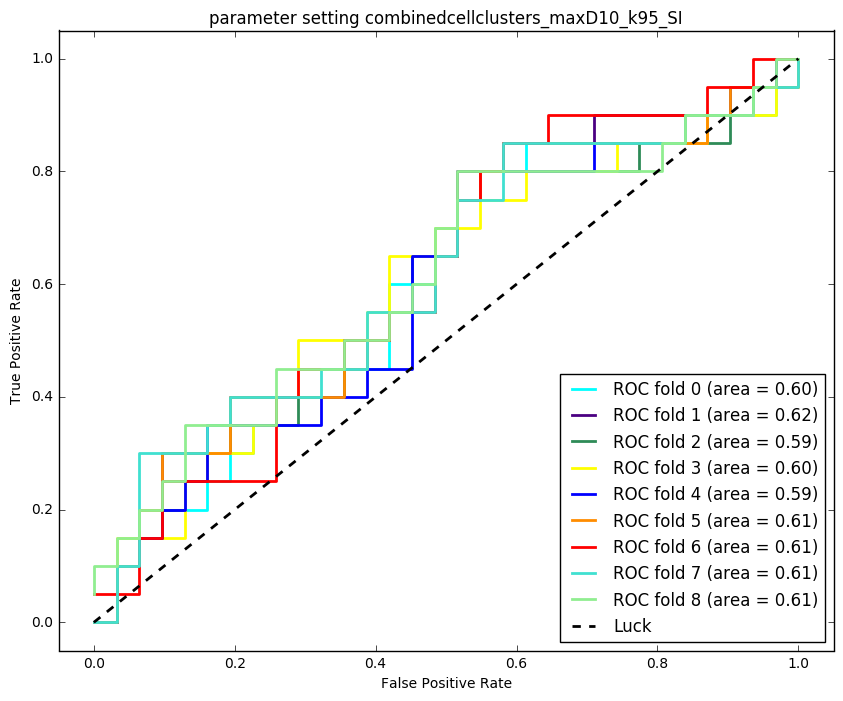

In [258]:
colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2
cv = StratifiedKFold(n_splits=9)

# CaseName = []
# ClassGrade = []
# Hospital = []
# rw_data = []
for param_set in xrange(len(rw_settings)):
    print('parameter setting %s' %(rw_settings[param_set]))
    # read in the file
    CaseName = []
    ClassGrade = []
    Hospital = []
    rw_data = []
    with open(os.path.join(rw_dir, (
                'train_test_list_' + rw_settings[param_set]+'.csv')),'rb') as csvfile:
        f_csv = csv.reader(csvfile,delimiter = ',')
        for row in f_csv:
            CaseName.append(row[0])
            ClassGrade.append(int(row[1]))
            Hospital.append(int(row[2]))
            rw_data.append([float(row[i]) for i in xrange(3,len(row))])
    data = np.vstack(rw_data)
    ClassGrade = np.asarray(ClassGrade)
    ClassLabel = np.asarray([int(ClassGrade[i] > 0) for i in 
                                 xrange(len(ClassGrade))])
    Hospital = np.asarray(Hospital)
    #print rw_data.shape, ClassGrade.shape
    data_train = data[Hospital == 1,:]
    data_test = data[Hospital == 0, :]
    y_train = ClassLabel[Hospital == 1]
    y_test = ClassLabel[Hospital == 0]
    print data_train.shape, data_test.shape, len(y_train), len(y_test)
    ###################################################
    ###################BINARY###################
    ###################################################
    scaler = preprocessing.StandardScaler().fit(data_train)
    data_train_scaled = scaler.transform(data_train)
    data_test_scaled = scaler.transform(data_test)

    X = data_train_scaled
    y = y_train

    random_state = np.random.RandomState(123)
    #C = 5
    
    cv_model = linear_model.LogisticRegressionCV(cv = 9, penalty='l1', scoring='roc_auc',solver='liblinear')
    cv_model.fit(X,y)
    #print model.Cs_
    print 'Regularization is ',cv_model.C_
    C = cv_model.C_[0]
    #clf = linear_model.LogisticRegression(penalty='l1',C = C, random_state=random_state)

    i = 0
    model = []
    model_perf = []
    # story value for cross validation
    fpr_cv = dict()
    tpr_cv = dict()
    auc_cv = dict()
    acc_cv = dict()
    
    plt.figure()
    for (train, test), color in zip(cv.split(X, y), colors):
        clf = linear_model.LogisticRegression(penalty='l1',C = C, random_state=random_state)
        model.append(clf.fit(X[train], y[train]))
        probas_ = model[i].predict_proba(X[test])
        # Compute ROC curve and area the curve
        fpr, tpr, _ = roc_curve(y[test], probas_[:, 1])
        roc_auc = auc(fpr, tpr)
    
        ypred = model[i].predict(X[test])
        acc = accuracy_score(y[test],ypred)
        print('Fold %d: validation auc = %0.2f and accuracy =%0.2f' %(i, roc_auc, acc))
        model_perf.append(roc_auc + acc)
        fpr_cv[(i,'val')] = fpr
        tpr_cv[(i,'val')] = tpr
        auc_cv[(i,'val')] = roc_auc
        acc_cv[(i,'val')] = acc
        
        # onto the test set
        probas_ = model[i].predict_proba(data_test_scaled)
        fpr, tpr, _ = roc_curve(y_test, probas_[:,1])
        roc_auc = auc(fpr, tpr)
        ypred = model[i].predict(data_test_scaled)
        acc = accuracy_score(y_test, ypred)
        
        fpr_cv[(i,'test')] = fpr
        tpr_cv[(i,'test')] = tpr
        auc_cv[(i,'test')] = roc_auc
        acc_cv[(i,'test')] = acc
        
        print('Fold %d: Test auc = %0.2f and accuracy =%0.2f' %(i, roc_auc, acc))
        
        plt.plot(fpr, tpr, lw=lw, color=color,
             label='ROC fold %d (area = %0.2f)' % (i, roc_auc))
    
        i += 1
    plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(('parameter setting %s') %(rw_settings[param_set]))
    plt.legend(loc="lower right")
    plt.show()    
    
    # get the best model
    model_perf = np.asarray(model_perf)
    best_model = np.argmax(model_perf)
    curr_key = (rw_settings[param_set] + '_val' + '_bin' )
    fpr_dict[curr_key] = fpr_cv[(best_model,'val')]
    tpr_dict[curr_key] = tpr_cv[(best_model,'val')]
    acc_dict[curr_key] = acc_cv[(best_model,'val')]
    auc_dict[curr_key] = auc_cv[(best_model,'val')]
    curr_key = (rw_settings[param_set] + '_test' + '_bin' )
    fpr_dict[curr_key] = fpr_cv[(best_model,'test')]
    tpr_dict[curr_key] = tpr_cv[(best_model,'test')]
    acc_dict[curr_key] = acc_cv[(best_model,'test')]
    auc_dict[curr_key] = auc_cv[(best_model,'test')]

parameter setting colorobjectclusters
(276, 8) (51, 8) 276 51
Fold 0: validation auc = 0.83 and accuracy =0.68
Fold 0: Test auc = 0.68 and accuracy =0.53
Fold 1: validation auc = 0.90 and accuracy =0.90
Fold 1: Test auc = 0.68 and accuracy =0.55
Fold 2: validation auc = 0.87 and accuracy =0.74
Fold 2: Test auc = 0.69 and accuracy =0.55
Fold 3: validation auc = 1.00 and accuracy =0.97
Fold 3: Test auc = 0.68 and accuracy =0.53
Fold 4: validation auc = 0.95 and accuracy =0.74
Fold 4: Test auc = 0.69 and accuracy =0.55
Fold 5: validation auc = 0.91 and accuracy =0.74
Fold 5: Test auc = 0.68 and accuracy =0.53
Fold 6: validation auc = 0.84 and accuracy =0.71
Fold 6: Test auc = 0.68 and accuracy =0.53
Fold 7: validation auc = 0.86 and accuracy =0.83
Fold 7: Test auc = 0.68 and accuracy =0.53
Fold 8: validation auc = 0.56 and accuracy =0.59
Fold 8: Test auc = 0.69 and accuracy =0.55


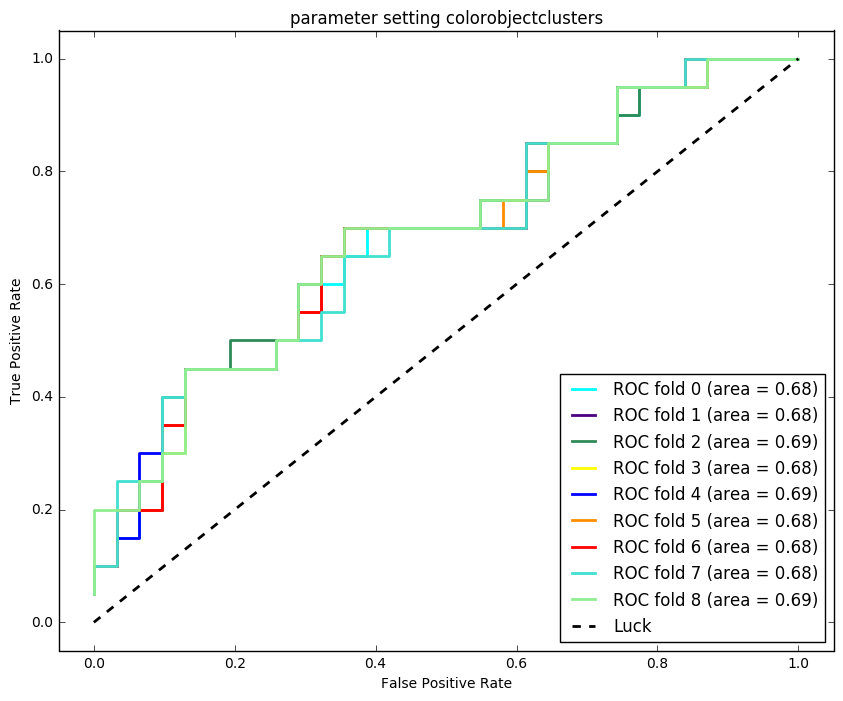

parameter setting cellclusters_maxD5_k90
(276, 8) (51, 8) 276 51
Fold 0: validation auc = 0.38 and accuracy =0.42
Fold 0: Test auc = 0.67 and accuracy =0.61
Fold 1: validation auc = 0.48 and accuracy =0.52
Fold 1: Test auc = 0.65 and accuracy =0.49
Fold 2: validation auc = 0.70 and accuracy =0.65
Fold 2: Test auc = 0.66 and accuracy =0.43
Fold 3: validation auc = 0.67 and accuracy =0.71
Fold 3: Test auc = 0.69 and accuracy =0.45
Fold 4: validation auc = 0.97 and accuracy =0.71
Fold 4: Test auc = 0.69 and accuracy =0.41
Fold 5: validation auc = 0.76 and accuracy =0.68
Fold 5: Test auc = 0.69 and accuracy =0.43
Fold 6: validation auc = 0.78 and accuracy =0.74
Fold 6: Test auc = 0.70 and accuracy =0.57
Fold 7: validation auc = 0.77 and accuracy =0.67
Fold 7: Test auc = 0.68 and accuracy =0.49
Fold 8: validation auc = 0.81 and accuracy =0.79
Fold 8: Test auc = 0.69 and accuracy =0.53


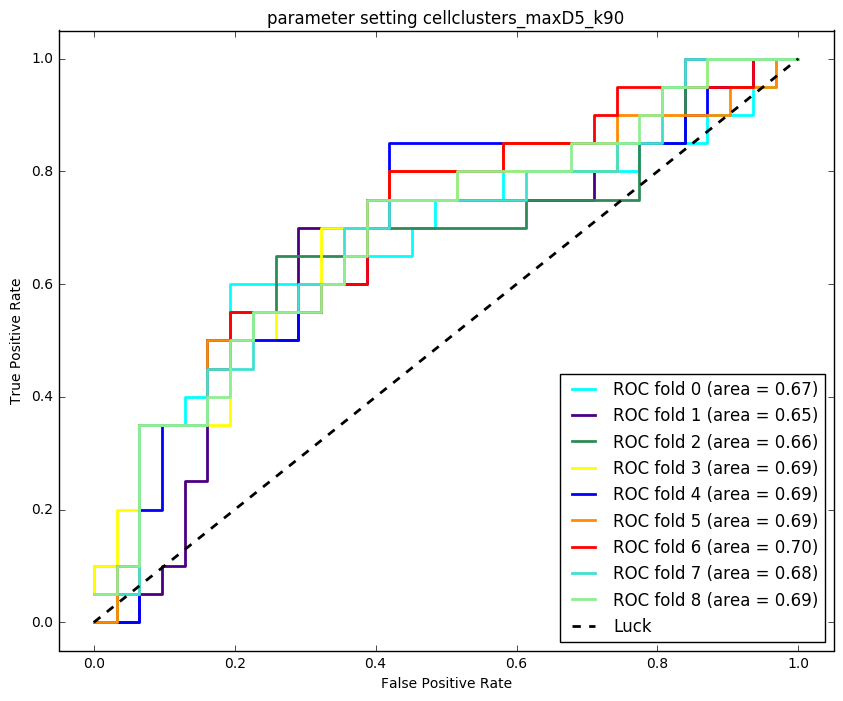

parameter setting cellclusters_maxD5_k90_SI
(276, 7) (51, 7) 276 51
Fold 0: validation auc = 0.42 and accuracy =0.52
Fold 0: Test auc = 0.68 and accuracy =0.57
Fold 1: validation auc = 0.65 and accuracy =0.61
Fold 1: Test auc = 0.53 and accuracy =0.45
Fold 2: validation auc = 0.59 and accuracy =0.61
Fold 2: Test auc = 0.56 and accuracy =0.43
Fold 3: validation auc = 0.58 and accuracy =0.74
Fold 3: Test auc = 0.56 and accuracy =0.43
Fold 4: validation auc = 0.86 and accuracy =0.68
Fold 4: Test auc = 0.53 and accuracy =0.35
Fold 5: validation auc = 0.83 and accuracy =0.68
Fold 5: Test auc = 0.53 and accuracy =0.35
Fold 6: validation auc = 0.70 and accuracy =0.71
Fold 6: Test auc = 0.56 and accuracy =0.35
Fold 7: validation auc = 0.61 and accuracy =0.73
Fold 7: Test auc = 0.56 and accuracy =0.45
Fold 8: validation auc = 0.76 and accuracy =0.72
Fold 8: Test auc = 0.56 and accuracy =0.35


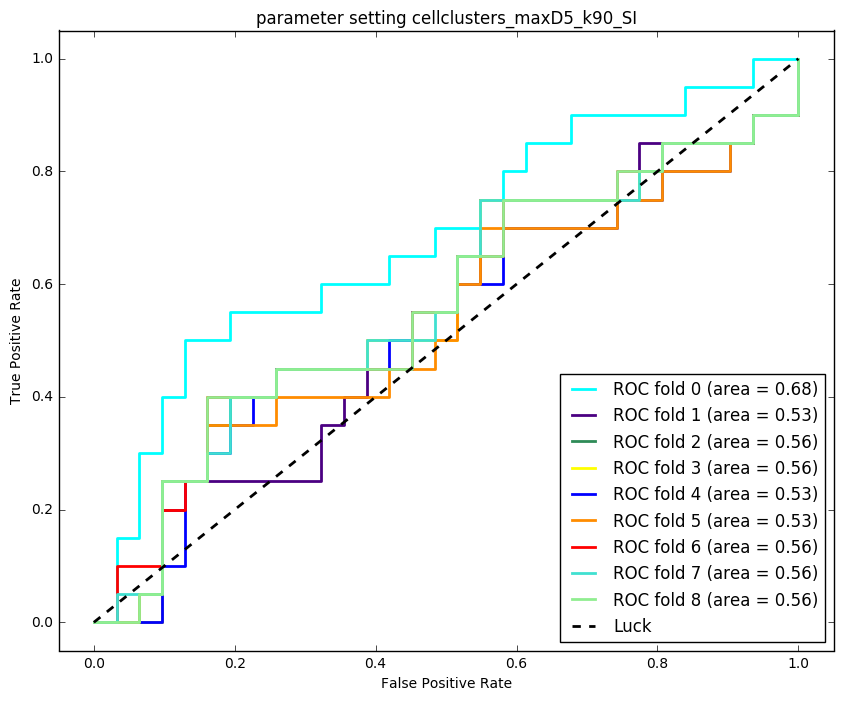

parameter setting cellclusters_maxD5_k95
(276, 14) (51, 14) 276 51
Fold 0: validation auc = 0.31 and accuracy =0.39
Fold 0: Test auc = 0.58 and accuracy =0.53
Fold 1: validation auc = 0.59 and accuracy =0.68
Fold 1: Test auc = 0.53 and accuracy =0.45
Fold 2: validation auc = 0.63 and accuracy =0.71
Fold 2: Test auc = 0.58 and accuracy =0.41
Fold 3: validation auc = 0.64 and accuracy =0.71
Fold 3: Test auc = 0.58 and accuracy =0.45
Fold 4: validation auc = 0.99 and accuracy =0.81
Fold 4: Test auc = 0.57 and accuracy =0.41
Fold 5: validation auc = 0.76 and accuracy =0.68
Fold 5: Test auc = 0.56 and accuracy =0.43
Fold 6: validation auc = 0.66 and accuracy =0.68
Fold 6: Test auc = 0.55 and accuracy =0.39
Fold 7: validation auc = 0.69 and accuracy =0.77
Fold 7: Test auc = 0.58 and accuracy =0.43
Fold 8: validation auc = 0.66 and accuracy =0.69
Fold 8: Test auc = 0.56 and accuracy =0.49


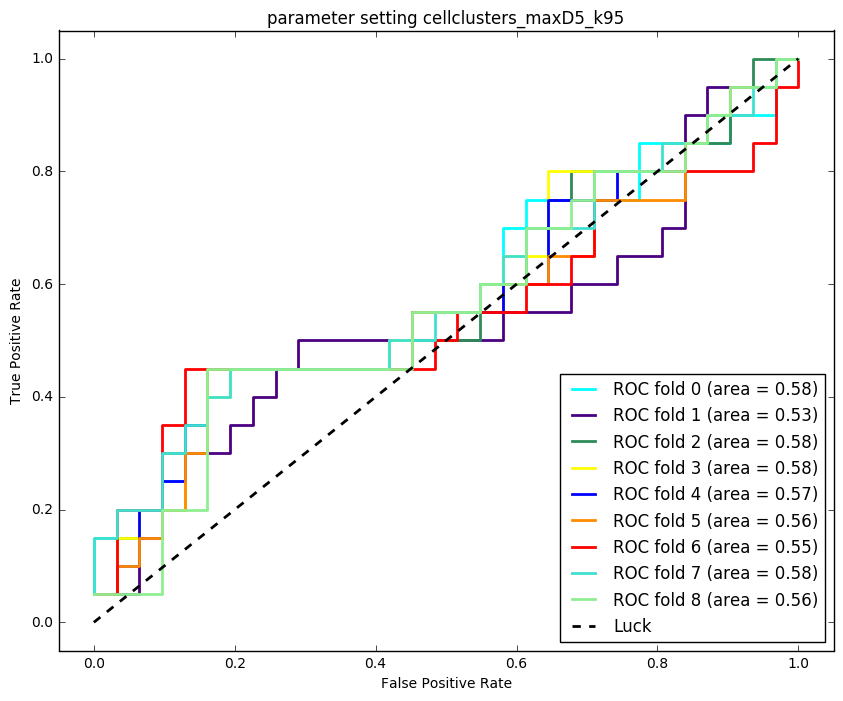

parameter setting cellclusters_maxD5_k95_SI
(276, 9) (51, 9) 276 51
Fold 0: validation auc = 0.44 and accuracy =0.48
Fold 0: Test auc = 0.59 and accuracy =0.41
Fold 1: validation auc = 0.63 and accuracy =0.68
Fold 1: Test auc = 0.59 and accuracy =0.39
Fold 2: validation auc = 0.67 and accuracy =0.71
Fold 2: Test auc = 0.58 and accuracy =0.39
Fold 3: validation auc = 0.72 and accuracy =0.71
Fold 3: Test auc = 0.60 and accuracy =0.39
Fold 4: validation auc = 0.84 and accuracy =0.71
Fold 4: Test auc = 0.57 and accuracy =0.39
Fold 5: validation auc = 0.77 and accuracy =0.71
Fold 5: Test auc = 0.58 and accuracy =0.39
Fold 6: validation auc = 0.63 and accuracy =0.71
Fold 6: Test auc = 0.58 and accuracy =0.39
Fold 7: validation auc = 0.69 and accuracy =0.73
Fold 7: Test auc = 0.59 and accuracy =0.39
Fold 8: validation auc = 0.69 and accuracy =0.72
Fold 8: Test auc = 0.58 and accuracy =0.39


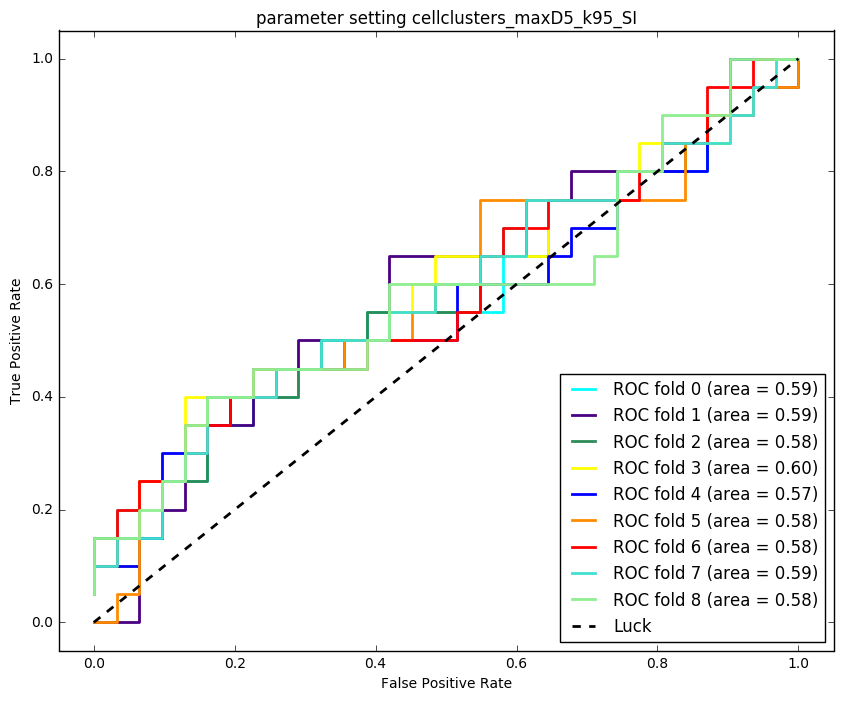

parameter setting cellclusters_maxD10_k90
(276, 13) (51, 13) 276 51
Fold 0: validation auc = 0.32 and accuracy =0.42
Fold 0: Test auc = 0.64 and accuracy =0.63
Fold 1: validation auc = 0.71 and accuracy =0.74
Fold 1: Test auc = 0.66 and accuracy =0.49
Fold 2: validation auc = 0.64 and accuracy =0.68
Fold 2: Test auc = 0.69 and accuracy =0.53
Fold 3: validation auc = 0.62 and accuracy =0.71
Fold 3: Test auc = 0.67 and accuracy =0.51
Fold 4: validation auc = 0.90 and accuracy =0.74
Fold 4: Test auc = 0.74 and accuracy =0.53
Fold 5: validation auc = 0.79 and accuracy =0.74
Fold 5: Test auc = 0.67 and accuracy =0.49
Fold 6: validation auc = 0.77 and accuracy =0.71
Fold 6: Test auc = 0.67 and accuracy =0.51
Fold 7: validation auc = 0.78 and accuracy =0.83
Fold 7: Test auc = 0.67 and accuracy =0.51
Fold 8: validation auc = 0.79 and accuracy =0.72
Fold 8: Test auc = 0.67 and accuracy =0.53


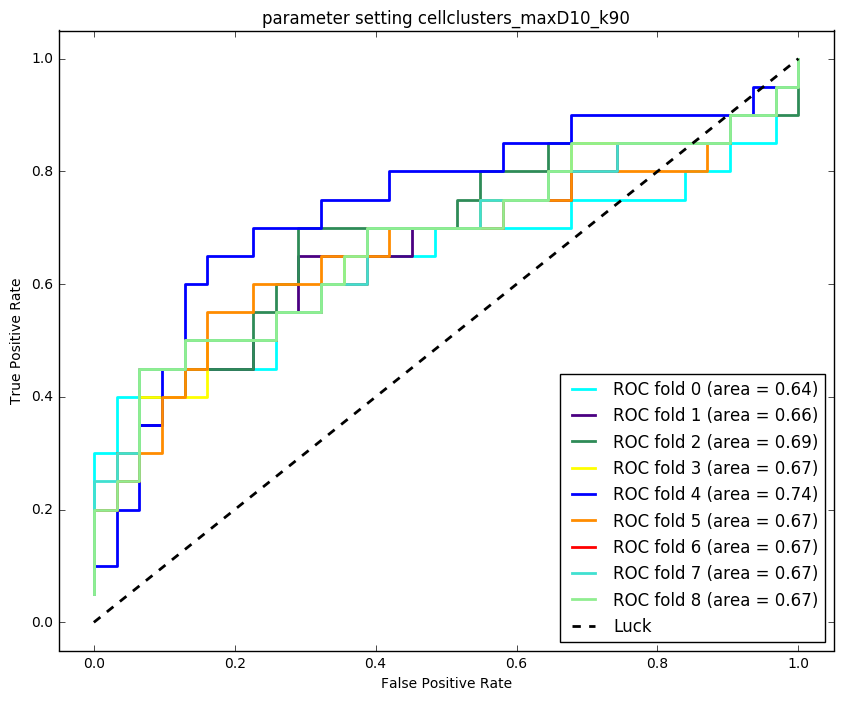

parameter setting cellclusters_maxD10_k90_SI
(276, 11) (51, 11) 276 51
Fold 0: validation auc = 0.30 and accuracy =0.39
Fold 0: Test auc = 0.58 and accuracy =0.63
Fold 1: validation auc = 0.58 and accuracy =0.61
Fold 1: Test auc = 0.59 and accuracy =0.39
Fold 2: validation auc = 0.64 and accuracy =0.71
Fold 2: Test auc = 0.58 and accuracy =0.39
Fold 3: validation auc = 0.74 and accuracy =0.71
Fold 3: Test auc = 0.58 and accuracy =0.39
Fold 4: validation auc = 0.97 and accuracy =0.71
Fold 4: Test auc = 0.58 and accuracy =0.39
Fold 5: validation auc = 0.73 and accuracy =0.71
Fold 5: Test auc = 0.58 and accuracy =0.39
Fold 6: validation auc = 0.70 and accuracy =0.71
Fold 6: Test auc = 0.58 and accuracy =0.39
Fold 7: validation auc = 0.76 and accuracy =0.73
Fold 7: Test auc = 0.58 and accuracy =0.39
Fold 8: validation auc = 0.71 and accuracy =0.72
Fold 8: Test auc = 0.58 and accuracy =0.39


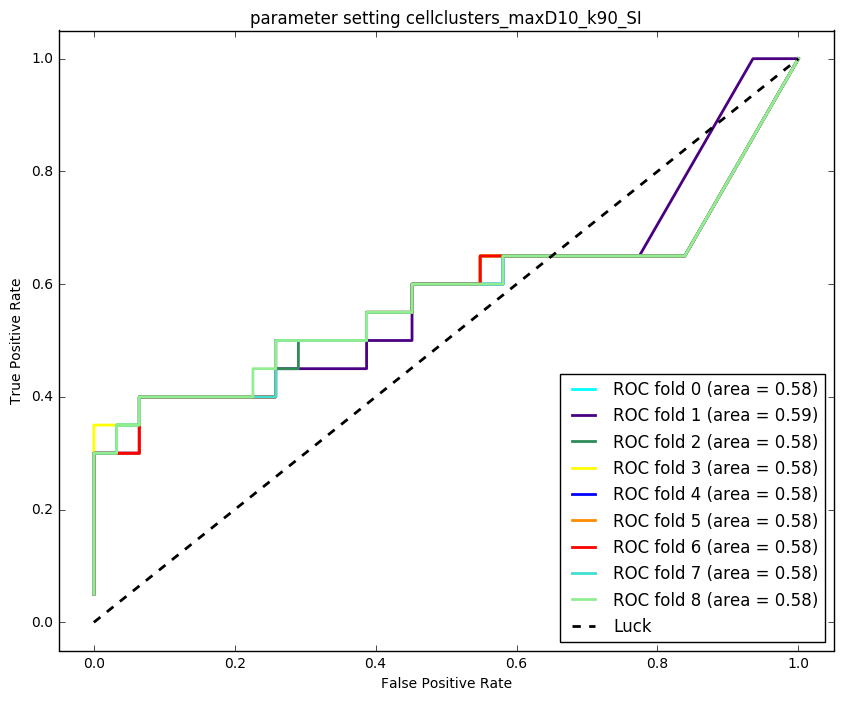

parameter setting cellclusters_maxD10_k95
(276, 14) (51, 14) 276 51
Fold 0: validation auc = 0.40 and accuracy =0.45
Fold 0: Test auc = 0.71 and accuracy =0.73
Fold 1: validation auc = 0.84 and accuracy =0.68
Fold 1: Test auc = 0.77 and accuracy =0.67
Fold 2: validation auc = 0.62 and accuracy =0.52
Fold 2: Test auc = 0.82 and accuracy =0.69
Fold 3: validation auc = 0.66 and accuracy =0.74
Fold 3: Test auc = 0.82 and accuracy =0.76
Fold 4: validation auc = 0.90 and accuracy =0.74
Fold 4: Test auc = 0.83 and accuracy =0.71
Fold 5: validation auc = 0.69 and accuracy =0.65
Fold 5: Test auc = 0.82 and accuracy =0.76
Fold 6: validation auc = 0.82 and accuracy =0.74
Fold 6: Test auc = 0.82 and accuracy =0.76
Fold 7: validation auc = 0.77 and accuracy =0.83
Fold 7: Test auc = 0.78 and accuracy =0.67
Fold 8: validation auc = 0.69 and accuracy =0.66
Fold 8: Test auc = 0.82 and accuracy =0.73


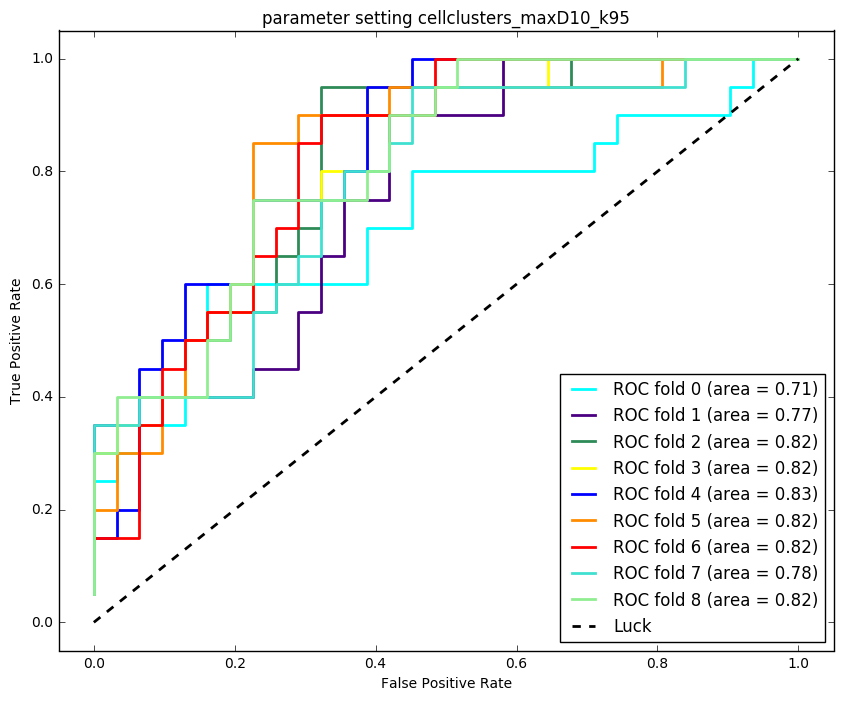

parameter setting cellclusters_maxD10_k95_SI
(276, 17) (51, 17) 276 51
Fold 0: validation auc = 0.37 and accuracy =0.42
Fold 0: Test auc = 0.63 and accuracy =0.65
Fold 1: validation auc = 0.61 and accuracy =0.55
Fold 1: Test auc = 0.67 and accuracy =0.39
Fold 2: validation auc = 0.54 and accuracy =0.52
Fold 2: Test auc = 0.63 and accuracy =0.63
Fold 3: validation auc = 0.73 and accuracy =0.71
Fold 3: Test auc = 0.63 and accuracy =0.63
Fold 4: validation auc = 0.93 and accuracy =0.68
Fold 4: Test auc = 0.62 and accuracy =0.39
Fold 5: validation auc = 0.80 and accuracy =0.71
Fold 5: Test auc = 0.62 and accuracy =0.39
Fold 6: validation auc = 0.79 and accuracy =0.71
Fold 6: Test auc = 0.61 and accuracy =0.39
Fold 7: validation auc = 0.77 and accuracy =0.73
Fold 7: Test auc = 0.62 and accuracy =0.39
Fold 8: validation auc = 0.77 and accuracy =0.59
Fold 8: Test auc = 0.62 and accuracy =0.67


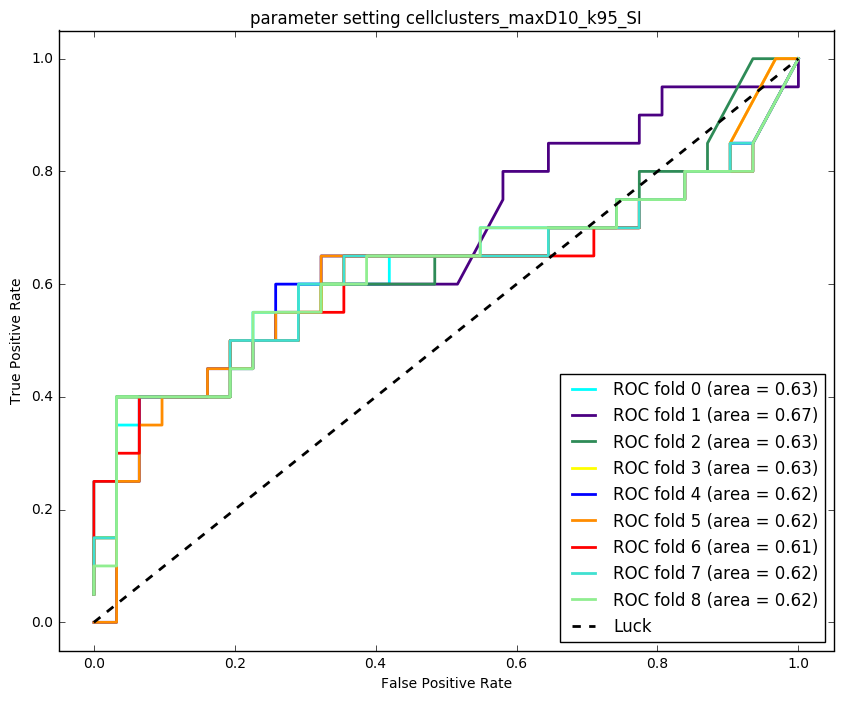

parameter setting combinedcellclusters_maxD5_k90
(276, 9) (51, 9) 276 51
Fold 0: validation auc = 0.66 and accuracy =0.55
Fold 0: Test auc = 0.66 and accuracy =0.41
Fold 1: validation auc = 0.76 and accuracy =0.68
Fold 1: Test auc = 0.67 and accuracy =0.41
Fold 2: validation auc = 0.75 and accuracy =0.65
Fold 2: Test auc = 0.67 and accuracy =0.47
Fold 3: validation auc = 0.98 and accuracy =0.71
Fold 3: Test auc = 0.65 and accuracy =0.41
Fold 4: validation auc = 0.86 and accuracy =0.74
Fold 4: Test auc = 0.62 and accuracy =0.41
Fold 5: validation auc = 0.82 and accuracy =0.71
Fold 5: Test auc = 0.66 and accuracy =0.45
Fold 6: validation auc = 0.86 and accuracy =0.81
Fold 6: Test auc = 0.66 and accuracy =0.43
Fold 7: validation auc = 0.88 and accuracy =0.80
Fold 7: Test auc = 0.64 and accuracy =0.43
Fold 8: validation auc = 0.71 and accuracy =0.72
Fold 8: Test auc = 0.65 and accuracy =0.45


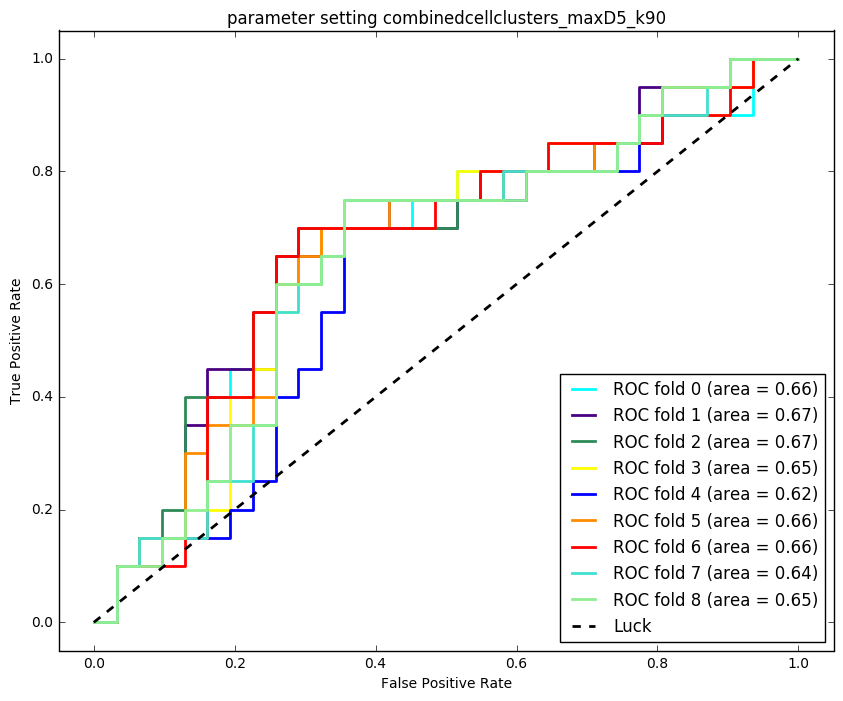

parameter setting combinedcellclusters_maxD5_k90_SI
(276, 11) (51, 11) 276 51
Fold 0: validation auc = 0.37 and accuracy =0.71
Fold 0: Test auc = 0.59 and accuracy =0.39
Fold 1: validation auc = 0.64 and accuracy =0.71
Fold 1: Test auc = 0.58 and accuracy =0.39
Fold 2: validation auc = 0.40 and accuracy =0.71
Fold 2: Test auc = 0.59 and accuracy =0.39
Fold 3: validation auc = 0.60 and accuracy =0.71
Fold 3: Test auc = 0.56 and accuracy =0.39
Fold 4: validation auc = 0.69 and accuracy =0.71
Fold 4: Test auc = 0.58 and accuracy =0.39
Fold 5: validation auc = 0.57 and accuracy =0.71
Fold 5: Test auc = 0.56 and accuracy =0.39
Fold 6: validation auc = 0.60 and accuracy =0.71
Fold 6: Test auc = 0.59 and accuracy =0.39
Fold 7: validation auc = 0.45 and accuracy =0.73
Fold 7: Test auc = 0.56 and accuracy =0.39
Fold 8: validation auc = 0.42 and accuracy =0.72
Fold 8: Test auc = 0.59 and accuracy =0.39


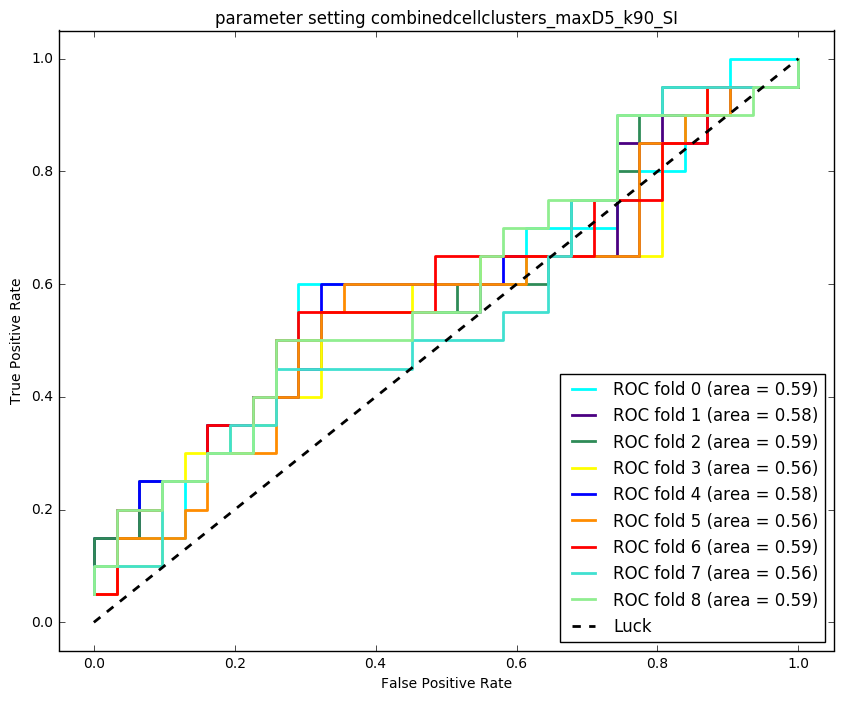

parameter setting combinedcellclusters_maxD5_k95
(276, 17) (51, 17) 276 51
Fold 0: validation auc = 0.57 and accuracy =0.65
Fold 0: Test auc = 0.65 and accuracy =0.43
Fold 1: validation auc = 0.83 and accuracy =0.84
Fold 1: Test auc = 0.68 and accuracy =0.45
Fold 2: validation auc = 0.60 and accuracy =0.65
Fold 2: Test auc = 0.66 and accuracy =0.43
Fold 3: validation auc = 1.00 and accuracy =0.74
Fold 3: Test auc = 0.67 and accuracy =0.43
Fold 4: validation auc = 0.85 and accuracy =0.87
Fold 4: Test auc = 0.66 and accuracy =0.39
Fold 5: validation auc = 0.84 and accuracy =0.77
Fold 5: Test auc = 0.67 and accuracy =0.41
Fold 6: validation auc = 0.85 and accuracy =0.81
Fold 6: Test auc = 0.67 and accuracy =0.45
Fold 7: validation auc = 0.80 and accuracy =0.77
Fold 7: Test auc = 0.66 and accuracy =0.41
Fold 8: validation auc = 0.73 and accuracy =0.69
Fold 8: Test auc = 0.65 and accuracy =0.43


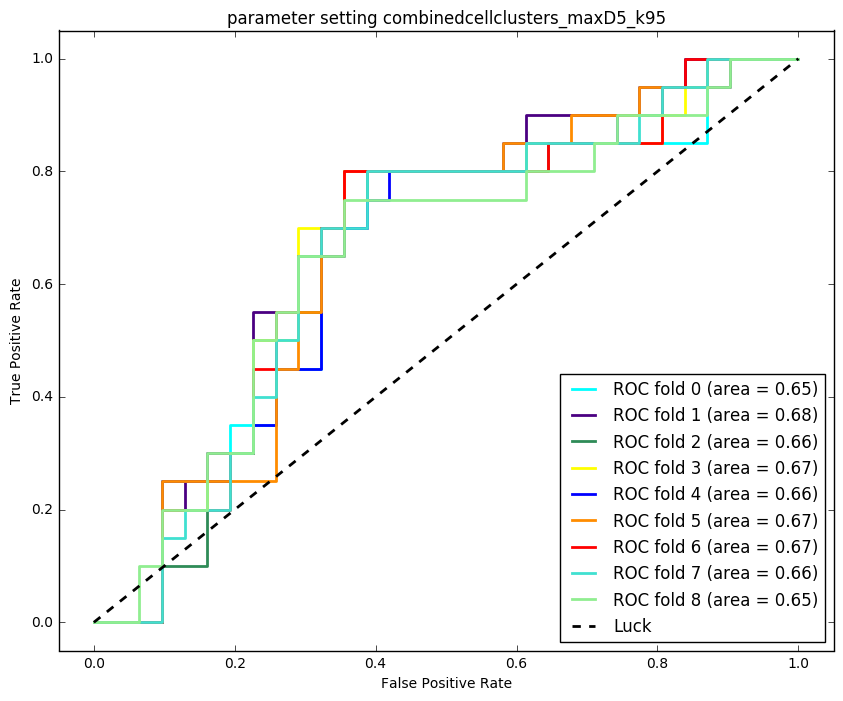

parameter setting combinedcellclusters_maxD5_k95_SI
(276, 12) (51, 12) 276 51
Fold 0: validation auc = 0.32 and accuracy =0.71
Fold 0: Test auc = 0.60 and accuracy =0.39
Fold 1: validation auc = 0.65 and accuracy =0.71
Fold 1: Test auc = 0.53 and accuracy =0.39
Fold 2: validation auc = 0.44 and accuracy =0.71
Fold 2: Test auc = 0.54 and accuracy =0.39
Fold 3: validation auc = 0.84 and accuracy =0.71
Fold 3: Test auc = 0.57 and accuracy =0.39
Fold 4: validation auc = 0.75 and accuracy =0.71
Fold 4: Test auc = 0.54 and accuracy =0.39
Fold 5: validation auc = 0.68 and accuracy =0.71
Fold 5: Test auc = 0.54 and accuracy =0.39
Fold 6: validation auc = 0.47 and accuracy =0.71
Fold 6: Test auc = 0.53 and accuracy =0.39
Fold 7: validation auc = 0.64 and accuracy =0.73
Fold 7: Test auc = 0.53 and accuracy =0.39
Fold 8: validation auc = 0.74 and accuracy =0.72
Fold 8: Test auc = 0.57 and accuracy =0.39


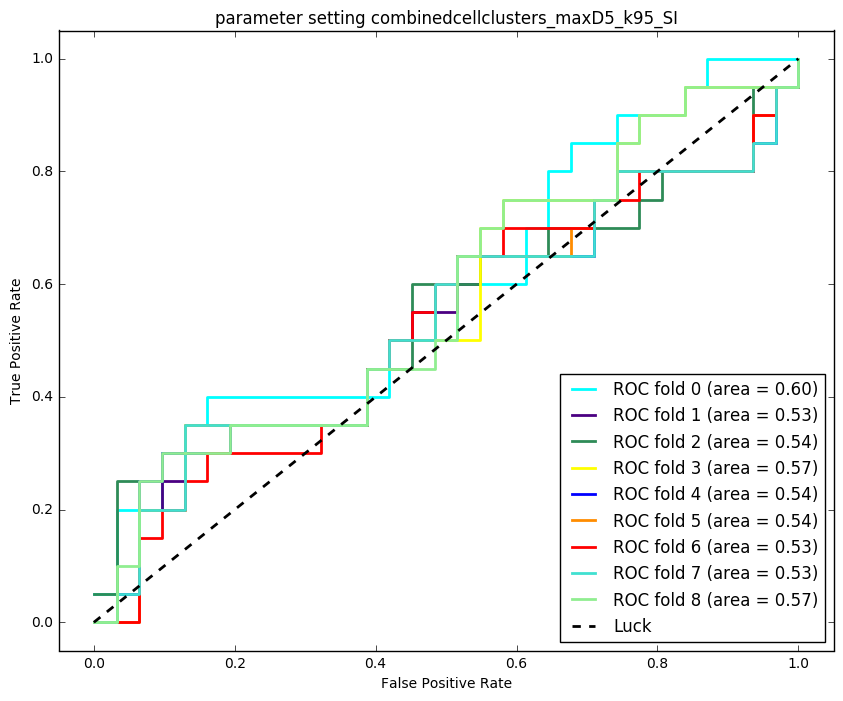

parameter setting combinedcellclusters_maxD10_k90
(276, 10) (51, 10) 276 51
Fold 0: validation auc = 0.47 and accuracy =0.45
Fold 0: Test auc = 0.74 and accuracy =0.43
Fold 1: validation auc = 0.90 and accuracy =0.81
Fold 1: Test auc = 0.75 and accuracy =0.43
Fold 2: validation auc = 0.74 and accuracy =0.68
Fold 2: Test auc = 0.75 and accuracy =0.41
Fold 3: validation auc = 0.79 and accuracy =0.71
Fold 3: Test auc = 0.74 and accuracy =0.39
Fold 4: validation auc = 0.97 and accuracy =0.87
Fold 4: Test auc = 0.73 and accuracy =0.39
Fold 5: validation auc = 0.93 and accuracy =0.77
Fold 5: Test auc = 0.75 and accuracy =0.41
Fold 6: validation auc = 0.77 and accuracy =0.71
Fold 6: Test auc = 0.74 and accuracy =0.41
Fold 7: validation auc = 0.83 and accuracy =0.77
Fold 7: Test auc = 0.75 and accuracy =0.39
Fold 8: validation auc = 0.79 and accuracy =0.76
Fold 8: Test auc = 0.75 and accuracy =0.41


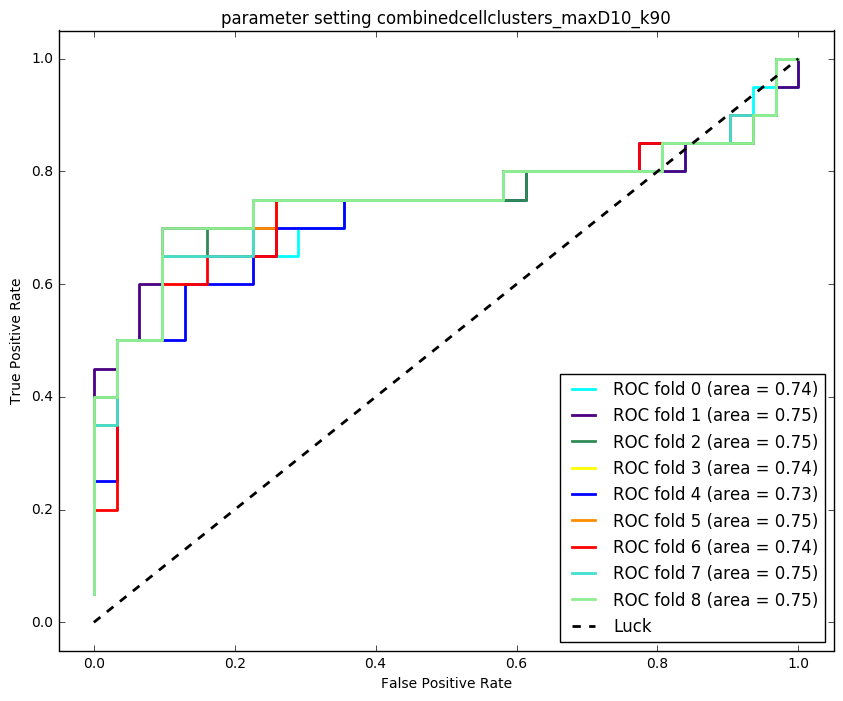

parameter setting combinedcellclusters_maxD10_k90_SI
(276, 18) (51, 18) 276 51
Fold 0: validation auc = 0.51 and accuracy =0.55
Fold 0: Test auc = 0.63 and accuracy =0.53
Fold 1: validation auc = 0.74 and accuracy =0.68
Fold 1: Test auc = 0.58 and accuracy =0.37
Fold 2: validation auc = 0.71 and accuracy =0.71
Fold 2: Test auc = 0.64 and accuracy =0.39
Fold 3: validation auc = 0.55 and accuracy =0.68
Fold 3: Test auc = 0.66 and accuracy =0.49
Fold 4: validation auc = 0.85 and accuracy =0.71
Fold 4: Test auc = 0.64 and accuracy =0.39
Fold 5: validation auc = 0.79 and accuracy =0.71
Fold 5: Test auc = 0.64 and accuracy =0.39
Fold 6: validation auc = 0.61 and accuracy =0.71
Fold 6: Test auc = 0.62 and accuracy =0.39
Fold 7: validation auc = 0.74 and accuracy =0.73
Fold 7: Test auc = 0.63 and accuracy =0.49
Fold 8: validation auc = 0.59 and accuracy =0.72
Fold 8: Test auc = 0.64 and accuracy =0.53


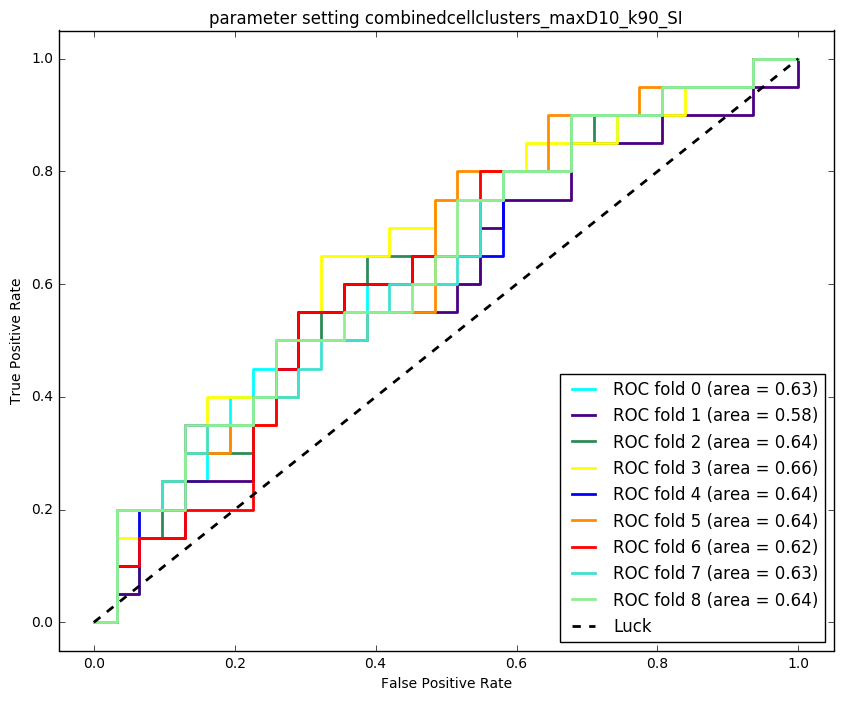

parameter setting combinedcellclusters_maxD10_k95
(276, 23) (51, 23) 276 51
Fold 0: validation auc = 0.51 and accuracy =0.48
Fold 0: Test auc = 0.73 and accuracy =0.47
Fold 1: validation auc = 0.56 and accuracy =0.61
Fold 1: Test auc = 0.73 and accuracy =0.43
Fold 2: validation auc = 0.62 and accuracy =0.65
Fold 2: Test auc = 0.70 and accuracy =0.49
Fold 3: validation auc = 0.90 and accuracy =0.71
Fold 3: Test auc = 0.70 and accuracy =0.45
Fold 4: validation auc = 0.91 and accuracy =0.84
Fold 4: Test auc = 0.73 and accuracy =0.39
Fold 5: validation auc = 0.96 and accuracy =0.81
Fold 5: Test auc = 0.70 and accuracy =0.47
Fold 6: validation auc = 0.75 and accuracy =0.77
Fold 6: Test auc = 0.75 and accuracy =0.41
Fold 7: validation auc = 0.89 and accuracy =0.80
Fold 7: Test auc = 0.73 and accuracy =0.39
Fold 8: validation auc = 0.73 and accuracy =0.72
Fold 8: Test auc = 0.71 and accuracy =0.45


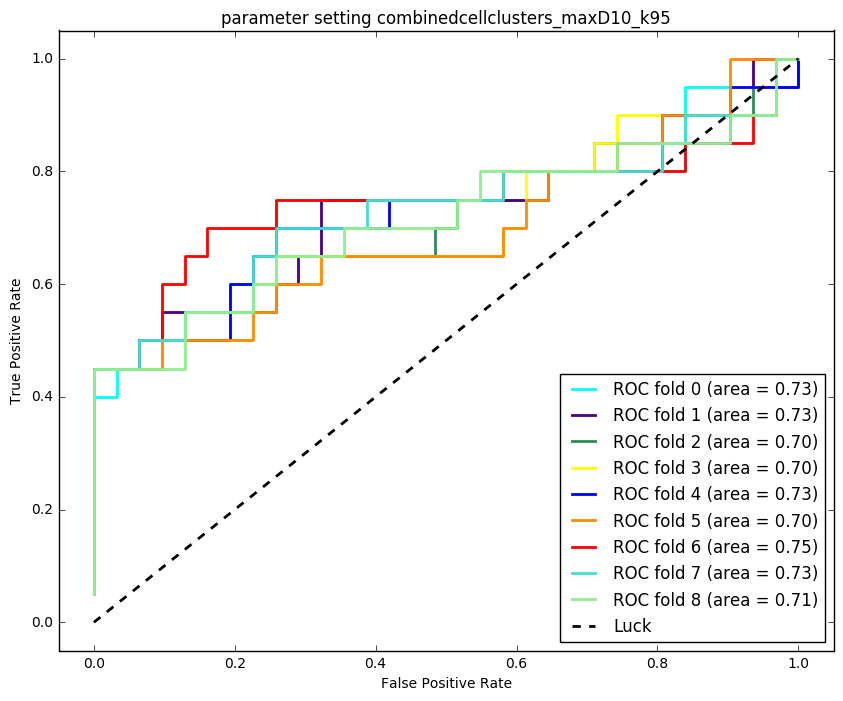

parameter setting combinedcellclusters_maxD10_k95_SI
(276, 22) (51, 22) 276 51
Fold 0: validation auc = 0.54 and accuracy =0.52
Fold 0: Test auc = 0.60 and accuracy =0.47
Fold 1: validation auc = 0.77 and accuracy =0.68
Fold 1: Test auc = 0.61 and accuracy =0.39
Fold 2: validation auc = 0.68 and accuracy =0.68
Fold 2: Test auc = 0.59 and accuracy =0.43
Fold 3: validation auc = 0.63 and accuracy =0.71
Fold 3: Test auc = 0.60 and accuracy =0.45
Fold 4: validation auc = 0.73 and accuracy =0.77
Fold 4: Test auc = 0.59 and accuracy =0.45
Fold 5: validation auc = 0.87 and accuracy =0.71
Fold 5: Test auc = 0.60 and accuracy =0.41
Fold 6: validation auc = 0.54 and accuracy =0.74
Fold 6: Test auc = 0.61 and accuracy =0.57
Fold 7: validation auc = 0.78 and accuracy =0.70
Fold 7: Test auc = 0.61 and accuracy =0.55
Fold 8: validation auc = 0.55 and accuracy =0.66
Fold 8: Test auc = 0.59 and accuracy =0.53


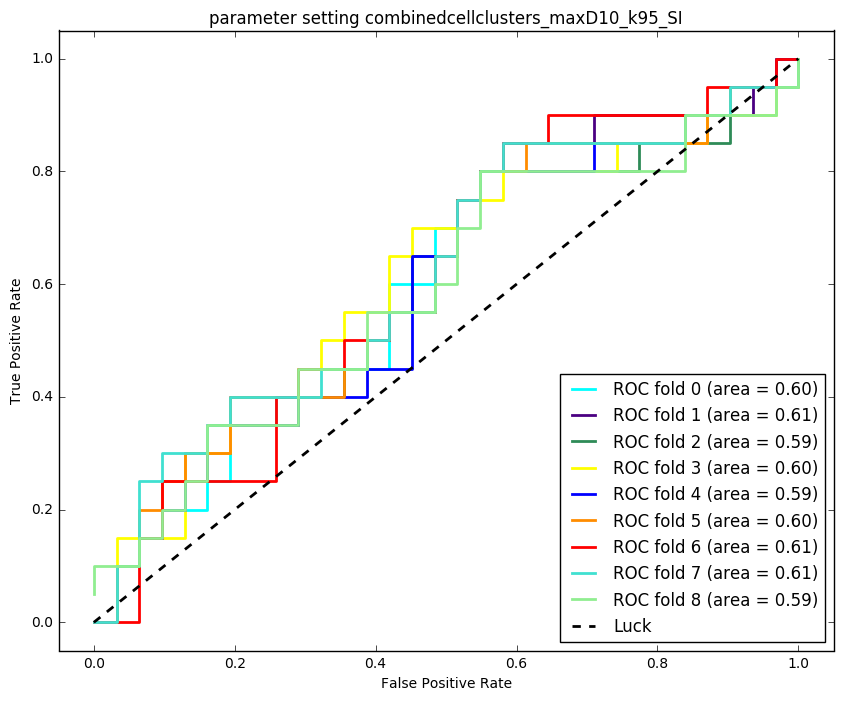

In [260]:
colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2
cv = StratifiedKFold(n_splits=9)

# CaseName = []
# ClassGrade = []
# Hospital = []
# rw_data = []
for param_set in xrange(len(rw_settings)):
    print('parameter setting %s' %(rw_settings[param_set]))
    # read in the file
    CaseName = []
    ClassGrade = []
    Hospital = []
    rw_data = []
    with open(os.path.join(rw_dir, (
                'train_test_list_' + rw_settings[param_set]+'.csv')),'rb') as csvfile:
        f_csv = csv.reader(csvfile,delimiter = ',')
        for row in f_csv:
            CaseName.append(row[0])
            ClassGrade.append(int(row[1]))
            Hospital.append(int(row[2]))
            rw_data.append([float(row[i]) for i in xrange(3,len(row))])
    data = np.vstack(rw_data)
    ClassGrade = np.asarray(ClassGrade)
    ClassLabel = np.asarray([int(ClassGrade[i] > 0) for i in 
                                 xrange(len(ClassGrade))])
    Hospital = np.asarray(Hospital)
    #print rw_data.shape, ClassGrade.shape
    data_train = data[Hospital == 1,:]
    data_test = data[Hospital == 0, :]
    y_train = ClassLabel[Hospital == 1]
    y_test = ClassLabel[Hospital == 0]
    print data_train.shape, data_test.shape, len(y_train), len(y_test)
    ###################################################
    ###################BINARY###################
    ###################################################
    scaler = preprocessing.StandardScaler().fit(data_train)
    data_train_scaled = scaler.transform(data_train)
    data_test_scaled = scaler.transform(data_test)

    X = data_train_scaled
    y = y_train

    random_state = np.random.RandomState(123)
    C = 5
    
    #cv_model = linear_model.LogisticRegressionCV(cv = 9, penalty='l1', scoring='roc_auc',solver='liblinear')
    #cv_model.fit(X,y)
    #print model.Cs_
    #print 'regularization parameter ',cv_model.C_
    #C = cv_model.C_[0]
    #clf = linear_model.LogisticRegression(penalty='l1',C = C, random_state=random_state)

    i = 0
    model = []
    model_perf = []
    # story value for cross validation
    fpr_cv = dict()
    tpr_cv = dict()
    auc_cv = dict()
    acc_cv = dict()
    
    plt.figure()
    for (train, test), color in zip(cv.split(X, y), colors):
        clf = linear_model.LogisticRegression(penalty='l1',C = C, random_state=random_state)
        model.append(clf.fit(X[train], y[train]))
        probas_ = model[i].predict_proba(X[test])
        # Compute ROC curve and area the curve
        fpr, tpr, _ = roc_curve(y[test], probas_[:, 1])
        roc_auc = auc(fpr, tpr)
    
        ypred = model[i].predict(X[test])
        acc = accuracy_score(y[test],ypred)
        print('Fold %d: validation auc = %0.2f and accuracy =%0.2f' %(i, roc_auc, acc))
        model_perf.append(roc_auc + acc)
        fpr_cv[(i,'val')] = fpr
        tpr_cv[(i,'val')] = tpr
        auc_cv[(i,'val')] = roc_auc
        acc_cv[(i,'val')] = acc
        
        # onto the test set
        probas_ = model[i].predict_proba(data_test_scaled)
        fpr, tpr, _ = roc_curve(y_test, probas_[:,1])
        roc_auc = auc(fpr, tpr)
        ypred = model[i].predict(data_test_scaled)
        acc = accuracy_score(y_test, ypred)
        
        fpr_cv[(i,'test')] = fpr
        tpr_cv[(i,'test')] = tpr
        auc_cv[(i,'test')] = roc_auc
        acc_cv[(i,'test')] = acc
        
        print('Fold %d: Test auc = %0.2f and accuracy =%0.2f' %(i, roc_auc, acc))
        
        plt.plot(fpr, tpr, lw=lw, color=color,
             label='ROC fold %d (area = %0.2f)' % (i, roc_auc))
    
        i += 1
    plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(('parameter setting %s') %(rw_settings[param_set]))
    plt.legend(loc="lower right")
    plt.show()    
    
    # get the best model
    model_perf = np.asarray(model_perf)
    best_model = np.argmax(model_perf)
    curr_key = (rw_settings[param_set] + '_val' + '_bin' )
    fpr_dict[curr_key] = fpr_cv[(best_model,'val')]
    tpr_dict[curr_key] = tpr_cv[(best_model,'val')]
    acc_dict[curr_key] = acc_cv[(best_model,'val')]
    auc_dict[curr_key] = auc_cv[(best_model,'val')]
    curr_key = (rw_settings[param_set] + '_test' + '_bin' )
    fpr_dict[curr_key] = fpr_cv[(best_model,'test')]
    tpr_dict[curr_key] = tpr_cv[(best_model,'test')]
    acc_dict[curr_key] = acc_cv[(best_model,'test')]
    auc_dict[curr_key] = auc_cv[(best_model,'test')]

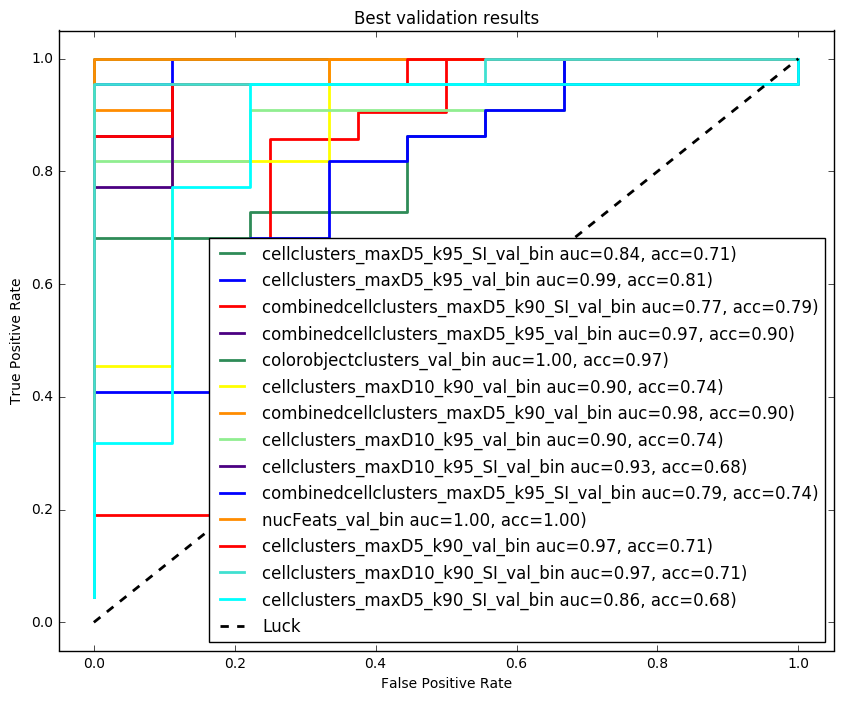

In [102]:
plt.figure()
for key,color in zip(fpr_dict,colors):
    if 'val' in key:
        plt.plot(fpr_dict[key], tpr_dict[key], lw=lw, color=color,
             label='%s auc=%0.2f, acc=%0.2f)' % (key, auc_dict[key], acc_dict[key]))
    
plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Best validation results')
plt.legend(loc="lower right")
plt.show()   

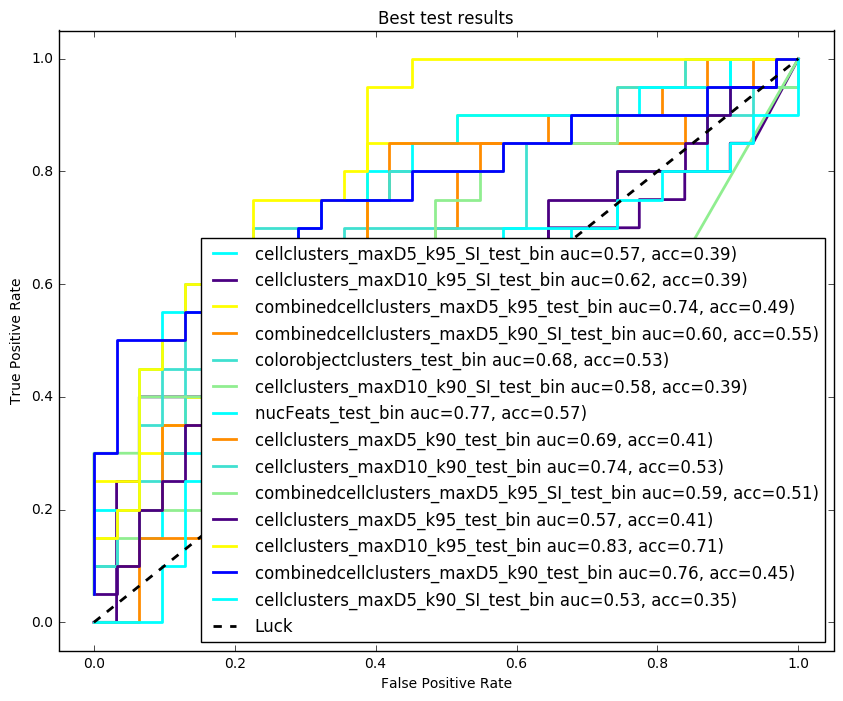

In [129]:
plt.figure()
for key,color in zip(fpr_dict,colors):
    if 'test' in key:
        plt.plot(fpr_dict[key], tpr_dict[key], lw=lw, color=color,
             label='%s auc=%0.2f, acc=%0.2f)' % (key, auc_dict[key], acc_dict[key]))
    
plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Best test results')
plt.legend(loc="lower right")
plt.show()   

parameter setting colorobjectclusters
(276, 8) (51, 8) 276 51
regularization parameter  [ 0.35938137]
Fold 0: validation auc = 0.74 and accuracy =0.61
Fold 1: validation auc = 0.88 and accuracy =0.81
Fold 2: validation auc = 0.96 and accuracy =0.92
Fold 3: validation auc = 0.75 and accuracy =0.64
Fold 4: validation auc = 0.98 and accuracy =0.86
Fold 5: validation auc = 0.92 and accuracy =0.78
Fold 6: validation auc = 0.76 and accuracy =0.69
Fold 7: validation auc = 0.87 and accuracy =0.86
Fold 8: validation auc = 0.68 and accuracy =0.69


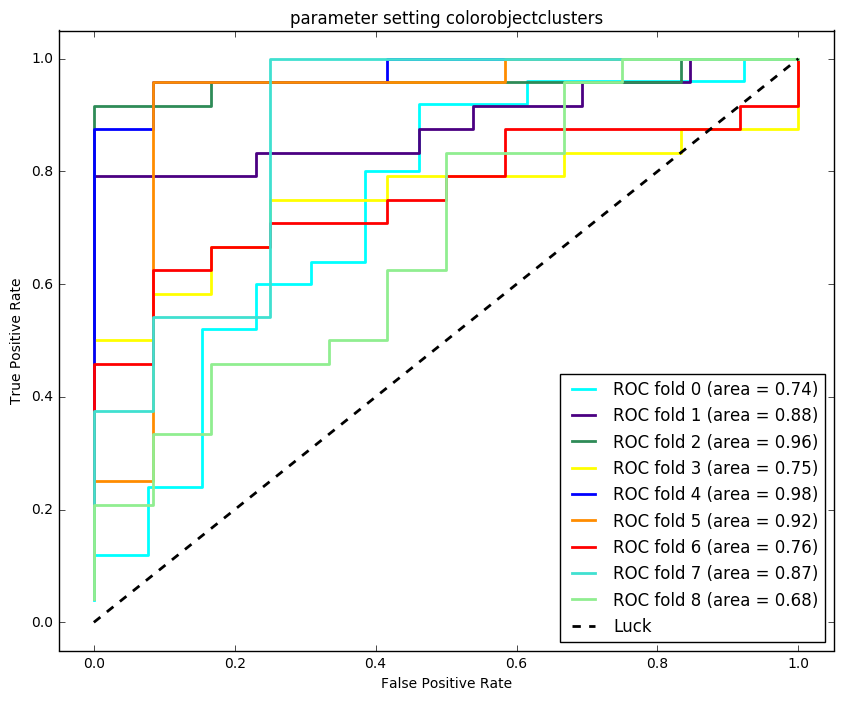

parameter setting cellclusters_maxD5_k90
(276, 8) (51, 8) 276 51
regularization parameter  [ 0.35938137]
Fold 0: validation auc = 0.35 and accuracy =0.42
Fold 1: validation auc = 0.63 and accuracy =0.59
Fold 2: validation auc = 0.54 and accuracy =0.69
Fold 3: validation auc = 0.90 and accuracy =0.81
Fold 4: validation auc = 0.74 and accuracy =0.69
Fold 5: validation auc = 0.82 and accuracy =0.78
Fold 6: validation auc = 0.90 and accuracy =0.75
Fold 7: validation auc = 0.73 and accuracy =0.72
Fold 8: validation auc = 0.82 and accuracy =0.75


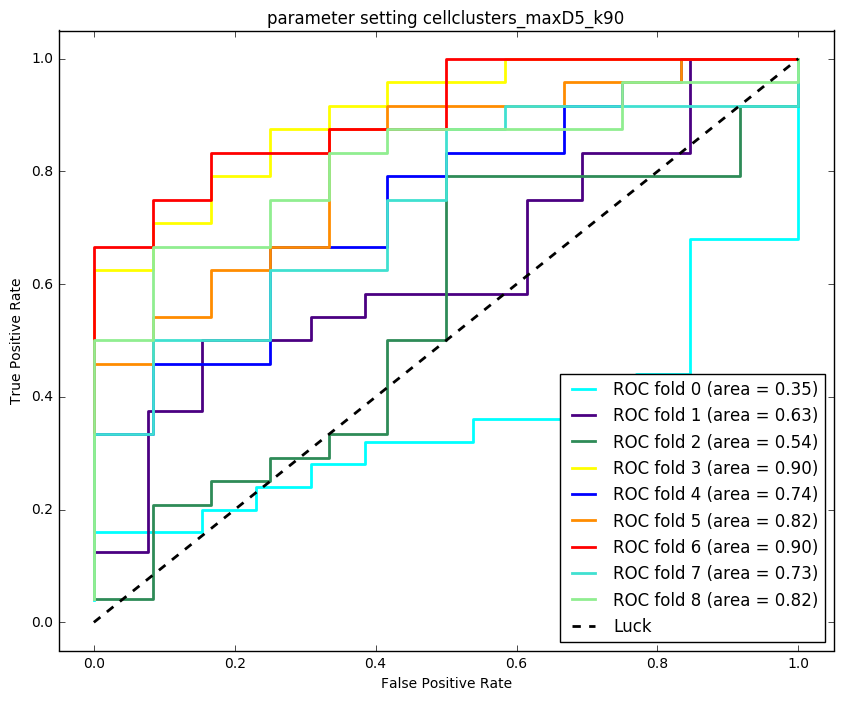

parameter setting cellclusters_maxD5_k90_SI
(276, 7) (51, 7) 276 51
regularization parameter  [ 21.5443469]
Fold 0: validation auc = 0.40 and accuracy =0.39
Fold 1: validation auc = 0.55 and accuracy =0.59
Fold 2: validation auc = 0.62 and accuracy =0.56
Fold 3: validation auc = 0.83 and accuracy =0.78
Fold 4: validation auc = 0.80 and accuracy =0.75
Fold 5: validation auc = 0.77 and accuracy =0.75
Fold 6: validation auc = 0.87 and accuracy =0.78
Fold 7: validation auc = 0.83 and accuracy =0.75
Fold 8: validation auc = 0.69 and accuracy =0.67


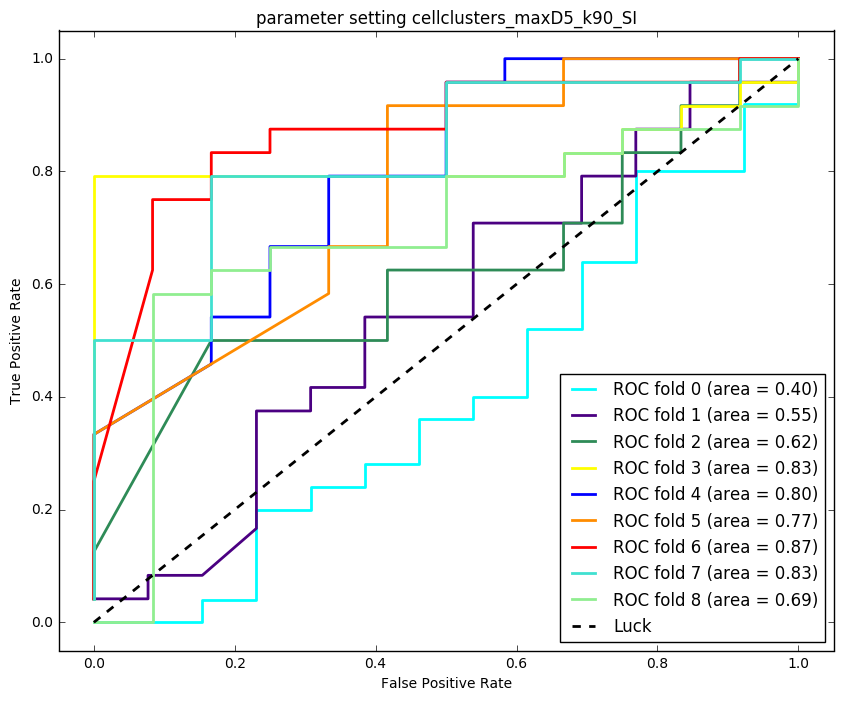

parameter setting cellclusters_maxD5_k95
(276, 14) (51, 14) 276 51
regularization parameter  [ 0.04641589]
Fold 0: validation auc = 0.33 and accuracy =0.39
Fold 1: validation auc = 0.56 and accuracy =0.59
Fold 2: validation auc = 0.58 and accuracy =0.58
Fold 3: validation auc = 0.90 and accuracy =0.81
Fold 4: validation auc = 0.75 and accuracy =0.75
Fold 5: validation auc = 0.71 and accuracy =0.75
Fold 6: validation auc = 0.88 and accuracy =0.78
Fold 7: validation auc = 0.86 and accuracy =0.72
Fold 8: validation auc = 0.78 and accuracy =0.64


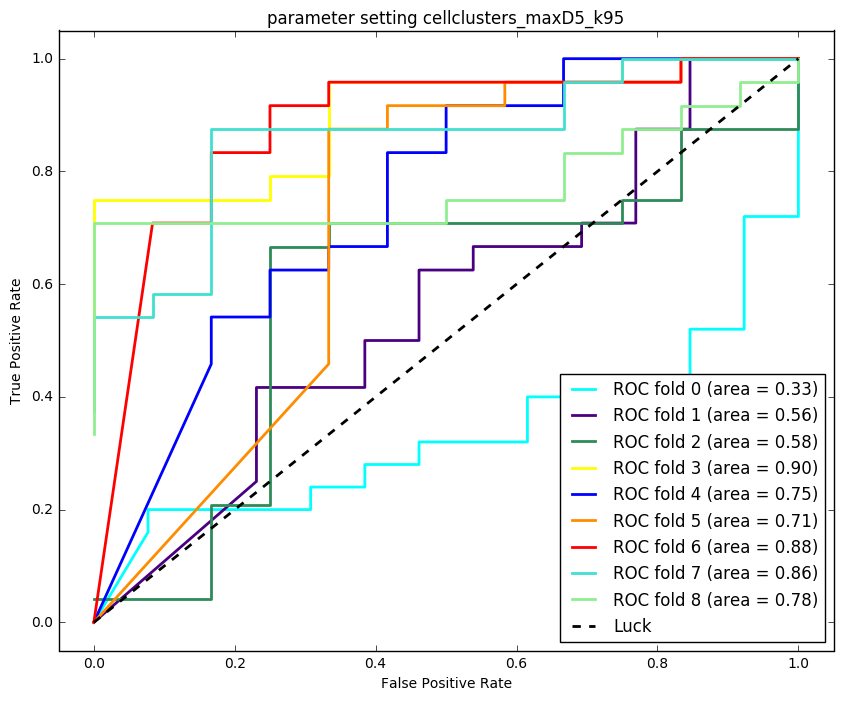

parameter setting cellclusters_maxD5_k95_SI
(276, 9) (51, 9) 276 51
regularization parameter  [ 0.04641589]
Fold 0: validation auc = 0.46 and accuracy =0.66
Fold 1: validation auc = 0.50 and accuracy =0.65
Fold 2: validation auc = 0.68 and accuracy =0.67
Fold 3: validation auc = 0.67 and accuracy =0.67
Fold 4: validation auc = 0.73 and accuracy =0.67
Fold 5: validation auc = 0.65 and accuracy =0.67
Fold 6: validation auc = 0.76 and accuracy =0.67
Fold 7: validation auc = 0.81 and accuracy =0.67
Fold 8: validation auc = 0.75 and accuracy =0.67


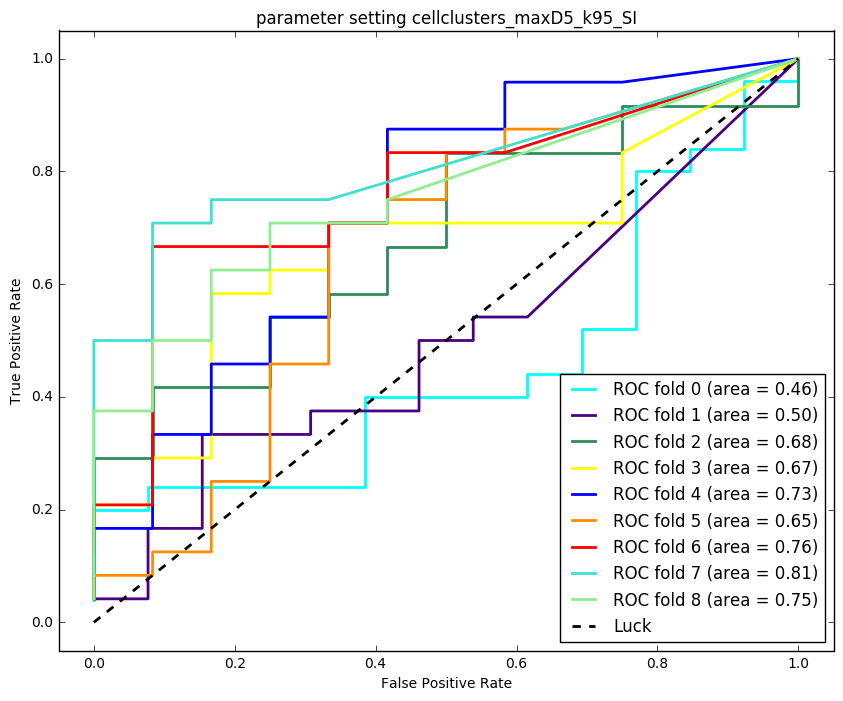

parameter setting cellclusters_maxD10_k90
(276, 13) (51, 13) 276 51
regularization parameter  [ 0.04641589]
Fold 0: validation auc = 0.38 and accuracy =0.47
Fold 1: validation auc = 0.67 and accuracy =0.65
Fold 2: validation auc = 0.60 and accuracy =0.67
Fold 3: validation auc = 0.76 and accuracy =0.67
Fold 4: validation auc = 0.76 and accuracy =0.75
Fold 5: validation auc = 0.85 and accuracy =0.81
Fold 6: validation auc = 0.93 and accuracy =0.86
Fold 7: validation auc = 0.97 and accuracy =0.86
Fold 8: validation auc = 0.77 and accuracy =0.64


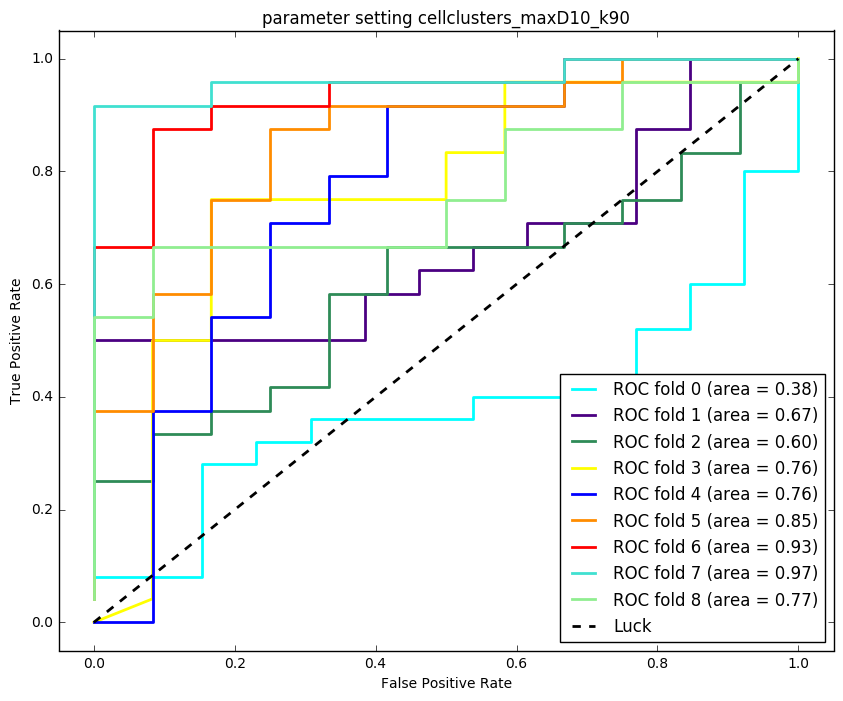

parameter setting cellclusters_maxD10_k90_SI
(276, 11) (51, 11) 276 51
regularization parameter  [ 2.7825594]
Fold 0: validation auc = 0.32 and accuracy =0.39
Fold 1: validation auc = 0.55 and accuracy =0.57
Fold 2: validation auc = 0.64 and accuracy =0.64
Fold 3: validation auc = 0.78 and accuracy =0.72
Fold 4: validation auc = 0.76 and accuracy =0.69
Fold 5: validation auc = 0.79 and accuracy =0.72
Fold 6: validation auc = 0.92 and accuracy =0.83
Fold 7: validation auc = 0.93 and accuracy =0.86
Fold 8: validation auc = 0.79 and accuracy =0.69


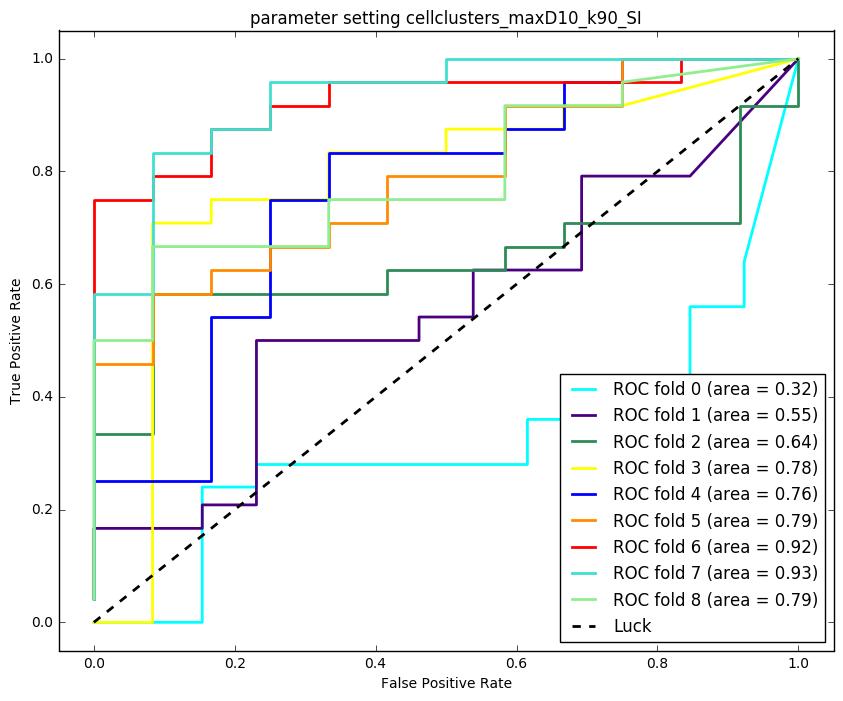

parameter setting cellclusters_maxD10_k95
(276, 14) (51, 14) 276 51
regularization parameter  [ 0.35938137]
Fold 0: validation auc = 0.44 and accuracy =0.42
Fold 1: validation auc = 0.65 and accuracy =0.59
Fold 2: validation auc = 0.66 and accuracy =0.72
Fold 3: validation auc = 0.69 and accuracy =0.58
Fold 4: validation auc = 0.74 and accuracy =0.69
Fold 5: validation auc = 0.79 and accuracy =0.75
Fold 6: validation auc = 0.91 and accuracy =0.81
Fold 7: validation auc = 0.97 and accuracy =0.92
Fold 8: validation auc = 0.91 and accuracy =0.78


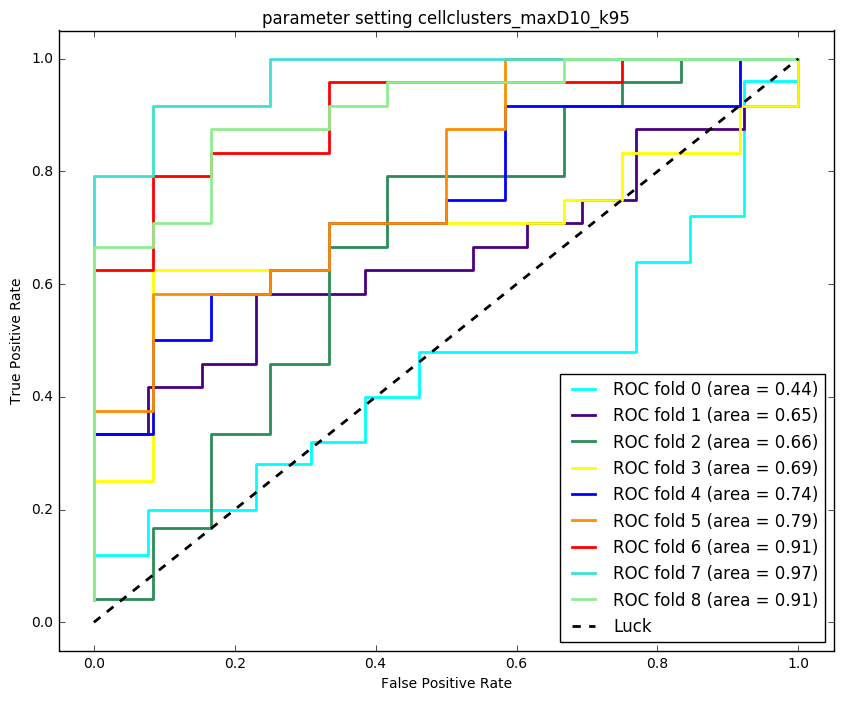

parameter setting cellclusters_maxD10_k95_SI
(276, 17) (51, 17) 276 51
regularization parameter  [ 0.35938137]
Fold 0: validation auc = 0.38 and accuracy =0.45
Fold 1: validation auc = 0.54 and accuracy =0.54
Fold 2: validation auc = 0.61 and accuracy =0.61
Fold 3: validation auc = 0.76 and accuracy =0.75
Fold 4: validation auc = 0.80 and accuracy =0.75
Fold 5: validation auc = 0.84 and accuracy =0.78
Fold 6: validation auc = 0.94 and accuracy =0.83
Fold 7: validation auc = 0.97 and accuracy =0.92
Fold 8: validation auc = 0.77 and accuracy =0.69


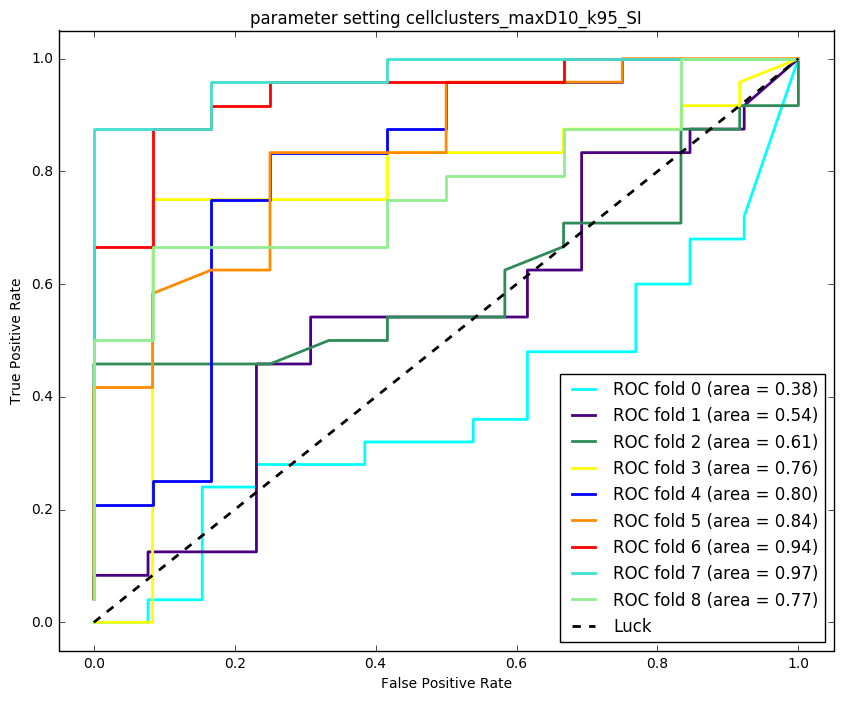

parameter setting combinedcellclusters_maxD5_k90
(276, 9) (51, 9) 276 51
regularization parameter  [ 0.04641589]
Fold 0: validation auc = 0.48 and accuracy =0.66
Fold 1: validation auc = 0.85 and accuracy =0.65
Fold 2: validation auc = 0.59 and accuracy =0.64
Fold 3: validation auc = 0.73 and accuracy =0.61
Fold 4: validation auc = 0.92 and accuracy =0.67
Fold 5: validation auc = 0.86 and accuracy =0.64
Fold 6: validation auc = 0.89 and accuracy =0.64
Fold 7: validation auc = 0.84 and accuracy =0.64
Fold 8: validation auc = 0.60 and accuracy =0.67


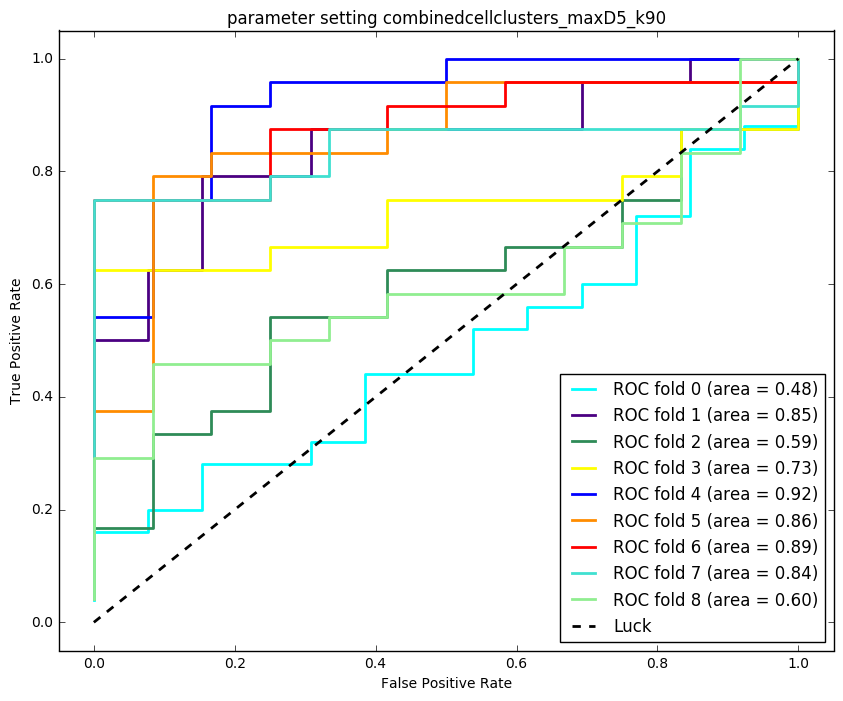

parameter setting combinedcellclusters_maxD5_k90_SI
(276, 11) (51, 11) 276 51
regularization parameter  [ 0.35938137]
Fold 0: validation auc = 0.42 and accuracy =0.66
Fold 1: validation auc = 0.54 and accuracy =0.62
Fold 2: validation auc = 0.42 and accuracy =0.67
Fold 3: validation auc = 0.64 and accuracy =0.67
Fold 4: validation auc = 0.58 and accuracy =0.67
Fold 5: validation auc = 0.68 and accuracy =0.67
Fold 6: validation auc = 0.65 and accuracy =0.67
Fold 7: validation auc = 0.48 and accuracy =0.67
Fold 8: validation auc = 0.55 and accuracy =0.67


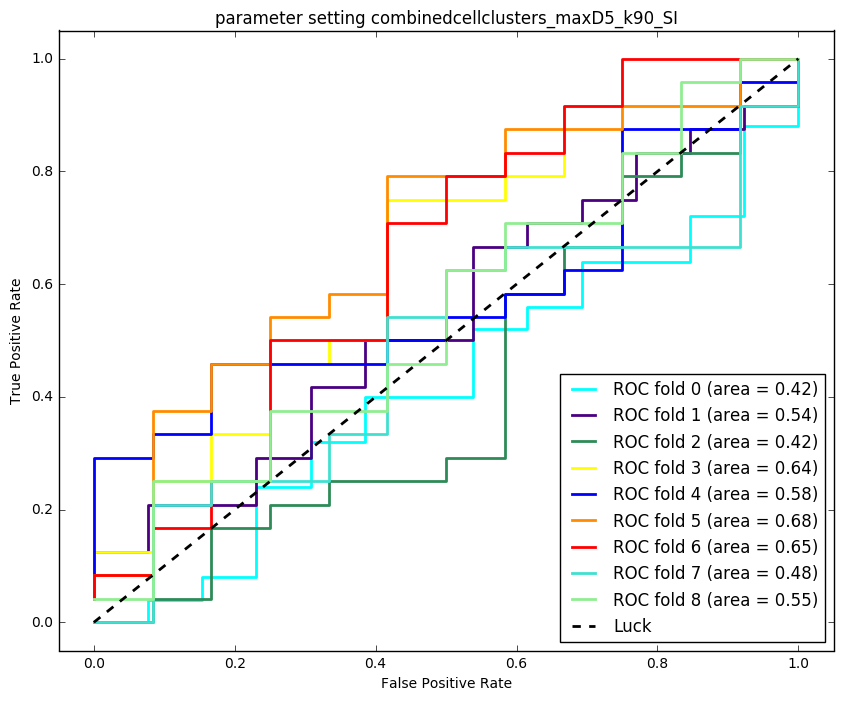

parameter setting combinedcellclusters_maxD5_k95
(276, 17) (51, 17) 276 51
regularization parameter  [ 0.04641589]
Fold 0: validation auc = 0.51 and accuracy =0.58
Fold 1: validation auc = 0.67 and accuracy =0.65
Fold 2: validation auc = 0.71 and accuracy =0.64
Fold 3: validation auc = 0.82 and accuracy =0.64
Fold 4: validation auc = 0.87 and accuracy =0.67
Fold 5: validation auc = 0.83 and accuracy =0.64
Fold 6: validation auc = 0.84 and accuracy =0.64
Fold 7: validation auc = 0.81 and accuracy =0.64
Fold 8: validation auc = 0.72 and accuracy =0.67


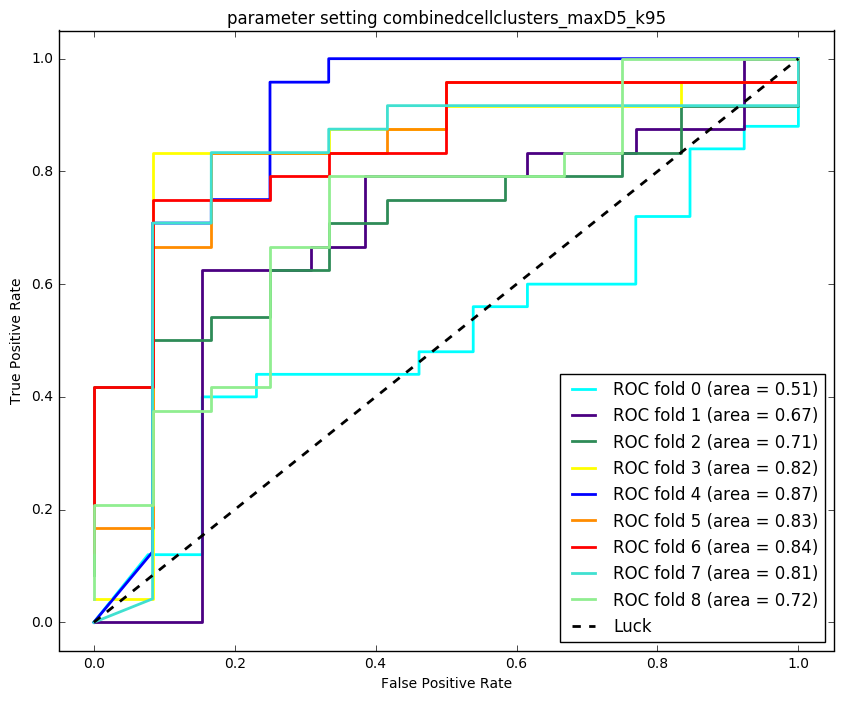

parameter setting combinedcellclusters_maxD5_k95_SI
(276, 12) (51, 12) 276 51
regularization parameter  [ 2.7825594]
Fold 0: validation auc = 0.37 and accuracy =0.42
Fold 1: validation auc = 0.50 and accuracy =0.68
Fold 2: validation auc = 0.61 and accuracy =0.67
Fold 3: validation auc = 0.59 and accuracy =0.67
Fold 4: validation auc = 0.69 and accuracy =0.67
Fold 5: validation auc = 0.68 and accuracy =0.67
Fold 6: validation auc = 0.72 and accuracy =0.67
Fold 7: validation auc = 0.60 and accuracy =0.67
Fold 8: validation auc = 0.64 and accuracy =0.67


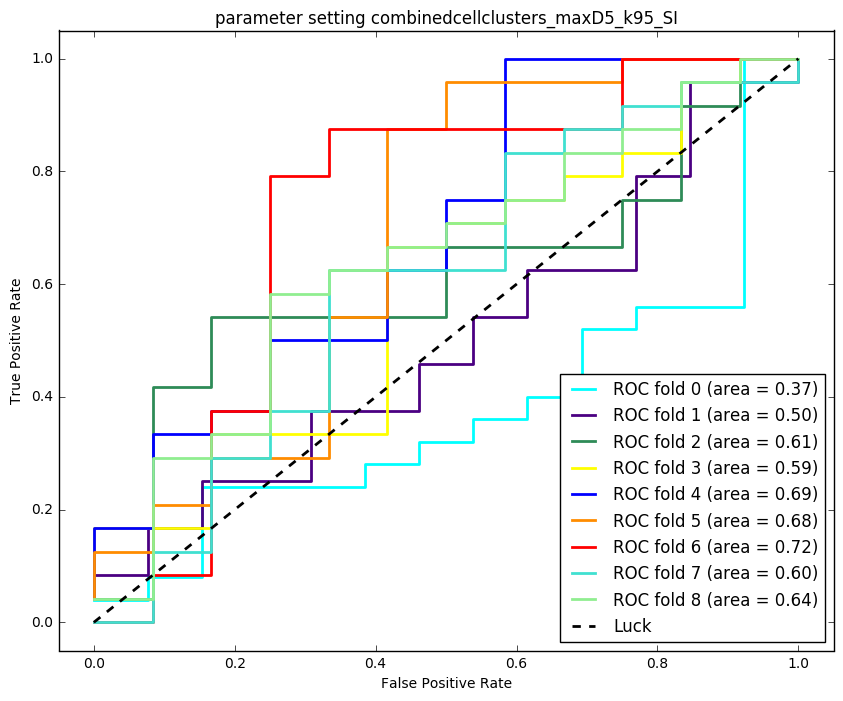

parameter setting combinedcellclusters_maxD10_k90
(276, 10) (51, 10) 276 51
regularization parameter  [ 0.04641589]
Fold 0: validation auc = 0.48 and accuracy =0.45
Fold 1: validation auc = 0.85 and accuracy =0.68
Fold 2: validation auc = 0.61 and accuracy =0.67
Fold 3: validation auc = 0.89 and accuracy =0.81
Fold 4: validation auc = 0.84 and accuracy =0.78
Fold 5: validation auc = 0.89 and accuracy =0.83
Fold 6: validation auc = 0.89 and accuracy =0.75
Fold 7: validation auc = 0.88 and accuracy =0.67
Fold 8: validation auc = 0.73 and accuracy =0.67


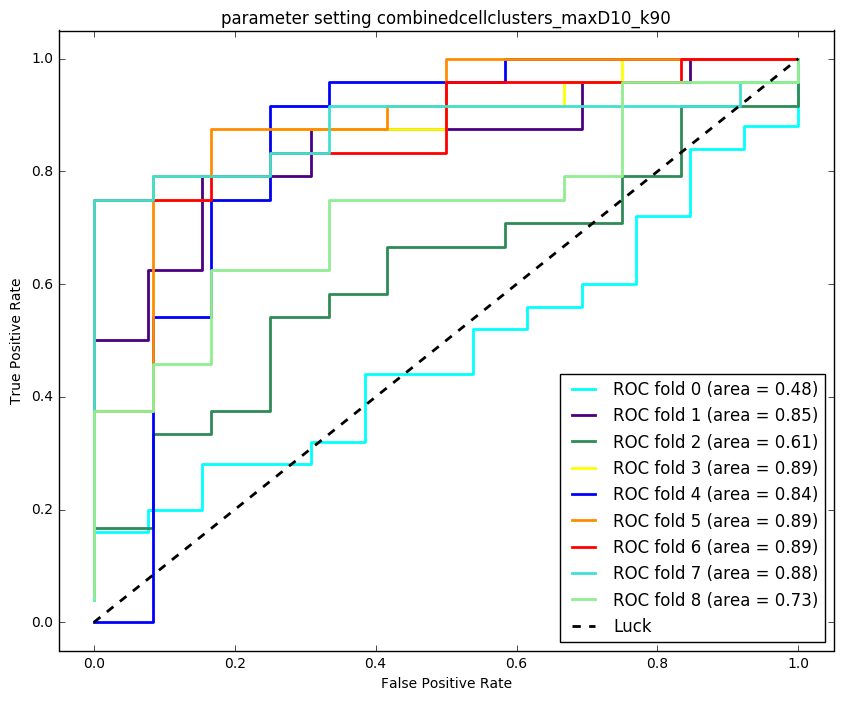

parameter setting combinedcellclusters_maxD10_k90_SI
(276, 18) (51, 18) 276 51
regularization parameter  [ 0.35938137]
Fold 0: validation auc = 0.48 and accuracy =0.47
Fold 1: validation auc = 0.69 and accuracy =0.57
Fold 2: validation auc = 0.58 and accuracy =0.61
Fold 3: validation auc = 0.74 and accuracy =0.72
Fold 4: validation auc = 0.78 and accuracy =0.75
Fold 5: validation auc = 0.69 and accuracy =0.72
Fold 6: validation auc = 0.72 and accuracy =0.78
Fold 7: validation auc = 0.82 and accuracy =0.81
Fold 8: validation auc = 0.56 and accuracy =0.61


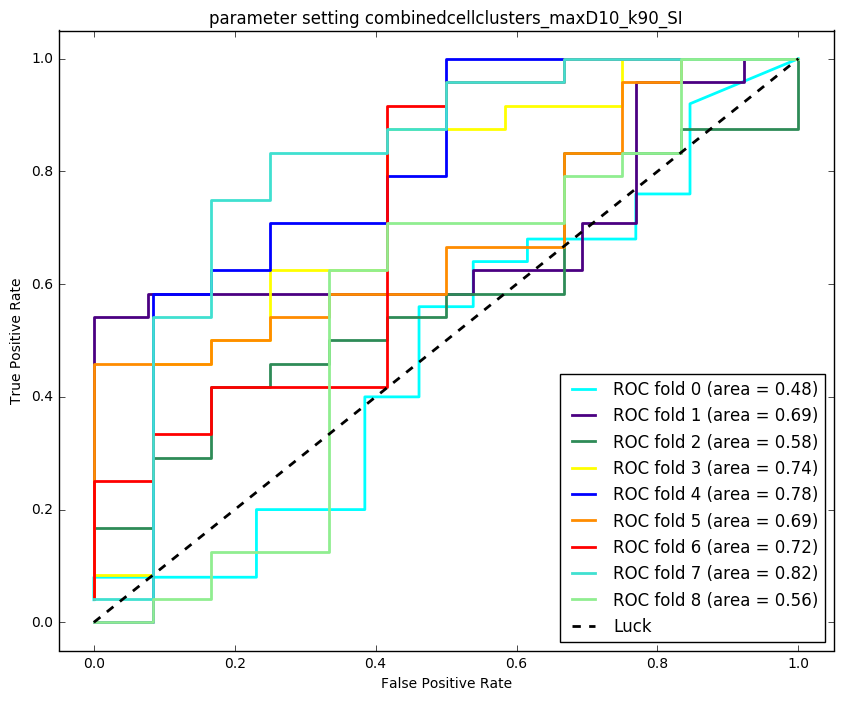

parameter setting combinedcellclusters_maxD10_k95
(276, 23) (51, 23) 276 51
regularization parameter  [ 0.35938137]
Fold 0: validation auc = 0.49 and accuracy =0.50
Fold 1: validation auc = 0.70 and accuracy =0.65
Fold 2: validation auc = 0.61 and accuracy =0.61
Fold 3: validation auc = 0.87 and accuracy =0.75
Fold 4: validation auc = 0.81 and accuracy =0.78
Fold 5: validation auc = 0.91 and accuracy =0.86
Fold 6: validation auc = 0.91 and accuracy =0.78
Fold 7: validation auc = 0.83 and accuracy =0.67
Fold 8: validation auc = 0.64 and accuracy =0.64


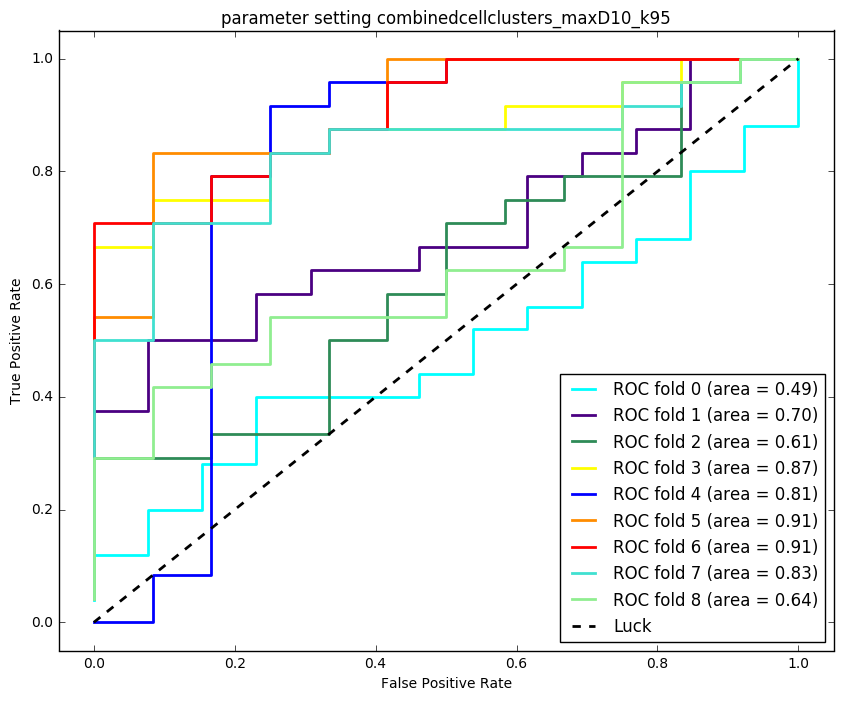

parameter setting combinedcellclusters_maxD10_k95_SI
(276, 22) (51, 22) 276 51
regularization parameter  [ 21.5443469]
Fold 0: validation auc = 0.51 and accuracy =0.50
Fold 1: validation auc = 0.60 and accuracy =0.57
Fold 2: validation auc = 0.60 and accuracy =0.69
Fold 3: validation auc = 0.74 and accuracy =0.72
Fold 4: validation auc = 0.74 and accuracy =0.69
Fold 5: validation auc = 0.60 and accuracy =0.61
Fold 6: validation auc = 0.76 and accuracy =0.75
Fold 7: validation auc = 0.88 and accuracy =0.75
Fold 8: validation auc = 0.59 and accuracy =0.64


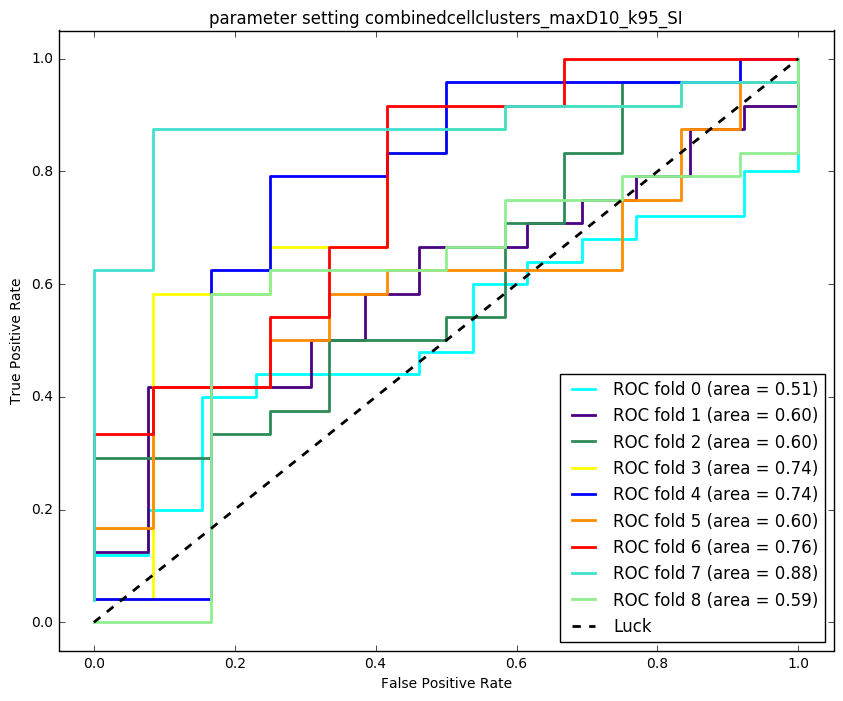

In [263]:
colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2
cv = StratifiedKFold(n_splits=9)

# CaseName = []
# ClassGrade = []
# Hospital = []
# rw_data = []
for param_set in xrange(len(rw_settings)):
    print('parameter setting %s' %(rw_settings[param_set]))
    # read in the file
    CaseName = []
    ClassGrade = []
    Hospital = []
    rw_data = []
    with open(os.path.join(rw_dir, (
                'train_test_list_' + rw_settings[param_set]+'.csv')),'rb') as csvfile:
        f_csv = csv.reader(csvfile,delimiter = ',')
        for row in f_csv:
            CaseName.append(row[0])
            ClassGrade.append(int(row[1]))
            Hospital.append(int(row[2]))
            rw_data.append([float(row[i]) for i in xrange(3,len(row))])
    data = np.vstack(rw_data)
    ClassGrade = np.asarray(ClassGrade)
    ClassLabel = np.asarray([int(ClassGrade[i] > 0) for i in 
                                 xrange(len(ClassGrade))])
    Hospital = np.asarray(Hospital)
    #print rw_data.shape, ClassGrade.shape
    data_train = data[Hospital == 1,:]
    data_test = data[Hospital == 0, :]
    y_train = ClassLabel[Hospital == 1]
    y_test = ClassLabel[Hospital == 0]
    print data_train.shape, data_test.shape, len(y_train), len(y_test)
    ###################################################
    ###################BINARY###################
    ###################################################
    scaler = preprocessing.StandardScaler().fit(data)
    X = scaler.transform(data)
    y = ClassLabel

    random_state = np.random.RandomState(123)
    cv_model = linear_model.LogisticRegressionCV(cv = 9, penalty='l1', scoring='roc_auc',solver='liblinear')
    cv_model.fit(X,y)
    #print model.Cs_
    print 'regularization parameter ',cv_model.C_
    C = cv_model.C_[0]
    #C = 1
    #clf = linear_model.LogisticRegression(penalty='l1',C = C, 
    #                                      random_state=random_state)
    
    i = 0
    model = []
    model_perf = []
    fpr_cv = dict()
    tpr_cv = dict()
    auc_cv = dict()
    acc_cv = dict()
    
    plt.figure()
    for (train, test), color in zip(cv.split(X, y), colors):
        clf = linear_model.LogisticRegression(penalty='l1',C = C, 
                                              random_state=random_state)
        model.append(clf.fit(X[train], y[train]))
        probas_ = model[i].predict_proba(X[test])
        # Compute ROC curve and area the curve
        fpr, tpr, _ = roc_curve(y[test], probas_[:, 1])
        roc_auc = auc(fpr, tpr)
    
        ypred = model[i].predict(X[test])
        acc = accuracy_score(y[test],ypred)
        print('Fold %d: validation auc = %0.2f and accuracy =%0.2f' %(i, roc_auc, acc))
        model_perf.append(roc_auc + acc)
        plt.plot(fpr, tpr, lw=lw, color=color,
             label='ROC fold %d (area = %0.2f)' % (i, roc_auc))
        fpr_cv[(i,'val')] = fpr
        tpr_cv[(i,'val')] = tpr
        auc_cv[(i,'val')] = roc_auc
        acc_cv[(i,'val')] = acc
        
        i += 1
    plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(('parameter setting %s') %(rw_settings[param_set]))
    plt.legend(loc="lower right")
    plt.show()
    
    # get the best model
    model_perf = np.asarray(model_perf)
    best_model = np.argmax(model_perf)
    curr_key = (rw_settings[param_set] + '_CV' + '_bin' )
    fpr_dict[curr_key] = fpr_cv[(best_model,'val')]
    tpr_dict[curr_key] = tpr_cv[(best_model,'val')]
    acc_dict[curr_key] = acc_cv[(best_model,'val')]
    auc_dict[curr_key] = auc_cv[(best_model,'val')]

KeyError: 'cellclusters_maxD10_k95_micro_CV_4way'

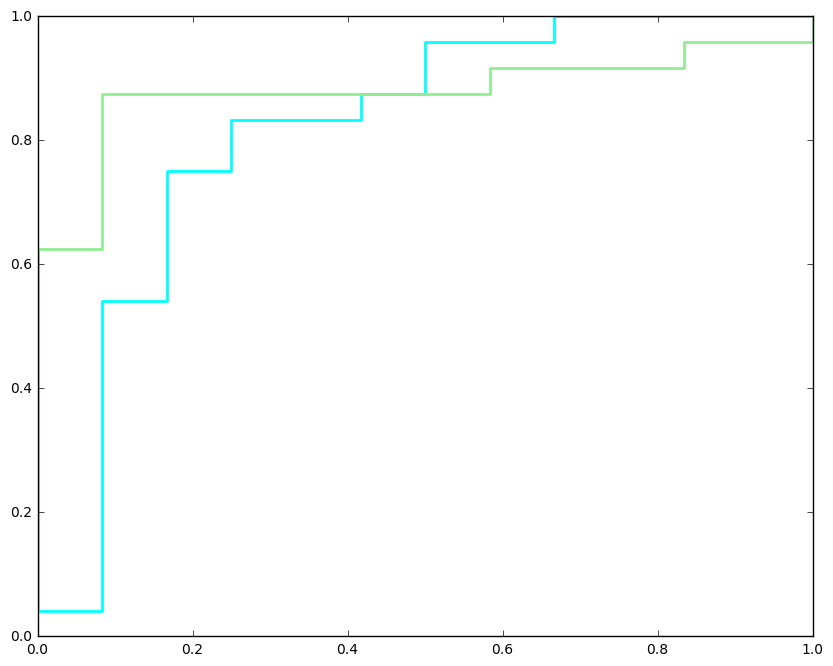

In [264]:
plt.figure()
for key,color in zip(fpr_dict,colors):
    if 'CV' in key:
        plt.plot(fpr_dict[key], tpr_dict[key], lw=lw, color=color,
             label='%s auc=%0.2f, acc=%0.2f)' % (key, auc_dict[key], acc_dict[key]))
    
plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Best CV results')
plt.legend(loc="lower right")
plt.show() 

In [32]:
lookup_fname = 'UDH_DCIS_table_new.csv'

csvfile = open(os.path.join(data_path,data_fname),'rb')
# f_csv = csv.reader(csvfile,delimiter=',')


f_csv = csv.DictReader(csvfile)
rows in f_csv
#print f_csv.fieldnames
# data_field_id = np.nonzero([f_csv.fieldnames[i] not in ["CaseName","Class","ClassGrade","ER"] 
#               for i in xrange(len(f_csv.fieldnames))])[0]
# print data_field_id
# for row in f_csv:
#     print row[np.asarray(data_field_id)]

NameError: name 'rows' is not defined

## 4 way classification

In [382]:
# load dataset
data_path = '/media/SpatialPathology'
data_fname = 'ComputedFeatures_Label.csv'
data = []
Class = []
CaseName = []
ClassGrade = []

with open(os.path.join(data_path,data_fname),'rb') as csvfile:
    f_csv = csv.reader(csvfile,delimiter=',')
    f_csv = csv.DictReader(csvfile)
    for row in f_csv:
        data.append([float(value) for key, value in row.items() if key not in [
                   'Class','ClassGrade','CaseName','ER']])
        Class.append(row['Class'])
        ClassGrade.append(row['ClassGrade'])
        CaseName.append(row['CaseName'])

data = np.vstack(data)
print data.shape
ClassLabel = np.asarray([int(Class[i]=='DCIS') for i in xrange(len(Class))])
# print ClassLabel
data_train = data[:116,:]
data_test = data[116:,:]
ClassGradeBin = preprocessing.label_binarize(ClassGrade,classes=[
        'UDH','Low_DCIS','Medium_DCIS','High_DCIS'])
ClassGradeLabel = np.argmax(ClassGradeBin,axis = 1)
n_classes = ClassGradeBin.shape[1]

y_train = ClassGradeLabel[:116]
y_test = ClassGradeLabel[116:]

print data_train.shape, data_test.shape, y_train.shape, y_test.shape

scaler = preprocessing.StandardScaler().fit(data)
data_scaled = scaler.transform(data)

X = data_scaled
y = np.asarray(ClassGradeLabel)
y_bin = ClassGradeBin

# random_state = np.random.RandomState(123)
# #C = 1
# cv_model = linear_model.LogisticRegressionCV(Cs = 50,cv = 9, 
#         penalty='l1', scoring='roc_auc',solver='liblinear')
# cv_model.fit(X,y)
# #print np.mean(cv_model.C_)
# #print mode(cv_model.C_)
# C = mode(cv_model.C_)[0][0]
# probas_ = cv_model.predict_proba(X)

# # Compute ROC curve and area the curve
# fpr = dict()
# tpr = dict()
# roc_auc = dict()
    
# for j in range(n_classes):
#     fpr[j], tpr[j], _ = roc_curve(y_bin[:,j], probas_[:, j])
#     roc_auc[j] = auc(fpr[j], tpr[j])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), probas_.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
# macro average ROC curve and ROC area
# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))
# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for j in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[j], tpr[j])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

acc = cv_model.score(X,y)
ypred = cv_model.predict(X)
print ypred
setting = 'nucFeats'
print('Setting is %s has C=%0.2f' %(setting, C))
print('Acc=%0.2f, micro auc =%0.2f, macro auc = %0.2f' %(
    acc, roc_auc['micro'], roc_auc['macro']))

curr_key = (setting + '_micro' + '_CV' + '_4way' )
fpr_dict[curr_key] = fpr['micro']
tpr_dict[curr_key] = tpr['micro']
auc_dict[curr_key] = roc_auc['micro']

curr_key = (setting + '_macro' + '_CV' + '_4way' )
fpr_dict[curr_key] = fpr['macro']
tpr_dict[curr_key] = tpr['macro']
auc_dict[curr_key] = roc_auc['macro']

curr_key = (setting + '_CV' + '_4way' )
acc_dict[curr_key] = acc

(167, 392)
(116, 392) (51, 392) (116,) (51,)
[0 0 0 2 1 1 1 1 2 1 1 3 1 1 1 0 1 0 0 0 3 0 2 0 0 0 0 2 2 3 2 2 0 3 3 2 3
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 2 2 3 2 3 2 2 0 3 2 0 2 0 2 2 2 2 2
 2 0 0 0 0 3 0 2 0 2 0 0 0 0 0 0 0 0 2 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 0 0 0
 0 0 0 0 0 1 2 2 2 2 2 2 0 0 0 2 0 3 2 1 1 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0]
Setting is nucFeats has C=0.06
Acc=0.77, micro auc =0.95, macro auc = 0.94


In [392]:
# load dataset
data_path = '/media/SpatialPathology'
data_fname = 'ComputedFeatures_Label.csv'
data = []
Class = []
CaseName = []
ClassGrade = []

with open(os.path.join(data_path,data_fname),'rb') as csvfile:
    f_csv = csv.reader(csvfile,delimiter=',')
    f_csv = csv.DictReader(csvfile)
    for row in f_csv:
        data.append([float(value) for key, value in row.items() if key not in [
                   'Class','ClassGrade','CaseName','ER']])
        Class.append(row['Class'])
        ClassGrade.append(row['ClassGrade'])
        CaseName.append(row['CaseName'])

data = np.vstack(data)
print data.shape
ClassLabel = np.asarray([int(Class[i]=='DCIS') for i in xrange(len(Class))])
# print ClassLabel
data_train = data[:116,:]
data_test = data[116:,:]
ClassGradeBin = preprocessing.label_binarize(ClassGrade,classes=[
        'UDH','Low_DCIS','Medium_DCIS','High_DCIS'])
ClassGradeLabel = np.argmax(ClassGradeBin,axis = 1)
n_classes = ClassGradeBin.shape[1]

y_train = ClassGradeLabel[:116]
y_test = ClassGradeLabel[116:]

print data_train.shape, data_test.shape, y_train.shape, y_test.shape

scaler = preprocessing.StandardScaler().fit(data)
data_scaled = scaler.transform(data)

scaler = preprocessing.StandardScaler().fit(data_train)
data_train_scaled = scaler.transform(data_train)
data_test_scaled = scaler.transform(data_test)
X = data_train_scaled
y = np.asarray(y_train)
y_bin = ClassGradeBin
y_train_bin = ClassGradeBin[:116,:]
y_test_bin = ClassGradeBin[116:,:]

random_state = np.random.RandomState(123)
#C = 1
cv_model = linear_model.LogisticRegressionCV(Cs = 50,cv = 9, 
        penalty='l1', scoring='roc_auc',solver='liblinear')
cv_model.fit(data_train_scaled,y_train)
#print np.mean(cv_model.C_)
#print mode(cv_model.C_)
C = mode(cv_model.C_)[0][0]

#########################################################
################ Here is for the training set############
########################################################

probas_ = cv_model.predict_proba(data_train_scaled)
# Compute ROC curve and area the curve
fpr = dict()
tpr = dict()
roc_auc = dict()
    
for j in range(n_classes):
    fpr[j], tpr[j], _ = roc_curve(y_train_bin[:,j], probas_[:, j])
    roc_auc[j] = auc(fpr[j], tpr[j])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_train_bin.ravel(),
                                          probas_.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
# macro average ROC curve and ROC area
# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))
# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for j in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[j], tpr[j])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

acc = cv_model.score(X,y)
ypred = cv_model.predict(X)
print ypred
setting = 'nucFeats'
print('Setting is %s has C=%0.2f' %(setting, C))
print('Train: Acc=%0.2f, micro auc =%0.2f, macro auc = %0.2f' %(
    acc, roc_auc['micro'], roc_auc['macro']))

curr_key = (setting + '_micro' + '_val' + '_4way' )
fpr_dict[curr_key] = fpr['micro']
tpr_dict[curr_key] = tpr['micro']
auc_dict[curr_key] = roc_auc['micro']

curr_key = (setting + '_macro' + '_val' + '_4way' )
fpr_dict[curr_key] = fpr['macro']
tpr_dict[curr_key] = tpr['macro']
auc_dict[curr_key] = roc_auc['macro']

curr_key = (setting + '_val' + '_4way' )
acc_dict[curr_key] = acc

#########################################################
################ Here is for the test set############
########################################################

probas_ = cv_model.predict_proba(data_test_scaled)
# Compute ROC curve and area the curve
fpr = dict()
tpr = dict()
roc_auc = dict()
    
for j in range(n_classes):
    fpr[j], tpr[j], _ = roc_curve(y_test_bin[:,j], probas_[:, j])
    roc_auc[j] = auc(fpr[j], tpr[j])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(),
                                          probas_.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
# macro average ROC curve and ROC area
# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))
# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for j in range(n_classes):
    mean_tpr += interp(all_fpr, fpr[j], tpr[j])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

acc = cv_model.score(data_test_scaled,y_test)
ypred = cv_model.predict(data_test_scaled)
# print ypred
#setting = 'nucFeats'
#print('Setting is %s has C=%0.2f' %(setting, C))
print('Test: Acc=%0.2f, micro auc =%0.2f, macro auc = %0.2f' %(
    acc, roc_auc['micro'], roc_auc['macro']))

curr_key = (setting + '_micro' + '_test' + '_4way' )
fpr_dict[curr_key] = fpr['micro']
tpr_dict[curr_key] = tpr['micro']
auc_dict[curr_key] = roc_auc['micro']

curr_key = (setting + '_macro' + '_test' + '_4way' )
fpr_dict[curr_key] = fpr['macro']
tpr_dict[curr_key] = tpr['macro']
auc_dict[curr_key] = roc_auc['macro']

curr_key = (setting + '_test' + '_4way' )
acc_dict[curr_key] = acc

(167, 392)
(116, 392) (51, 392) (116,) (51,)
[0 0 0 3 1 1 1 1 1 1 1 3 1 1 1 1 1 1 0 0 3 0 3 0 0 0 0 3 3 3 2 3 2 3 3 2 3
 3 2 2 2 2 2 2 2 2 2 2 3 1 3 3 3 3 3 3 1 2 2 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2
 2 0 0 0 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 0 1 0 0
 0 0 0 0 0]
Setting is nucFeats has C=2.56
Train: Acc=0.98, micro auc =1.00, macro auc = 1.00
Test: Acc=0.59, micro auc =0.69, macro auc = 0.69


(167, 392)
(116, 392) (51, 392) (116,) (51,)
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.81,macro auc = 0.98 and micro auc = 0.97
Fold 1: validation accuracy =0.62,macro auc = 0.81 and micro auc = 0.83
Fold 2: validation accuracy =0.58,macro auc = 0.85 and micro auc = 0.84
Fold 3: validation accuracy =0.37,macro auc = 0.80 and micro auc = 0.77
Fold 4: validation accuracy =0.78,macro auc = 0.93 and micro auc = 0.93
Fold 5: validation accuracy =0.61,macro auc = 0.93 and micro auc = 0.92
Fold 6: validation accuracy =0.76,macro auc = 0.96 and micro auc = 0.93
Fold 7: validation accuracy =0.47,macro auc = 0.87 and micro auc = 0.84
Fold 8: validation accuracy =0.59,macro auc = 0.89 and micro auc = 0.81


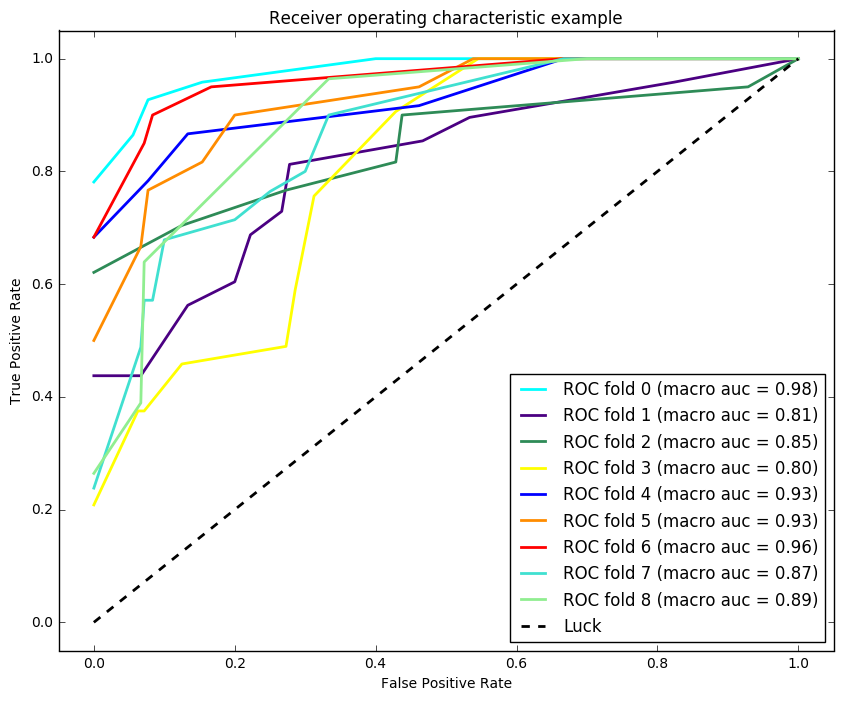

In [292]:
#%reset_selective fpr

# load dataset
data_path = '/media/SpatialPathology'
data_fname = 'ComputedFeatures_Label.csv'
data = []
Class = []
CaseName = []
ClassGrade = []

with open(os.path.join(data_path,data_fname),'rb') as csvfile:
    f_csv = csv.reader(csvfile,delimiter=',')
    f_csv = csv.DictReader(csvfile)
    for row in f_csv:
        data.append([float(value) for key, value in row.items() if key not in [
                   'Class','ClassGrade','CaseName','ER']])
        Class.append(row['Class'])
        ClassGrade.append(row['ClassGrade'])
        CaseName.append(row['CaseName'])

data = np.vstack(data)
print data.shape
ClassLabel = np.asarray([int(Class[i]=='DCIS') for i in xrange(len(Class))])
# print ClassLabel
data_train = data[:116,:]
data_test = data[116:,:]
ClassGradeBin = preprocessing.label_binarize(ClassGrade,classes=[
        'UDH','Low_DCIS','Medium_DCIS','High_DCIS'])
ClassGradeLabel = np.argmax(ClassGradeBin,axis = 1)
n_classes = ClassGradeBin.shape[1]

y_train = ClassGradeLabel[:116]
y_test = ClassGradeLabel[116:]

print data_train.shape, data_test.shape, y_train.shape, y_test.shape

scaler = preprocessing.StandardScaler().fit(data_train)
data_train_scaled = scaler.transform(data_train)
data_test_scaled = scaler.transform(data_test)
X = data_train_scaled
y = np.asarray(y_train)
y_bin = ClassGradeBin
y_train_bin = ClassGradeBin[:116,:]
y_test_bin = ClassGradeBin[116:,:]

random_state = np.random.RandomState(123)
#C = 1
cv_model = linear_model.LogisticRegressionCV(cv = 9, penalty='l1', scoring='roc_auc',solver='liblinear')
cv_model.fit(data_train_scaled,y_train)
#print np.mean(cv_model.C_)
#print mode(cv_model.C_)
C = mode(cv_model.C_)[0][0]
print 'Regularization parameter: ',C 
#clf = linear_model.LogisticRegression(penalty='l1',C = C, random_state=random_state)

colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2

cv = StratifiedKFold(n_splits=9)

i = 0
model = []
model_perf = []
mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)
# story value for cross validation
fpr_cv = dict()
tpr_cv = dict()
auc_cv = dict()
acc_cv = dict()

for (train, test), color in zip(cv.split(X, y), colors):
    clf = linear_model.LogisticRegression(penalty='l1',
                                          C = C, random_state=random_state)
    model.append(clf.fit(X[train], y[train]))
    probas_ = model[i].predict_proba(X[test])
    # Compute ROC curve and area the curve
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for j in range(n_classes):
        fpr[j], tpr[j], _ = roc_curve(y_bin[test,j], probas_[:, j])
        roc_auc[j] = auc(fpr[j], tpr[j])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_bin[test].ravel(), probas_.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # macro average ROC curve and ROC area
    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for j in range(n_classes):
        mean_tpr += interp(all_fpr, fpr[j], tpr[j])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    
    # accuracy    
    ypred = model[i].predict(X[test])
    acc = accuracy_score(y[test],ypred)
    model_perf.append(acc + roc_auc['micro'] + roc_auc['macro'])
    
    plt.plot(fpr['macro'], tpr['macro'], lw=lw, color=color,
             label='ROC fold %d (macro auc = %0.2f)' % (i, roc_auc['macro']))
    
    fpr_cv[(i,'micro', 'val')] = fpr['micro']
    tpr_cv[(i,'micro','val')] = tpr['micro']
    auc_cv[(i,'micro','val')] = roc_auc['micro']
    
    fpr_cv[(i,'macro', 'val')] = fpr['macro']
    tpr_cv[(i,'macro','val')] = tpr['macro']
    auc_cv[(i,'macro','val')] = roc_auc['macro']
    acc_cv[(i,'val')] = acc
    print(('Fold %d: validation accuracy =%0.2f,'+
          'macro auc = %0.2f and micro auc = %0.2f') %(
            i, acc, roc_auc['macro'],roc_auc['micro']))
    i += 1
    
plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

setting = 'nucFeats'
# get the best model
model_perf = np.asarray(model_perf)
best_model = np.argmax(model_perf)
curr_key = (setting + '_micro' + '_CV' + '_4way' )
fpr_dict[curr_key] = fpr_cv[(best_model,'micro', 'val')]
tpr_dict[curr_key] = tpr_cv[(best_model,'micro','val')]
auc_dict[curr_key] = auc_cv[(best_model,'micro','val')]

curr_key = (setting + '_macro' + '_CV' + '_4way' )
fpr_dict[curr_key] = fpr_cv[(best_model,'macro', 'val')]
tpr_dict[curr_key] = tpr_cv[(best_model,'macro','val')]
auc_dict[curr_key] = auc_cv[(best_model,'macro','val')]

curr_key = (setting + '_CV' + '_4way' )
acc_dict[curr_key] = acc_cv[(best_model,'val')]

In [265]:
#%reset_selective fpr

# load dataset
data_path = '/media/SpatialPathology'
data_fname = 'ComputedFeatures_Label.csv'
data = []
Class = []
CaseName = []
ClassGrade = []

with open(os.path.join(data_path,data_fname),'rb') as csvfile:
    f_csv = csv.reader(csvfile,delimiter=',')
    f_csv = csv.DictReader(csvfile)
    for row in f_csv:
        data.append([float(value) for key, value in row.items() if key not in [
                   'Class','ClassGrade','CaseName','ER']])
        Class.append(row['Class'])
        ClassGrade.append(row['ClassGrade'])
        CaseName.append(row['CaseName'])

data = np.vstack(data)
print data.shape
ClassLabel = np.asarray([int(Class[i]=='DCIS') for i in xrange(len(Class))])
# print ClassLabel
data_train = data[:116,:]
data_test = data[116:,:]
ClassGradeBin = preprocessing.label_binarize(ClassGrade,classes=[
        'UDH','Low_DCIS','Medium_DCIS','High_DCIS'])
ClassGradeLabel = np.argmax(ClassGradeBin,axis = 1)
n_classes = ClassGradeBin.shape[1]

y_train = ClassGradeLabel[:116]
y_test = ClassGradeLabel[116:]

print data_train.shape, data_test.shape, y_train.shape, y_test.shape

scaler = preprocessing.StandardScaler().fit(data)
data_scaled = scaler.transform(data)

X = data_scaled
y = np.asarray(ClassGradeLabel)
y_bin = ClassGradeBin

random_state = np.random.RandomState(123)

cv_model = linear_model.LogisticRegressionCV(cv = 9, penalty='l1', scoring='roc_auc',solver='liblinear')
cv_model.fit(X,y)
print np.mean(cv_model.C_)
print mode(cv_model.C_)

(167, 392)
(116, 392) (51, 392) (116,) (51,)
6.26141725882
ModeResult(mode=array([ 0.35938137]), count=array([2]))


In [250]:
print cv_model.C_
print mode(cv_model.C_)[0][0]

[  0.35938137   0.35938137   0.35938137  21.5443469 ]
0.35938136638


(167, 392)
(116, 392) (51, 392) (276,) (51,)
Regularization parameters:  0.1
Fold 0: validation accuracy =0.71,macro auc = 0.91 and micro auc = 0.88
Test accuracy =0.61, macro auc = 0.73 and micro auc = 0.82
Fold 1: validation accuracy =0.50,macro auc = 0.71 and micro auc = 0.72
Test accuracy =0.61, macro auc = 0.76 and micro auc = 0.84
Fold 2: validation accuracy =0.79,macro auc = 0.94 and micro auc = 0.88
Test accuracy =0.61, macro auc = 0.75 and micro auc = 0.84
Fold 3: validation accuracy =0.46,macro auc = 0.83 and micro auc = 0.80
Test accuracy =0.61, macro auc = 0.76 and micro auc = 0.82
Fold 4: validation accuracy =0.54,macro auc = 0.84 and micro auc = 0.76
Test accuracy =0.61, macro auc = 0.75 and micro auc = 0.84
Fold 5: validation accuracy =0.54,macro auc = 0.87 and micro auc = 0.85
Test accuracy =0.63, macro auc = 0.78 and micro auc = 0.86
Fold 6: validation accuracy =0.69,macro auc = 0.93 and micro auc = 0.93
Test accuracy =0.61, macro auc = 0.79 and micro auc = 0.86
Fold 7

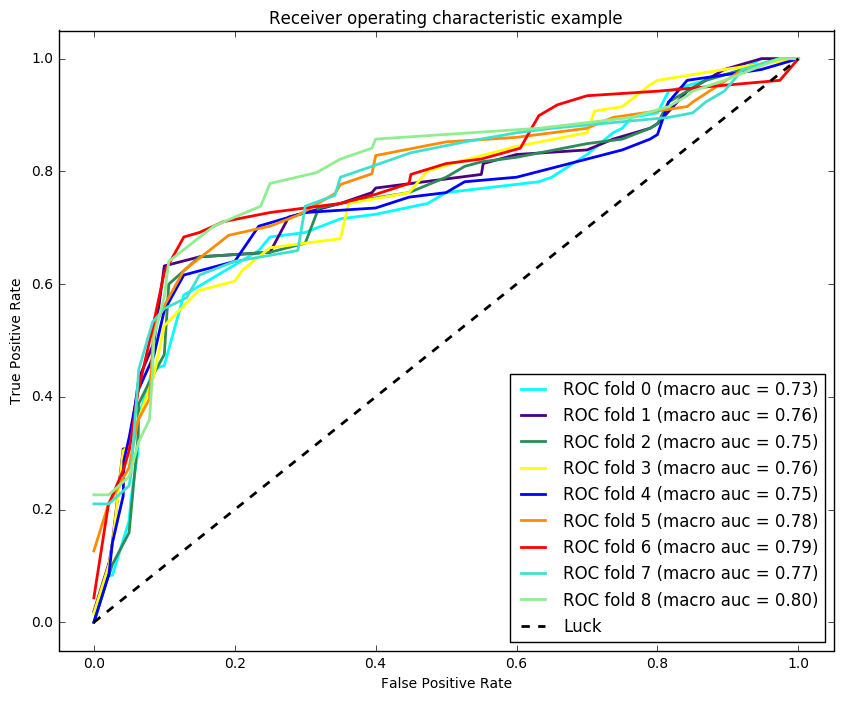

In [298]:
# load dataset
data_path = '/media/SpatialPathology'
data_fname = 'ComputedFeatures_Label.csv'
data = []
Class = []
CaseName = []
ClassGrade = []

with open(os.path.join(data_path,data_fname),'rb') as csvfile:
    f_csv = csv.reader(csvfile,delimiter=',')
    f_csv = csv.DictReader(csvfile)
    for row in f_csv:
        data.append([float(value) for key, value in row.items() if key not in [
                   'Class','ClassGrade','CaseName','ER']])
        Class.append(row['Class'])
        ClassGrade.append(row['ClassGrade'])
        CaseName.append(row['CaseName'])

data = np.vstack(data)
print data.shape
ClassLabel = np.asarray([int(Class[i]=='DCIS') for i in xrange(len(Class))])
# print ClassLabel
data_train = data[:116,:]
data_test = data[116:,:]
ClassGradeBin = preprocessing.label_binarize(ClassGrade,classes=[
        'UDH','Low_DCIS','Medium_DCIS','High_DCIS'])
ClassGradeLabel = np.argmax(ClassGradeBin,axis = 1)
n_classes = ClassGradeBin.shape[1]


print data_train.shape, data_test.shape, y_train.shape, y_test.shape

scaler = preprocessing.StandardScaler().fit(data_train)
data_train_scaled = scaler.transform(data_train)
data_test_scaled = scaler.transform(data_test)

y_train_bin = ClassGradeBin[:116]
y_test_bin = ClassGradeBin[116:]
y_train = ClassGradeLabel[:116]
y_test = ClassGradeLabel[116:]

X = data_train_scaled
y = y_train
y_bin = y_train_bin

random_state = np.random.RandomState(123)
# C = .1 # BEST ONE
# C = 5.6
#C = 0.35938137
cv_model = linear_model.LogisticRegressionCV(cv = 9, penalty='l1', scoring='roc_auc',solver='liblinear')
cv_model.fit(X,y)
#print np.mean(cv_model.C_)
C = mode(cv_model.C_)[0][0]
print 'Regularization parameters: ',C

#clf = linear_model.LogisticRegression(penalty='l1',C = C, random_state=random_state)

colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2

cv = StratifiedKFold(n_splits=9)

i = 0
model = []
model_perf = []
mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)
# story value for cross validation
fpr_cv = dict()
tpr_cv = dict()
auc_cv = dict()
acc_cv = dict()

for (train, test), color in zip(cv.split(X, y), colors):
    clf = linear_model.LogisticRegression(penalty='l1',
                                          C = C, random_state=random_state)
    model.append(clf.fit(X[train], y[train]))
    probas_ = model[i].predict_proba(X[test])
    # Compute ROC curve and area the curve
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for j in range(n_classes):
        fpr[j], tpr[j], _ = roc_curve(y_bin[test,j], probas_[:, j])
        roc_auc[j] = auc(fpr[j], tpr[j])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_bin[test].ravel(), probas_.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # macro average ROC curve and ROC area
    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for j in range(n_classes):
        mean_tpr += interp(all_fpr, fpr[j], tpr[j])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    
    # accuracy    
    ypred = model[i].predict(X[test])
    acc = accuracy_score(y[test],ypred)
    model_perf.append(acc + roc_auc['micro'] + roc_auc['macro'])
    
    #plt.plot(fpr['macro'], tpr['macro'], lw=lw, color=color,
    #         label='ROC fold %d (macro auc = %0.2f)' % (i, roc_auc['macro']))
    
    fpr_cv[(i,'micro', 'val')] = fpr['micro']
    tpr_cv[(i,'micro','val')] = tpr['micro']
    auc_cv[(i,'micro','val')] = roc_auc['micro']
    
    fpr_cv[(i,'macro', 'val')] = fpr['macro']
    tpr_cv[(i,'macro','val')] = tpr['macro']
    auc_cv[(i,'macro','val')] = roc_auc['macro']
    acc_cv[(i,'val')] = acc
    print(('Fold %d: validation accuracy =%0.2f,'+
          'macro auc = %0.2f and micro auc = %0.2f') %(
            i, acc, roc_auc['macro'],roc_auc['micro']))
    
    ### ### ### ### ### ### ### ### ### ### 
    ### ### make it to test set ### ### ### 
    ### ### ### ### ### ### ### ### ### ###
    probas_ = model[i].predict_proba(data_test_scaled)
    # Compute ROC curve and area the curve
    
    for j in range(n_classes):
        fpr[j], tpr[j], _ = roc_curve(y_test_bin[:,j], probas_[:, j])
        roc_auc[j] = auc(fpr[j], tpr[j])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), probas_.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # macro average ROC curve and ROC area
    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))

    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for j in range(n_classes):
        mean_tpr += interp(all_fpr, fpr[j], tpr[j])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    
    # accuracy    
    ypred = model[i].predict(data_test_scaled)
    acc = accuracy_score(y_test,ypred)
    
    plt.plot(fpr['macro'], tpr['macro'], lw=lw, color=color,
             label='ROC fold %d (macro auc = %0.2f)' % (i, roc_auc['macro']))
    
    fpr_cv[(i,'micro', 'test')] = fpr['micro']
    tpr_cv[(i,'micro','test')] = tpr['micro']
    auc_cv[(i,'micro','test')] = roc_auc['micro']
    
    fpr_cv[(i,'macro', 'test')] = fpr['macro']
    tpr_cv[(i,'macro','test')] = tpr['macro']
    auc_cv[(i,'macro','test')] = roc_auc['macro']
    acc_cv[(i,'test')] = acc
    
    print(('Test accuracy =%0.2f, macro auc = %0.2f and micro auc = %0.2f') %(
            acc, roc_auc['macro'],roc_auc['micro']))
    
    i += 1
    
plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")
plt.show()

setting = 'nucFeats'
# get the best model
model_perf = np.asarray(model_perf)
best_model = np.argmax(model_perf)
curr_key = (setting + '_micro' + '_val' + '_4way' )
fpr_dict[curr_key] = fpr_cv[(best_model,'micro', 'val')]
tpr_dict[curr_key] = tpr_cv[(best_model,'micro','val')]
auc_dict[curr_key] = auc_cv[(best_model,'micro','val')]

curr_key = (setting + '_macro' + '_val' + '_4way' )
fpr_dict[curr_key] = fpr_cv[(best_model,'macro', 'val')]
tpr_dict[curr_key] = tpr_cv[(best_model,'macro','val')]
auc_dict[curr_key] = auc_cv[(best_model,'macro','val')]

curr_key = (setting + '_val' + '_4way' )
acc_dict[curr_key] = acc_cv[(best_model,'val')]

#####################################################
curr_key = (setting + '_micro' + '_test' + '_4way' )
fpr_dict[curr_key] = fpr_cv[(best_model,'micro', 'test')]
tpr_dict[curr_key] = tpr_cv[(best_model,'micro','test')]
auc_dict[curr_key] = auc_cv[(best_model,'micro','test')]

curr_key = (setting + '_macro' + '_test' + '_4way' )
fpr_dict[curr_key] = fpr_cv[(best_model,'macro', 'test')]
tpr_dict[curr_key] = tpr_cv[(best_model,'macro','test')]
auc_dict[curr_key] = auc_cv[(best_model,'macro','test')]

curr_key = (setting + '_test' + '_4way' )
acc_dict[curr_key] = acc_cv[(best_model,'test')]

In [390]:
colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2
cv = StratifiedKFold(n_splits=9)

# CaseName = []
# ClassGrade = []
# Hospital = []
# rw_data = []
for param_set in xrange(len(rw_settings)):
    print('parameter setting %s' %(rw_settings[param_set]))
    # read in the file
    CaseName = []
    ClassGrade = []
    Hospital = []
    rw_data = []
    with open(os.path.join(rw_dir, (
                'train_test_list_' + rw_settings[param_set]+'.csv')),'rb') as csvfile:
        f_csv = csv.reader(csvfile,delimiter = ',')
        for row in f_csv:
            CaseName.append(row[0])
            ClassGrade.append(int(row[1]))
            Hospital.append(int(row[2]))
            rw_data.append([float(row[i]) for i in xrange(3,len(row))])
    data = np.vstack(rw_data)
    ClassGrade = np.asarray(ClassGrade)
    ClassGradeBin = preprocessing.label_binarize(ClassGrade, classes =[0,1,2,3])
    ClassLabel = np.asarray([int(ClassGrade[i] > 0) for i in 
                                 xrange(len(ClassGrade))])
    Hospital = np.asarray(Hospital)
    #print rw_data.shape, ClassGrade.shape
    data_train = data[Hospital == 1,:]
    data_test = data[Hospital == 0, :]
    y_train = ClassLabel[Hospital == 1]
    y_test = ClassLabel[Hospital == 0]
    #print data_train.shape, data_test.shape, len(y_train), len(y_test)

    ###################################################
    ###################BINARY###################
    ###################################################
    scaler = preprocessing.StandardScaler().fit(data)
    X = scaler.transform(data)
    y = ClassGrade
    y_bin = ClassGradeBin

    random_state = np.random.RandomState(123)
    ##############################################
    ###################CV for C###################
    ##############################################
    cv_model = linear_model.LogisticRegressionCV(
        Cs=30,cv = 9, penalty='l1', scoring='roc_auc',solver='liblinear')
    cv_model.fit(X,y)
    #print np.mean(cv_model.C_)
    C = mode(cv_model.C_)[0][0]
    #C = 1
    probas_ = cv_model.predict_proba(X)

    # Compute ROC curve and area the curve
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for j in range(n_classes):
        fpr[j], tpr[j], _ = roc_curve(y_bin[:,j], probas_[:, j])
        roc_auc[j] = auc(fpr[j], tpr[j])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_bin.ravel(), probas_.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # macro average ROC curve and ROC area
    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))
    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for j in range(n_classes):
        mean_tpr += interp(all_fpr, fpr[j], tpr[j])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    acc = cv_model.score(X,y)
    ypred = cv_model.predict(X)#   print 'prediction is', ypred
    setting = rw_settings[param_set]
    print('Setting is %s has C=%0.2f and %d non zero coeffs' %(
            setting, C, np.sum(cv_model.coef_ !=0)))
    print('Acc=%0.2f, micro auc =%0.2f, macro auc = %0.2f' %(
        acc, roc_auc['micro'], roc_auc['macro']))

    curr_key = (setting + '_micro' + '_CV' + '_4way' )
    fpr_dict[curr_key] = fpr['micro']
    tpr_dict[curr_key] = tpr['micro']
    auc_dict[curr_key] = roc_auc['micro']

    curr_key = (setting + '_macro' + '_CV' + '_4way' )
    fpr_dict[curr_key] = fpr['macro']
    tpr_dict[curr_key] = tpr['macro']
    auc_dict[curr_key] = roc_auc['macro']

    curr_key = (setting + '_CV' + '_4way' )
    acc_dict[curr_key] = acc

parameter setting colorobjectclusters
Setting is colorobjectclusters has C=0.06 and 15 non zero coeffs
Acc=0.49, micro auc =0.78, macro auc = 0.75
parameter setting cellclusters_maxD5_k90
Setting is cellclusters_maxD5_k90 has C=0.06 and 20 non zero coeffs
Acc=0.48, micro auc =0.76, macro auc = 0.76
parameter setting cellclusters_maxD5_k90_SI
Setting is cellclusters_maxD5_k90_SI has C=0.06 and 17 non zero coeffs
Acc=0.45, micro auc =0.71, macro auc = 0.67
parameter setting cellclusters_maxD5_k95
Setting is cellclusters_maxD5_k95 has C=0.06 and 17 non zero coeffs
Acc=0.49, micro auc =0.75, macro auc = 0.73
parameter setting cellclusters_maxD5_k95_SI
Setting is cellclusters_maxD5_k95_SI has C=0.03 and 26 non zero coeffs
Acc=0.40, micro auc =0.70, macro auc = 0.70
parameter setting cellclusters_maxD10_k90
Setting is cellclusters_maxD10_k90 has C=0.03 and 34 non zero coeffs
Acc=0.51, micro auc =0.79, macro auc = 0.79
parameter setting cellclusters_maxD10_k90_SI
Setting is cellclusters_maxD1

In [397]:
colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2
cv = StratifiedKFold(n_splits=9)

# CaseName = []
# ClassGrade = []
# Hospital = []
# rw_data = []
for param_set in xrange(len(rw_settings)):
    print('parameter setting %s' %(rw_settings[param_set]))
    # read in the file
    CaseName = []
    ClassGrade = []
    Hospital = []
    rw_data = []
    with open(os.path.join(rw_dir, (
                'train_test_list_' + rw_settings[param_set]+'.csv')),'rb') as csvfile:
        f_csv = csv.reader(csvfile,delimiter = ',')
        for row in f_csv:
            CaseName.append(row[0])
            ClassGrade.append(int(row[1]))
            Hospital.append(int(row[2]))
            rw_data.append([float(row[i]) for i in xrange(3,len(row))])
    data = np.vstack(rw_data)
    ClassGrade = np.asarray(ClassGrade)
    ClassGradeBin = preprocessing.label_binarize(ClassGrade, classes =[0,1,2,3])
    ClassLabel = np.asarray([int(ClassGrade[i] > 0) for i in 
                                 xrange(len(ClassGrade))])
    Hospital = np.asarray(Hospital)
    #print rw_data.shape, ClassGrade.shape
    data_train = data[Hospital == 1,:]
    data_test = data[Hospital == 0, :]
    y_train = ClassGrade[Hospital == 1]
    y_test = ClassGrade[Hospital == 0]
    #print data_train.shape, data_test.shape, len(y_train), len(y_test)

    ###################################################
    ###################BINARY###################
    ###################################################
    scaler = preprocessing.StandardScaler().fit(data_train)
    data_train_scaled = scaler.transform(data_train)
    data_test_scaled = scaler.transform(data_test)
    y_bin = ClassGradeBin
    y_train_bin = ClassGradeBin[Hospital == 1,:]
    y_test_bin = ClassGradeBin[Hospital == 0,:]

    random_state = np.random.RandomState(123)
    ##############################################
    ###################CV for train ###################
    ##############################################
    cv_model = linear_model.LogisticRegressionCV(
        Cs=50,cv = 9, penalty='l1', scoring='roc_auc',solver='liblinear')
    cv_model.fit(data_train_scaled,y_train)
    #print np.mean(cv_model.C_)
    C = mode(cv_model.C_)[0][0]
    #C = 1
    probas_ = cv_model.predict_proba(data_train_scaled)

    # Compute ROC curve and area the curve
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for j in range(n_classes):
        fpr[j], tpr[j], _ = roc_curve(y_train_bin[:,j], probas_[:, j])
        roc_auc[j] = auc(fpr[j], tpr[j])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(
        y_train_bin.ravel(), probas_.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # macro average ROC curve and ROC area
    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))
    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for j in range(n_classes):
        mean_tpr += interp(all_fpr, fpr[j], tpr[j])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    acc = cv_model.score(data_train_scaled,y_train)
    ypred = cv_model.predict(data_train_scaled)#   print 'prediction is', ypred
    setting = rw_settings[param_set]
    print('Setting is %s has C=%0.2f and %d non zero coeffs' %(
            setting, C, np.sum(cv_model.coef_ !=0)))
    print('Train: Acc=%0.2f, micro auc =%0.2f, macro auc = %0.2f' %(
        acc, roc_auc['micro'], roc_auc['macro']))

    curr_key = (setting + '_micro' + '_val' + '_4way' )
    fpr_dict[curr_key] = fpr['micro']
    tpr_dict[curr_key] = tpr['micro']
    auc_dict[curr_key] = roc_auc['micro']

    curr_key = (setting + '_macro' + '_val' + '_4way' )
    fpr_dict[curr_key] = fpr['macro']
    tpr_dict[curr_key] = tpr['macro']
    auc_dict[curr_key] = roc_auc['macro']

    curr_key = (setting + '_val' + '_4way' )
    acc_dict[curr_key] = acc
    
    ##############################################
    ###################CV for test ###################
    ##############################################
    #C = 1
    probas_ = cv_model.predict_proba(data_test_scaled)

    # Compute ROC curve and area the curve
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for j in range(n_classes):
        fpr[j], tpr[j], _ = roc_curve(y_test_bin[:,j], probas_[:, j])
        roc_auc[j] = auc(fpr[j], tpr[j])

    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(
        y_test_bin.ravel(), probas_.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # macro average ROC curve and ROC area
    # First aggregate all false positive rates
    all_fpr = np.unique(np.concatenate(
            [fpr[j] for j in range(n_classes)]))
    # Then interpolate all ROC curves at this points
    mean_tpr = np.zeros_like(all_fpr)
    for j in range(n_classes):
        mean_tpr += interp(all_fpr, fpr[j], tpr[j])

    # Finally average it and compute AUC
    mean_tpr /= n_classes

    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

    acc = cv_model.score(data_test_scaled,y_test)
    ypred = cv_model.predict(data_test_scaled)#   print 'prediction is', ypred
    setting = rw_settings[param_set]
    print('Test: Acc=%0.2f, micro auc =%0.2f, macro auc = %0.2f\n' %(
        acc, roc_auc['micro'], roc_auc['macro']))

    curr_key = (setting + '_micro' + '_test' + '_4way' )
    fpr_dict[curr_key] = fpr['micro']
    tpr_dict[curr_key] = tpr['micro']
    auc_dict[curr_key] = roc_auc['micro']

    curr_key = (setting + '_macro' + '_test' + '_4way' )
    fpr_dict[curr_key] = fpr['macro']
    tpr_dict[curr_key] = tpr['macro']
    auc_dict[curr_key] = roc_auc['macro']

    curr_key = (setting + '_test' + '_4way' )
    acc_dict[curr_key] = acc
    

parameter setting colorobjectclusters
Setting is colorobjectclusters has C=0.18 and 18 non zero coeffs
Train: Acc=0.49, micro auc =0.79, macro auc = 0.77
Test: Acc=0.51, micro auc =0.73, macro auc = 0.69

parameter setting cellclusters_maxD5_k90
Setting is cellclusters_maxD5_k90 has C=0.09 and 23 non zero coeffs
Train: Acc=0.48, micro auc =0.76, macro auc = 0.76
Test: Acc=0.59, micro auc =0.81, macro auc = 0.66

parameter setting cellclusters_maxD5_k90_SI
Setting is cellclusters_maxD5_k90_SI has C=0.04 and 18 non zero coeffs
Train: Acc=0.43, micro auc =0.68, macro auc = 0.69
Test: Acc=0.55, micro auc =0.71, macro auc = 0.56

parameter setting cellclusters_maxD5_k95
Setting is cellclusters_maxD5_k95 has C=0.04 and 22 non zero coeffs
Train: Acc=0.47, micro auc =0.75, macro auc = 0.75
Test: Acc=0.61, micro auc =0.82, macro auc = 0.69

parameter setting cellclusters_maxD5_k95_SI
Setting is cellclusters_maxD5_k95_SI has C=0.57 and 32 non zero coeffs
Train: Acc=0.43, micro auc =0.72, macro a

/home/lun5/anaconda2/envs/biomarkers/lib/python2.7/site-packages/sklearn/linear_model/base.py:352: RuntimeWarning: overflow encountered in exp
  np.exp(prob, prob)


Setting is combinedcellclusters_maxD5_k95 has C=0.57 and 22 non zero coeffs
Train: Acc=0.33, micro auc =0.68, macro auc = 0.73
Test: Acc=0.12, micro auc =0.50, macro auc = 0.73

parameter setting combinedcellclusters_maxD5_k95_SI
Setting is combinedcellclusters_maxD5_k95_SI has C=0.83 and 42 non zero coeffs
Train: Acc=0.41, micro auc =0.67, macro auc = 0.66
Test: Acc=0.45, micro auc =0.67, macro auc = 0.57

parameter setting combinedcellclusters_maxD10_k90
Setting is combinedcellclusters_maxD10_k90 has C=0.06 and 19 non zero coeffs
Train: Acc=0.51, micro auc =0.77, macro auc = 0.75
Test: Acc=0.41, micro auc =0.69, macro auc = 0.76

parameter setting combinedcellclusters_maxD10_k90_SI
Setting is combinedcellclusters_maxD10_k90_SI has C=0.06 and 25 non zero coeffs
Train: Acc=0.42, micro auc =0.71, macro auc = 0.70
Test: Acc=0.53, micro auc =0.74, macro auc = 0.66

parameter setting combinedcellclusters_maxD10_k95
Setting is combinedcellclusters_maxD10_k95 has C=0.09 and 25 non zero coeff

In [ ]:
colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2
cv = StratifiedKFold(n_splits=9)

# CaseName = []
# ClassGrade = []
# Hospital = []
# rw_data = []
for param_set in xrange(len(rw_settings)):
    print('parameter setting %s' %(rw_settings[param_set]))
    # read in the file
    CaseName = []
    ClassGrade = []
    Hospital = []
    rw_data = []
    with open(os.path.join(rw_dir, (
                'train_test_list_' + rw_settings[param_set]+'.csv')),'rb') as csvfile:
        f_csv = csv.reader(csvfile,delimiter = ',')
        for row in f_csv:
            CaseName.append(row[0])
            ClassGrade.append(int(row[1]))
            Hospital.append(int(row[2]))
            rw_data.append([float(row[i]) for i in xrange(3,len(row))])
    data = np.vstack(rw_data)
    ClassGrade = np.asarray(ClassGrade)
    ClassGradeBin = preprocessing.label_binarize(ClassGrade, classes =[0,1,2,3])
    ClassLabel = np.asarray([int(ClassGrade[i] > 0) for i in 
                                 xrange(len(ClassGrade))])
    Hospital = np.asarray(Hospital)
    #print rw_data.shape, ClassGrade.shape
    data_train = data[Hospital == 1,:]
    data_test = data[Hospital == 0, :]
    y_train = ClassLabel[Hospital == 1]
    y_test = ClassLabel[Hospital == 0]
    print data_train.shape, data_test.shape, len(y_train), len(y_test)

    ###################################################
    ###################BINARY###################
    ###################################################
    scaler = preprocessing.StandardScaler().fit(data)
    X = scaler.transform(data)
    y = ClassGrade
    y_bin = ClassGradeBin

    random_state = np.random.RandomState(123)
    ##############################################
    ###################CV for C###################
    ##############################################
    cv_model = linear_model.LogisticRegressionCV(cv = 9, penalty='l1', scoring='roc_auc',solver='liblinear')
    cv_model.fit(X,y)
    #print np.mean(cv_model.C_)
    C = mode(cv_model.C_)[0][0]
    #C = 1
    
    print 'Regularization parameter: ',C
    ##############################################
    #clf = linear_model.LogisticRegression(penalty='l1',C = C, 
    #                                      random_state=random_state)
    
    i = 0
    model = []
    model_perf = []
    fpr_cv = dict()
    tpr_cv = dict()
    auc_cv = dict()
    acc_cv = dict()
    
    plt.figure()
    for (train, test), color in zip(cv.split(X, y), colors):
        clf = linear_model.LogisticRegression(penalty='l1',C = C, 
                                              random_state=random_state)
        model.append(clf.fit(X[train], y[train]))
        probas_ = model[i].predict_proba(X[test])
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
    
        for j in range(n_classes):
            fpr[j], tpr[j], _ = roc_curve(y_bin[test,j], probas_[:, j])
            roc_auc[j] = auc(fpr[j], tpr[j])

        # Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_bin[test].ravel(), probas_.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
        # macro average ROC curve and ROC area
        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))

        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for j in range(n_classes):
            mean_tpr += interp(all_fpr, fpr[j], tpr[j])

        # Finally average it and compute AUC
        mean_tpr /= n_classes

        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    
        # accuracy    
        ypred = model[i].predict(X[test])
        acc = accuracy_score(y[test],ypred)
        model_perf.append(acc + roc_auc['micro'] + roc_auc['macro'])
    
        plt.plot(fpr['macro'], tpr['macro'], lw=lw, color=color,
             label='ROC fold %d (macro auc = %0.2f)' % (i, roc_auc['macro']))
    
        fpr_cv[(i,'micro', 'val')] = fpr['micro']
        tpr_cv[(i,'micro','val')] = tpr['micro']
        auc_cv[(i,'micro','val')] = roc_auc['micro']
    
        fpr_cv[(i,'macro', 'val')] = fpr['macro']
        tpr_cv[(i,'macro','val')] = tpr['macro']
        auc_cv[(i,'macro','val')] = roc_auc['macro']
        acc_cv[(i,'val')] = acc
        print(('Fold %d: validation accuracy =%0.2f,'+
          'macro auc = %0.2f and micro auc = %0.2f') %(
            i, acc, roc_auc['macro'],roc_auc['micro']))
        i += 1
            
    plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(('parameter setting %s') %(rw_settings[param_set]))
    plt.legend(loc="lower right")
    plt.show()
    
    # get the best model
    model_perf = np.asarray(model_perf)
    best_model = np.argmax(model_perf)
    
    curr_key = (rw_settings[param_set] + '_micro' + '_CV' + '_4way' )
    fpr_dict[curr_key] = fpr_cv[(best_model,'micro', 'val')]
    tpr_dict[curr_key] = tpr_cv[(best_model,'micro','val')]
    auc_dict[curr_key] = auc_cv[(best_model,'micro','val')]

parameter setting colorobjectclusters
(276, 8) (51, 8) 276 51
Regularization parameter:  0.0464158883361
Fold 0: validation accuracy =0.50,macro auc = 0.68 and micro auc = 0.70
Fold 1: validation accuracy =0.47,macro auc = 0.79 and micro auc = 0.76
Fold 2: validation accuracy =0.54,macro auc = 0.73 and micro auc = 0.76
Fold 3: validation accuracy =0.46,macro auc = 0.70 and micro auc = 0.72
Fold 4: validation accuracy =0.54,macro auc = 0.75 and micro auc = 0.76
Fold 5: validation accuracy =0.34,macro auc = 0.77 and micro auc = 0.74
Fold 6: validation accuracy =0.57,macro auc = 0.73 and micro auc = 0.76
Fold 7: validation accuracy =0.40,macro auc = 0.70 and micro auc = 0.71
Fold 8: validation accuracy =0.26,macro auc = 0.63 and micro auc = 0.70


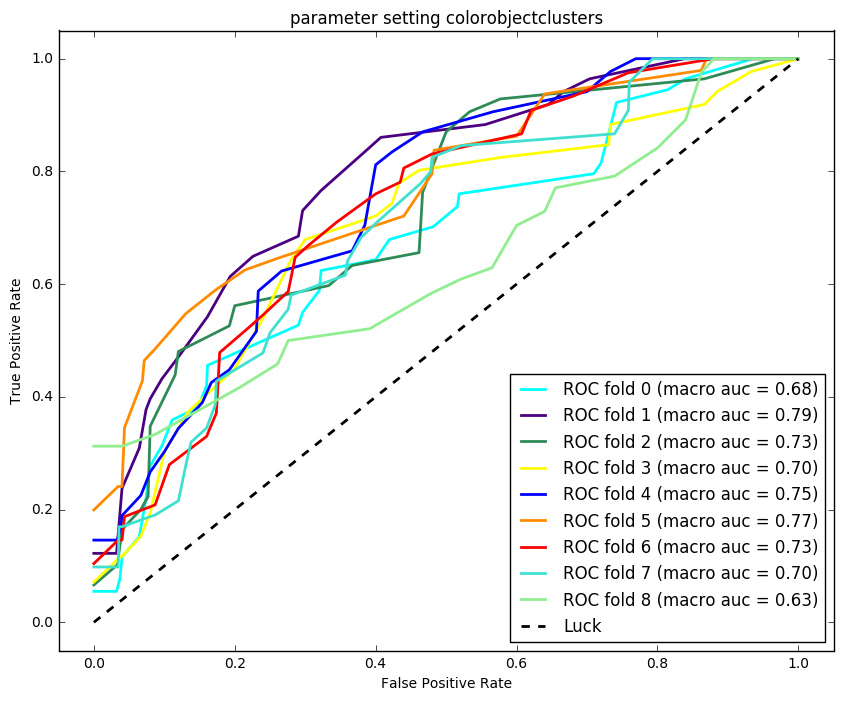

parameter setting cellclusters_maxD5_k90
(276, 8) (51, 8) 276 51
Regularization parameter:  0.0464158883361
Fold 0: validation accuracy =0.39,macro auc = 0.60 and micro auc = 0.69
Fold 1: validation accuracy =0.45,macro auc = 0.62 and micro auc = 0.67
Fold 2: validation accuracy =0.32,macro auc = 0.49 and micro auc = 0.59
Fold 3: validation accuracy =0.51,macro auc = 0.76 and micro auc = 0.74
Fold 4: validation accuracy =0.43,macro auc = 0.70 and micro auc = 0.70
Fold 5: validation accuracy =0.34,macro auc = 0.71 and micro auc = 0.69
Fold 6: validation accuracy =0.49,macro auc = 0.82 and micro auc = 0.77
Fold 7: validation accuracy =0.40,macro auc = 0.70 and micro auc = 0.72
Fold 8: validation accuracy =0.40,macro auc = 0.66 and micro auc = 0.70


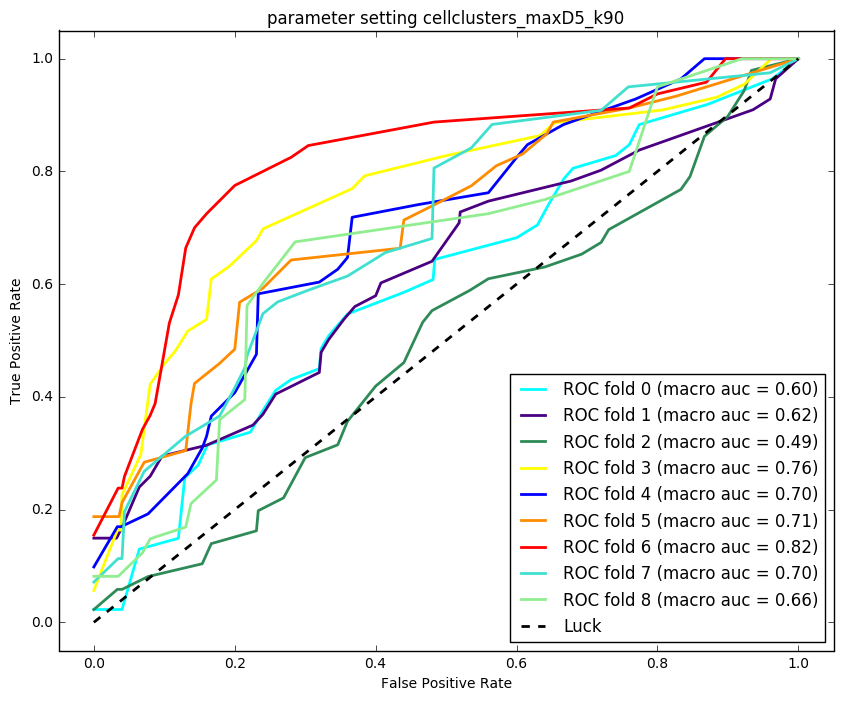

parameter setting cellclusters_maxD5_k90_SI
(276, 7) (51, 7) 276 51
Regularization parameter:  0.0464158883361
Fold 0: validation accuracy =0.34,macro auc = 0.64 and micro auc = 0.65
Fold 1: validation accuracy =0.37,macro auc = 0.62 and micro auc = 0.65
Fold 2: validation accuracy =0.30,macro auc = 0.48 and micro auc = 0.57
Fold 3: validation accuracy =0.35,macro auc = 0.77 and micro auc = 0.69
Fold 4: validation accuracy =0.35,macro auc = 0.61 and micro auc = 0.63
Fold 5: validation accuracy =0.37,macro auc = 0.64 and micro auc = 0.65
Fold 6: validation accuracy =0.46,macro auc = 0.74 and micro auc = 0.70
Fold 7: validation accuracy =0.43,macro auc = 0.67 and micro auc = 0.67
Fold 8: validation accuracy =0.37,macro auc = 0.60 and micro auc = 0.64


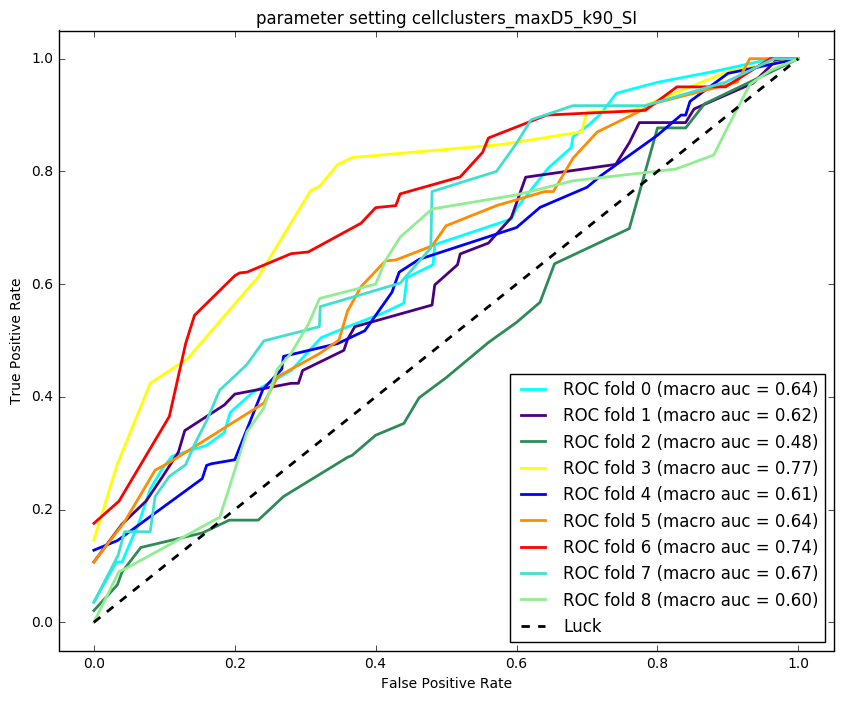

parameter setting cellclusters_maxD5_k95
(276, 14) (51, 14) 276 51
Regularization parameter:  0.0464158883361
Fold 0: validation accuracy =0.34,macro auc = 0.58 and micro auc = 0.67
Fold 1: validation accuracy =0.42,macro auc = 0.66 and micro auc = 0.68
Fold 2: validation accuracy =0.38,macro auc = 0.57 and micro auc = 0.62
Fold 3: validation accuracy =0.57,macro auc = 0.76 and micro auc = 0.75
Fold 4: validation accuracy =0.38,macro auc = 0.69 and micro auc = 0.69
Fold 5: validation accuracy =0.40,macro auc = 0.70 and micro auc = 0.69
Fold 6: validation accuracy =0.57,macro auc = 0.83 and micro auc = 0.78
Fold 7: validation accuracy =0.40,macro auc = 0.73 and micro auc = 0.73
Fold 8: validation accuracy =0.49,macro auc = 0.66 and micro auc = 0.70


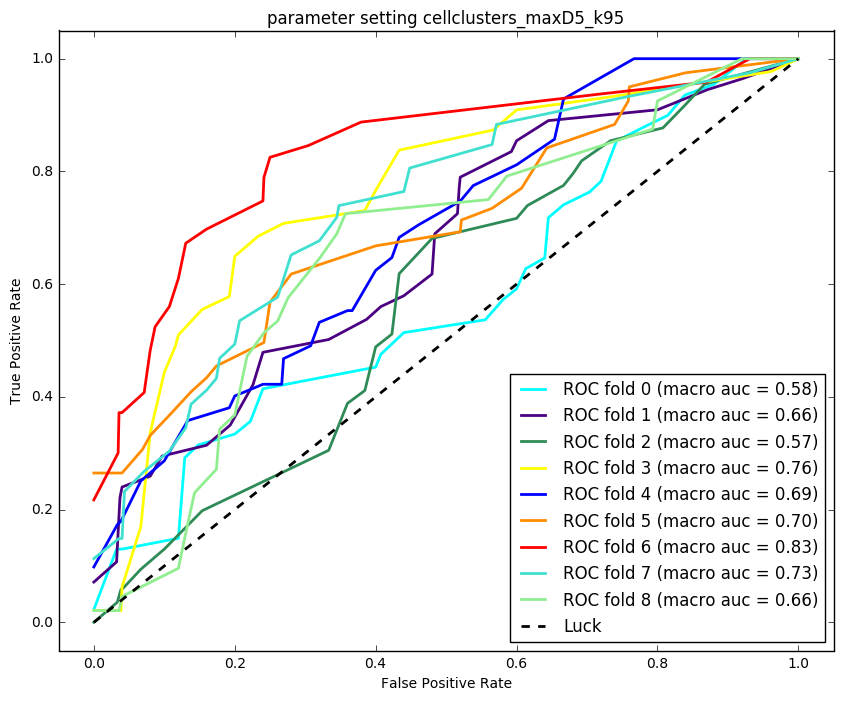

parameter setting cellclusters_maxD5_k95_SI
(276, 9) (51, 9) 276 51
Regularization parameter:  0.0464158883361
Fold 0: validation accuracy =0.34,macro auc = 0.53 and micro auc = 0.62
Fold 1: validation accuracy =0.42,macro auc = 0.63 and micro auc = 0.65
Fold 2: validation accuracy =0.32,macro auc = 0.50 and micro auc = 0.59
Fold 3: validation accuracy =0.43,macro auc = 0.66 and micro auc = 0.67
Fold 4: validation accuracy =0.38,macro auc = 0.60 and micro auc = 0.64
Fold 5: validation accuracy =0.40,macro auc = 0.65 and micro auc = 0.64
Fold 6: validation accuracy =0.43,macro auc = 0.68 and micro auc = 0.69
Fold 7: validation accuracy =0.34,macro auc = 0.67 and micro auc = 0.67
Fold 8: validation accuracy =0.40,macro auc = 0.68 and micro auc = 0.68


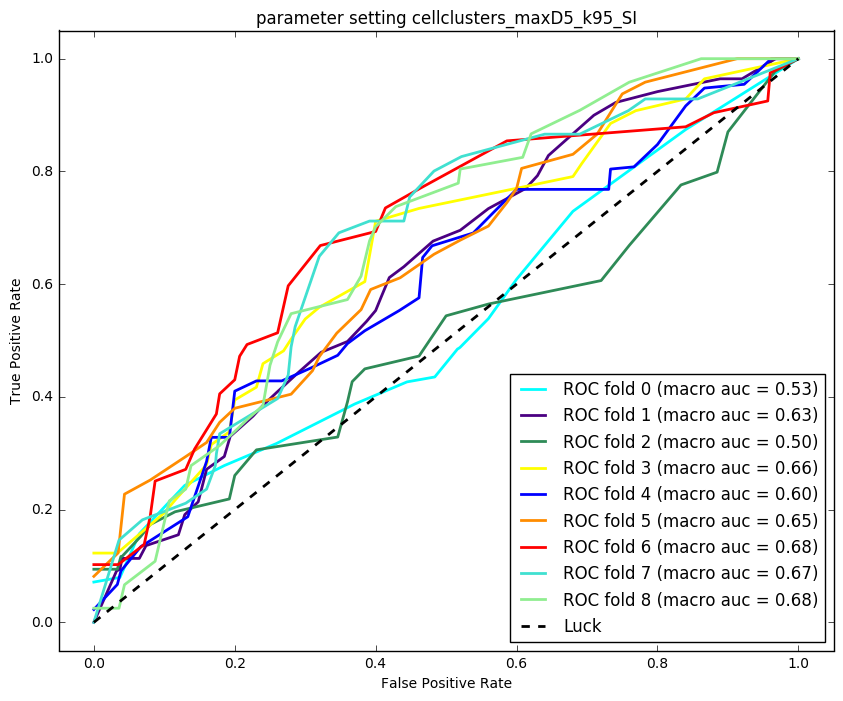

parameter setting cellclusters_maxD10_k90
(276, 13) (51, 13) 276 51
Regularization parameter:  166.81005372
Fold 0: validation accuracy =0.47,macro auc = 0.69 and micro auc = 0.71
Fold 1: validation accuracy =0.50,macro auc = 0.78 and micro auc = 0.80
Fold 2: validation accuracy =0.27,macro auc = 0.64 and micro auc = 0.63
Fold 3: validation accuracy =0.43,macro auc = 0.76 and micro auc = 0.77
Fold 4: validation accuracy =0.57,macro auc = 0.78 and micro auc = 0.75
Fold 5: validation accuracy =0.54,macro auc = 0.74 and micro auc = 0.73
Fold 6: validation accuracy =0.71,macro auc = 0.84 and micro auc = 0.82
Fold 7: validation accuracy =0.54,macro auc = 0.82 and micro auc = 0.82
Fold 8: validation accuracy =0.63,macro auc = 0.78 and micro auc = 0.81


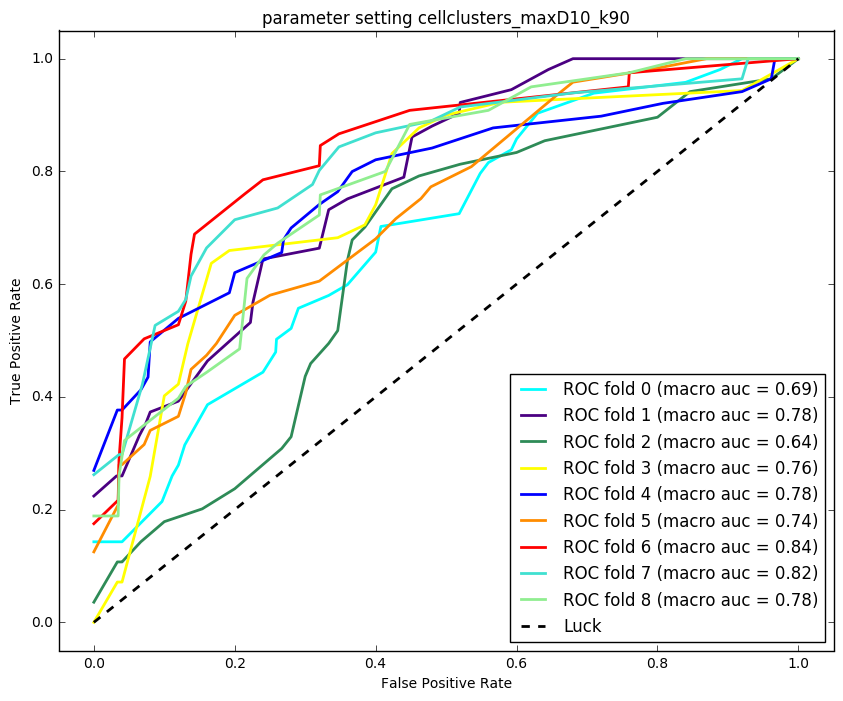

parameter setting cellclusters_maxD10_k90_SI
(276, 11) (51, 11) 276 51
Regularization parameter:  2.78255940221
Fold 0: validation accuracy =0.34,macro auc = 0.59 and micro auc = 0.65
Fold 1: validation accuracy =0.37,macro auc = 0.60 and micro auc = 0.61
Fold 2: validation accuracy =0.22,macro auc = 0.65 and micro auc = 0.64
Fold 3: validation accuracy =0.41,macro auc = 0.72 and micro auc = 0.70
Fold 4: validation accuracy =0.43,macro auc = 0.66 and micro auc = 0.66
Fold 5: validation accuracy =0.46,macro auc = 0.65 and micro auc = 0.70
Fold 6: validation accuracy =0.60,macro auc = 0.75 and micro auc = 0.75
Fold 7: validation accuracy =0.54,macro auc = 0.75 and micro auc = 0.78
Fold 8: validation accuracy =0.54,macro auc = 0.72 and micro auc = 0.75


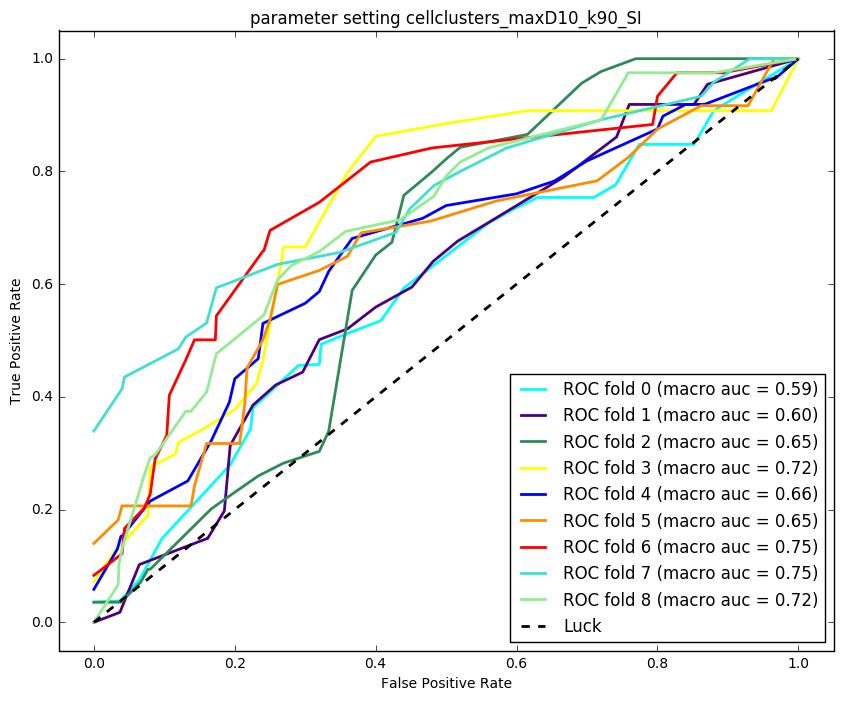

parameter setting cellclusters_maxD10_k95
(276, 14) (51, 14) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.39,macro auc = 0.63 and micro auc = 0.71
Fold 1: validation accuracy =0.50,macro auc = 0.76 and micro auc = 0.76
Fold 2: validation accuracy =0.41,macro auc = 0.68 and micro auc = 0.68
Fold 3: validation accuracy =0.38,macro auc = 0.71 and micro auc = 0.74
Fold 4: validation accuracy =0.49,macro auc = 0.71 and micro auc = 0.72
Fold 5: validation accuracy =0.37,macro auc = 0.68 and micro auc = 0.68
Fold 6: validation accuracy =0.49,macro auc = 0.75 and micro auc = 0.79
Fold 7: validation accuracy =0.49,macro auc = 0.74 and micro auc = 0.75
Fold 8: validation accuracy =0.63,macro auc = 0.78 and micro auc = 0.82


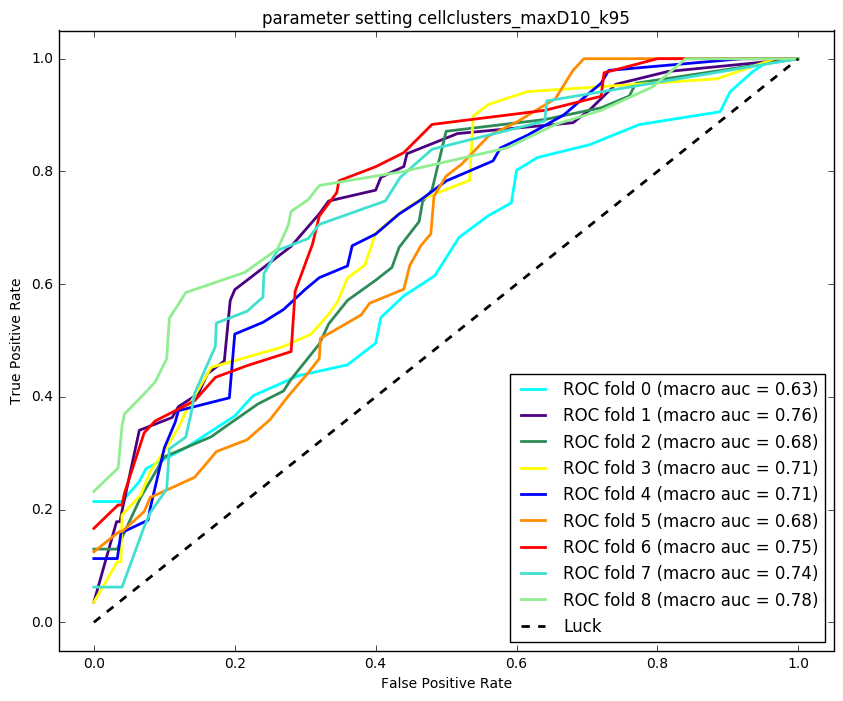

parameter setting cellclusters_maxD10_k95_SI
(276, 17) (51, 17) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.42,macro auc = 0.60 and micro auc = 0.68
Fold 1: validation accuracy =0.37,macro auc = 0.63 and micro auc = 0.64
Fold 2: validation accuracy =0.22,macro auc = 0.65 and micro auc = 0.61
Fold 3: validation accuracy =0.43,macro auc = 0.74 and micro auc = 0.76
Fold 4: validation accuracy =0.41,macro auc = 0.69 and micro auc = 0.71
Fold 5: validation accuracy =0.51,macro auc = 0.64 and micro auc = 0.70
Fold 6: validation accuracy =0.60,macro auc = 0.75 and micro auc = 0.80
Fold 7: validation accuracy =0.66,macro auc = 0.73 and micro auc = 0.77
Fold 8: validation accuracy =0.49,macro auc = 0.70 and micro auc = 0.75


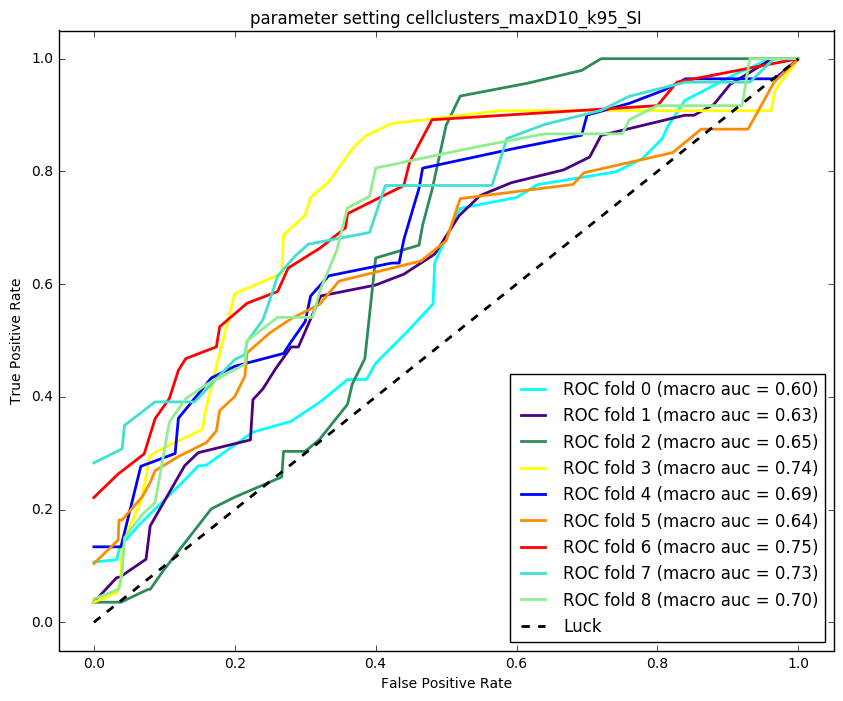

parameter setting combinedcellclusters_maxD5_k90
(276, 9) (51, 9) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.55,macro auc = 0.79 and micro auc = 0.79
Fold 1: validation accuracy =0.53,macro auc = 0.80 and micro auc = 0.79
Fold 2: validation accuracy =0.35,macro auc = 0.56 and micro auc = 0.63
Fold 3: validation accuracy =0.51,macro auc = 0.75 and micro auc = 0.75
Fold 4: validation accuracy =0.54,macro auc = 0.73 and micro auc = 0.70
Fold 5: validation accuracy =0.49,macro auc = 0.77 and micro auc = 0.79
Fold 6: validation accuracy =0.54,macro auc = 0.73 and micro auc = 0.78
Fold 7: validation accuracy =0.43,macro auc = 0.66 and micro auc = 0.69
Fold 8: validation accuracy =0.49,macro auc = 0.76 and micro auc = 0.77


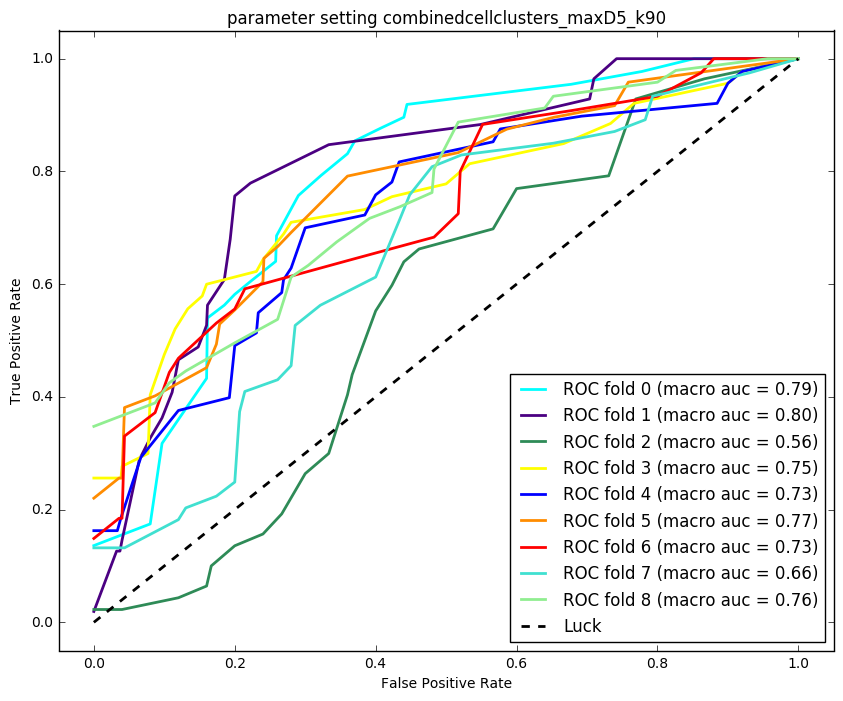

parameter setting combinedcellclusters_maxD5_k90_SI
(276, 11) (51, 11) 276 51
Regularization parameter:  0.0001
Fold 0: validation accuracy =0.34,macro auc = 0.50 and micro auc = 0.50
Fold 1: validation accuracy =0.34,macro auc = 0.50 and micro auc = 0.50
Fold 2: validation accuracy =0.32,macro auc = 0.50 and micro auc = 0.50
Fold 3: validation accuracy =0.32,macro auc = 0.50 and micro auc = 0.50
Fold 4: validation accuracy =0.32,macro auc = 0.50 and micro auc = 0.50
Fold 5: validation accuracy =0.34,macro auc = 0.50 and micro auc = 0.50
Fold 6: validation accuracy =0.34,macro auc = 0.50 and micro auc = 0.50
Fold 7: validation accuracy =0.34,macro auc = 0.50 and micro auc = 0.50
Fold 8: validation accuracy =0.34,macro auc = 0.50 and micro auc = 0.50


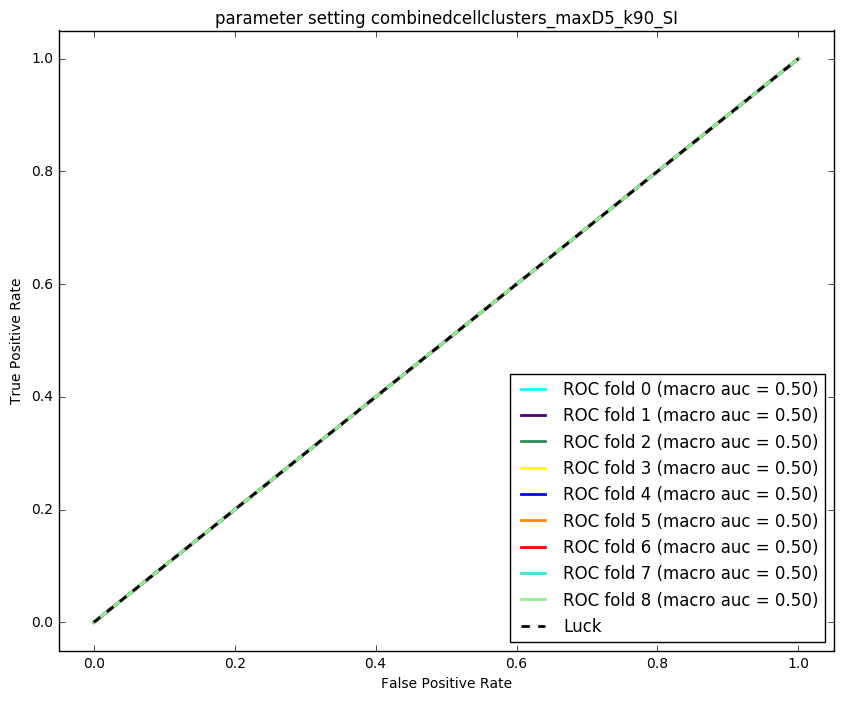

parameter setting combinedcellclusters_maxD5_k95
(276, 17) (51, 17) 276 51
Regularization parameter:  2.78255940221
Fold 0: validation accuracy =0.39,macro auc = 0.66 and micro auc = 0.68
Fold 1: validation accuracy =0.50,macro auc = 0.75 and micro auc = 0.77
Fold 2: validation accuracy =0.32,macro auc = 0.54 and micro auc = 0.61
Fold 3: validation accuracy =0.59,macro auc = 0.74 and micro auc = 0.75
Fold 4: validation accuracy =0.49,macro auc = 0.68 and micro auc = 0.69
Fold 5: validation accuracy =0.60,macro auc = 0.73 and micro auc = 0.77
Fold 6: validation accuracy =0.51,macro auc = 0.66 and micro auc = 0.74
Fold 7: validation accuracy =0.40,macro auc = 0.60 and micro auc = 0.64
Fold 8: validation accuracy =0.46,macro auc = 0.59 and micro auc = 0.65


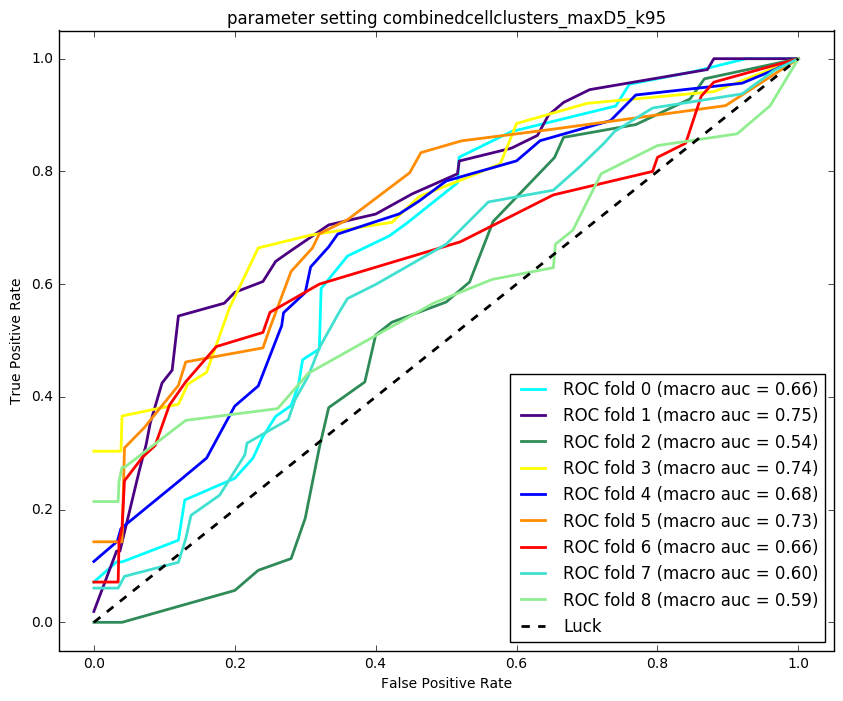

parameter setting combinedcellclusters_maxD5_k95_SI
(276, 12) (51, 12) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.32,macro auc = 0.53 and micro auc = 0.58
Fold 1: validation accuracy =0.39,macro auc = 0.58 and micro auc = 0.62
Fold 2: validation accuracy =0.41,macro auc = 0.57 and micro auc = 0.63
Fold 3: validation accuracy =0.41,macro auc = 0.71 and micro auc = 0.68
Fold 4: validation accuracy =0.35,macro auc = 0.63 and micro auc = 0.64
Fold 5: validation accuracy =0.40,macro auc = 0.60 and micro auc = 0.65
Fold 6: validation accuracy =0.37,macro auc = 0.58 and micro auc = 0.61
Fold 7: validation accuracy =0.29,macro auc = 0.49 and micro auc = 0.55
Fold 8: validation accuracy =0.34,macro auc = 0.58 and micro auc = 0.61


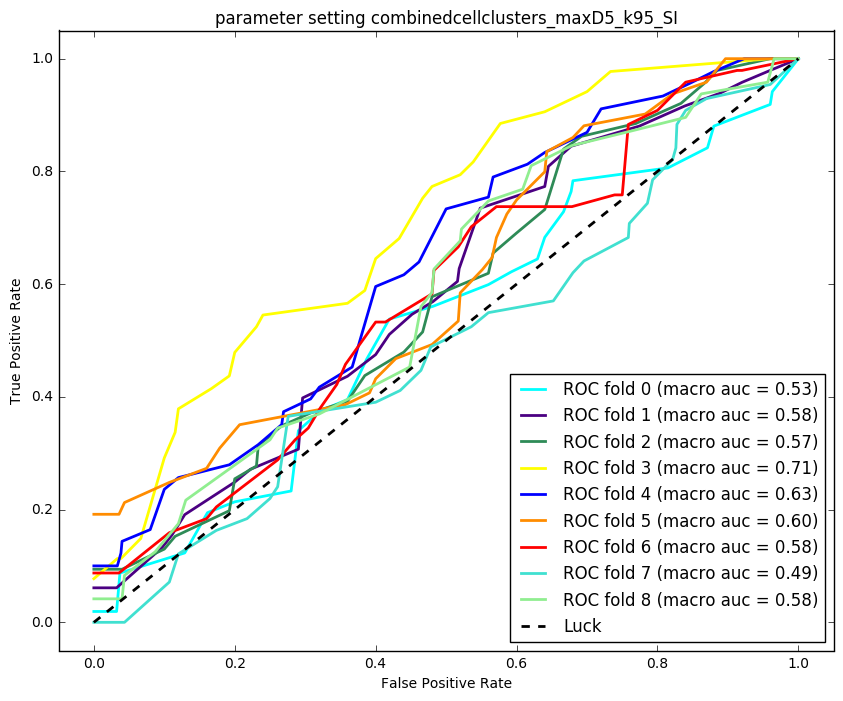

parameter setting combinedcellclusters_maxD10_k90
(276, 10) (51, 10) 276 51
Regularization parameter:  0.0464158883361
Fold 0: validation accuracy =0.42,macro auc = 0.66 and micro auc = 0.72
Fold 1: validation accuracy =0.47,macro auc = 0.70 and micro auc = 0.73
Fold 2: validation accuracy =0.38,macro auc = 0.50 and micro auc = 0.62
Fold 3: validation accuracy =0.54,macro auc = 0.75 and micro auc = 0.77
Fold 4: validation accuracy =0.46,macro auc = 0.70 and micro auc = 0.69
Fold 5: validation accuracy =0.51,macro auc = 0.67 and micro auc = 0.72
Fold 6: validation accuracy =0.51,macro auc = 0.73 and micro auc = 0.76
Fold 7: validation accuracy =0.49,macro auc = 0.63 and micro auc = 0.70
Fold 8: validation accuracy =0.46,macro auc = 0.69 and micro auc = 0.73


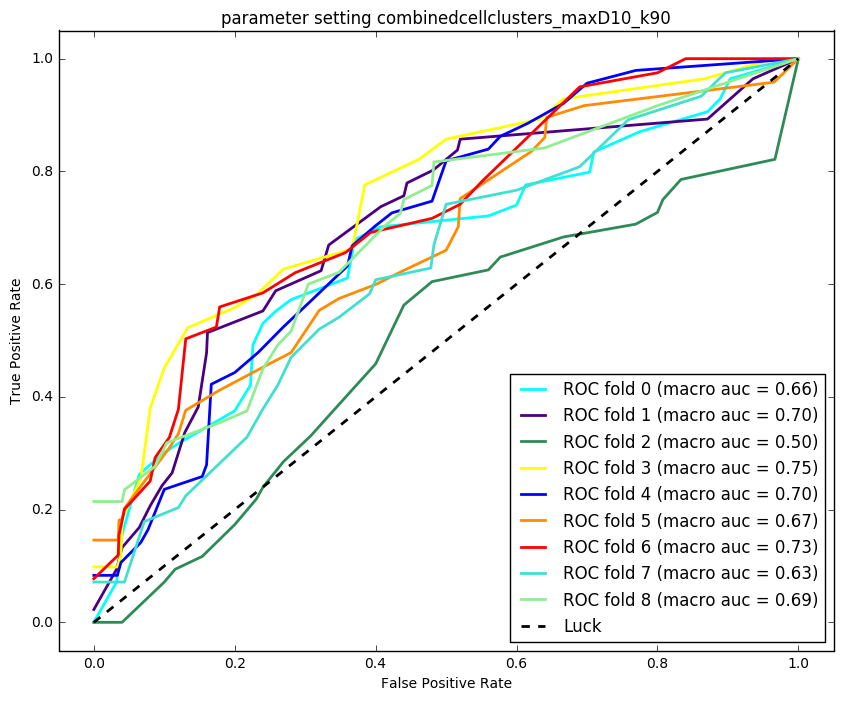

parameter setting combinedcellclusters_maxD10_k90_SI
(276, 18) (51, 18) 276 51
Regularization parameter:  0.0464158883361
Fold 0: validation accuracy =0.37,macro auc = 0.62 and micro auc = 0.67
Fold 1: validation accuracy =0.34,macro auc = 0.70 and micro auc = 0.66
Fold 2: validation accuracy =0.27,macro auc = 0.47 and micro auc = 0.59
Fold 3: validation accuracy =0.32,macro auc = 0.59 and micro auc = 0.62
Fold 4: validation accuracy =0.32,macro auc = 0.70 and micro auc = 0.66
Fold 5: validation accuracy =0.40,macro auc = 0.61 and micro auc = 0.65
Fold 6: validation accuracy =0.37,macro auc = 0.68 and micro auc = 0.67
Fold 7: validation accuracy =0.34,macro auc = 0.66 and micro auc = 0.65
Fold 8: validation accuracy =0.34,macro auc = 0.62 and micro auc = 0.64


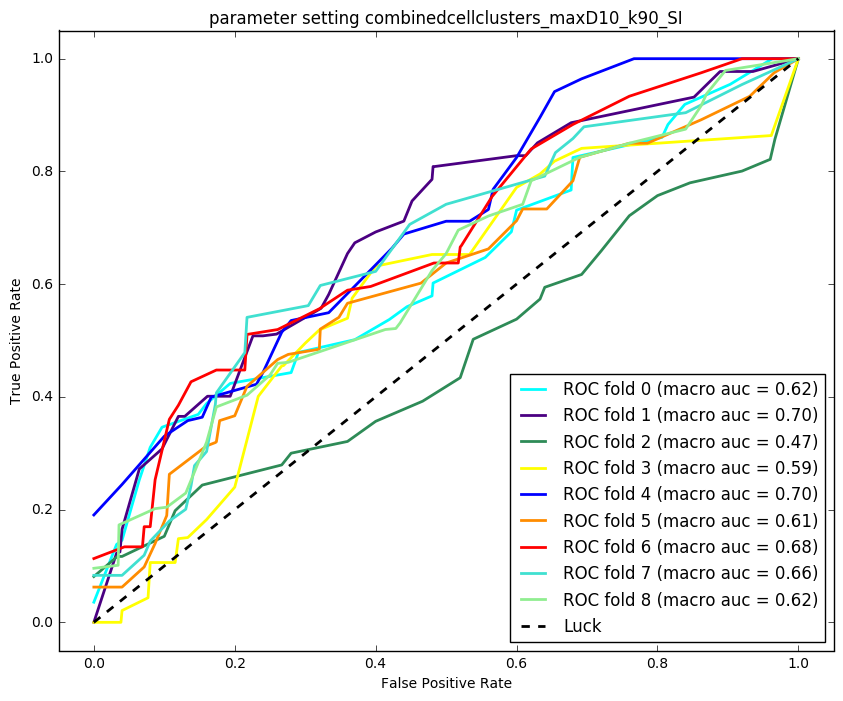

parameter setting combinedcellclusters_maxD10_k95
(276, 23) (51, 23) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.45,macro auc = 0.69 and micro auc = 0.71
Fold 1: validation accuracy =0.55,macro auc = 0.74 and micro auc = 0.79
Fold 2: validation accuracy =0.27,macro auc = 0.58 and micro auc = 0.63
Fold 3: validation accuracy =0.68,macro auc = 0.83 and micro auc = 0.86
Fold 4: validation accuracy =0.49,macro auc = 0.72 and micro auc = 0.73
Fold 5: validation accuracy =0.63,macro auc = 0.77 and micro auc = 0.82
Fold 6: validation accuracy =0.51,macro auc = 0.78 and micro auc = 0.80
Fold 7: validation accuracy =0.51,macro auc = 0.67 and micro auc = 0.72
Fold 8: validation accuracy =0.54,macro auc = 0.71 and micro auc = 0.76


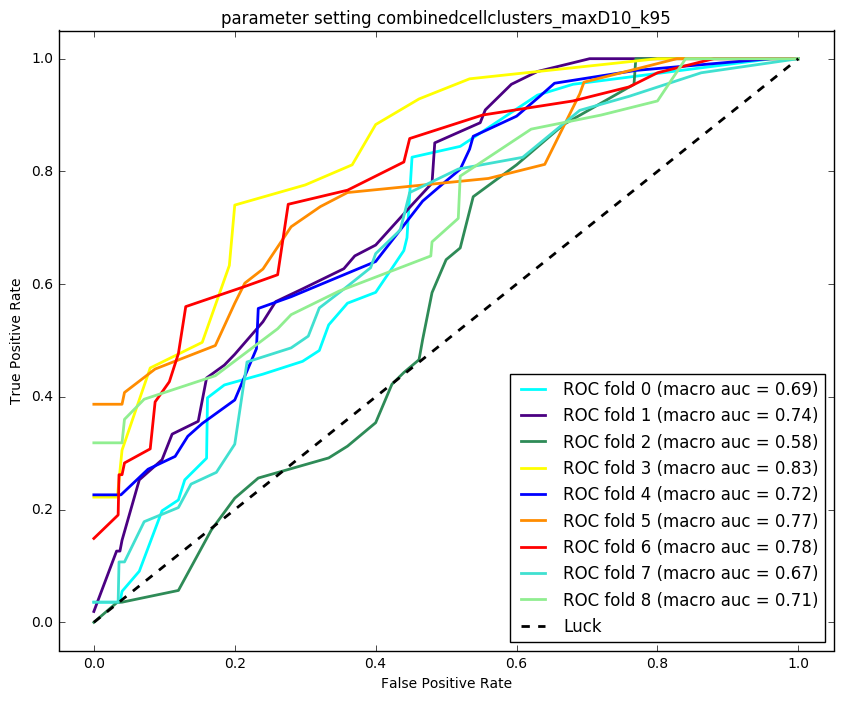

parameter setting combinedcellclusters_maxD10_k95_SI
(276, 22) (51, 22) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.45,macro auc = 0.75 and micro auc = 0.76
Fold 1: validation accuracy =0.47,macro auc = 0.67 and micro auc = 0.67
Fold 2: validation accuracy =0.35,macro auc = 0.64 and micro auc = 0.66
Fold 3: validation accuracy =0.35,macro auc = 0.68 and micro auc = 0.67
Fold 4: validation accuracy =0.35,macro auc = 0.55 and micro auc = 0.60
Fold 5: validation accuracy =0.29,macro auc = 0.68 and micro auc = 0.66
Fold 6: validation accuracy =0.40,macro auc = 0.63 and micro auc = 0.69
Fold 7: validation accuracy =0.43,macro auc = 0.64 and micro auc = 0.68
Fold 8: validation accuracy =0.54,macro auc = 0.65 and micro auc = 0.68


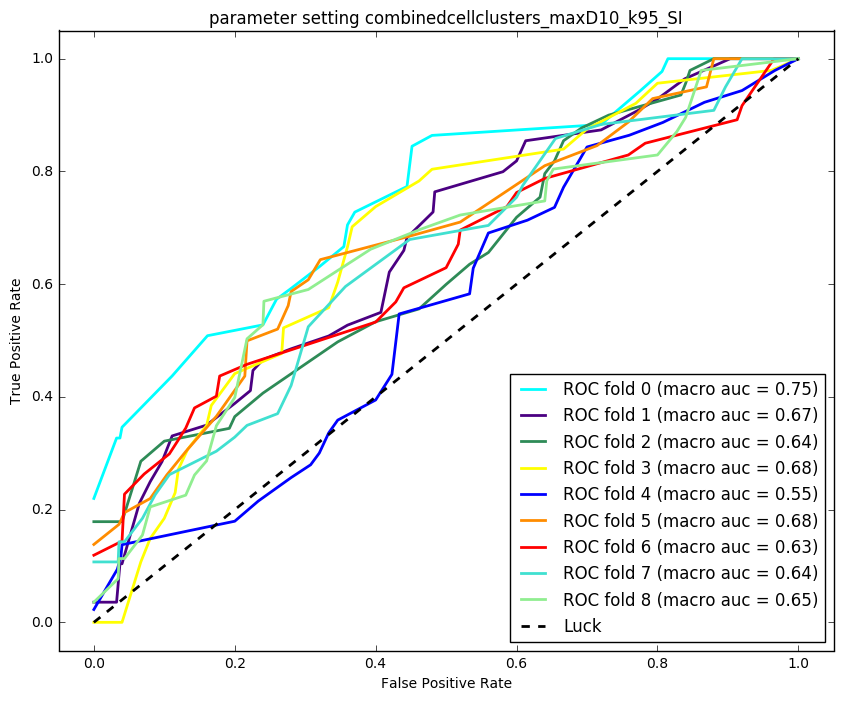

In [294]:
colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2
cv = StratifiedKFold(n_splits=9)

# CaseName = []
# ClassGrade = []
# Hospital = []
# rw_data = []
for param_set in xrange(len(rw_settings)):
    print('parameter setting %s' %(rw_settings[param_set]))
    # read in the file
    CaseName = []
    ClassGrade = []
    Hospital = []
    rw_data = []
    with open(os.path.join(rw_dir, (
                'train_test_list_' + rw_settings[param_set]+'.csv')),'rb') as csvfile:
        f_csv = csv.reader(csvfile,delimiter = ',')
        for row in f_csv:
            CaseName.append(row[0])
            ClassGrade.append(int(row[1]))
            Hospital.append(int(row[2]))
            rw_data.append([float(row[i]) for i in xrange(3,len(row))])
    data = np.vstack(rw_data)
    ClassGrade = np.asarray(ClassGrade)
    ClassGradeBin = preprocessing.label_binarize(ClassGrade, classes =[0,1,2,3])
    ClassLabel = np.asarray([int(ClassGrade[i] > 0) for i in 
                                 xrange(len(ClassGrade))])
    Hospital = np.asarray(Hospital)
    #print rw_data.shape, ClassGrade.shape
    data_train = data[Hospital == 1,:]
    data_test = data[Hospital == 0, :]
    y_train = ClassLabel[Hospital == 1]
    y_test = ClassLabel[Hospital == 0]
    print data_train.shape, data_test.shape, len(y_train), len(y_test)

    ###################################################
    ###################BINARY###################
    ###################################################
    scaler = preprocessing.StandardScaler().fit(data)
    X = scaler.transform(data)
    y = ClassGrade
    y_bin = ClassGradeBin

    random_state = np.random.RandomState(123)
    ##############################################
    ###################CV for C###################
    ##############################################
    cv_model = linear_model.LogisticRegressionCV(cv = 9, penalty='l1', scoring='roc_auc',solver='liblinear')
    cv_model.fit(X,y)
    #print np.mean(cv_model.C_)
    C = mode(cv_model.C_)[0][0]
    #C = 1
    
    print 'Regularization parameter: ',C
    ##############################################
    #clf = linear_model.LogisticRegression(penalty='l1',C = C, 
    #                                      random_state=random_state)
    
    i = 0
    model = []
    model_perf = []
    fpr_cv = dict()
    tpr_cv = dict()
    auc_cv = dict()
    acc_cv = dict()
    
    plt.figure()
    for (train, test), color in zip(cv.split(X, y), colors):
        clf = linear_model.LogisticRegression(penalty='l1',C = C, 
                                              random_state=random_state)
        model.append(clf.fit(X[train], y[train]))
        probas_ = model[i].predict_proba(X[test])
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
    
        for j in range(n_classes):
            fpr[j], tpr[j], _ = roc_curve(y_bin[test,j], probas_[:, j])
            roc_auc[j] = auc(fpr[j], tpr[j])

        # Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_bin[test].ravel(), probas_.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
        # macro average ROC curve and ROC area
        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))

        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for j in range(n_classes):
            mean_tpr += interp(all_fpr, fpr[j], tpr[j])

        # Finally average it and compute AUC
        mean_tpr /= n_classes

        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    
        # accuracy    
        ypred = model[i].predict(X[test])
        acc = accuracy_score(y[test],ypred)
        model_perf.append(acc + roc_auc['micro'] + roc_auc['macro'])
    
        plt.plot(fpr['macro'], tpr['macro'], lw=lw, color=color,
             label='ROC fold %d (macro auc = %0.2f)' % (i, roc_auc['macro']))
    
        fpr_cv[(i,'micro', 'val')] = fpr['micro']
        tpr_cv[(i,'micro','val')] = tpr['micro']
        auc_cv[(i,'micro','val')] = roc_auc['micro']
    
        fpr_cv[(i,'macro', 'val')] = fpr['macro']
        tpr_cv[(i,'macro','val')] = tpr['macro']
        auc_cv[(i,'macro','val')] = roc_auc['macro']
        acc_cv[(i,'val')] = acc
        print(('Fold %d: validation accuracy =%0.2f,'+
          'macro auc = %0.2f and micro auc = %0.2f') %(
            i, acc, roc_auc['macro'],roc_auc['micro']))
        i += 1
            
    plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(('parameter setting %s') %(rw_settings[param_set]))
    plt.legend(loc="lower right")
    plt.show()
    
    # get the best model
    model_perf = np.asarray(model_perf)
    best_model = np.argmax(model_perf)
    
    curr_key = (rw_settings[param_set] + '_micro' + '_CV' + '_4way' )
    fpr_dict[curr_key] = fpr_cv[(best_model,'micro', 'val')]
    tpr_dict[curr_key] = tpr_cv[(best_model,'micro','val')]
    auc_dict[curr_key] = auc_cv[(best_model,'micro','val')]

    curr_key = (rw_settings[param_set] + '_macro' + '_CV' + '_4way' )
    fpr_dict[curr_key] = fpr_cv[(best_model,'macro', 'val')]
    tpr_dict[curr_key] = tpr_cv[(best_model,'macro','val')]
    auc_dict[curr_key] = auc_cv[(best_model,'macro','val')]
    
    curr_key = (rw_settings[param_set] + '_CV' + '_4way' )
    acc_dict[curr_key] = acc_cv[(best_model,'val')]

In [252]:
# cv_model = linear_model.LogisticRegressionCV(cv = 9, penalty='l1', scoring='roc_auc',solver='liblinear')
# cv_model.fit(X,y)
# #print np.mean(cv_model.C_)
# C = mode(cv_model.C_)[0][0]

print C

0.0464158883361


parameter setting colorobjectclusters
(276, 8) (51, 8) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.48,macro auc = 0.81 and micro auc = 0.79
Test accuracy =0.51, macro auc = 0.67 and micro auc = 0.75
Fold 1: validation accuracy =0.45,macro auc = 0.76 and micro auc = 0.79
Test accuracy =0.55, macro auc = 0.69 and micro auc = 0.75
Fold 2: validation accuracy =0.52,macro auc = 0.72 and micro auc = 0.76
Test accuracy =0.55, macro auc = 0.69 and micro auc = 0.74
Fold 3: validation accuracy =0.42,macro auc = 0.67 and micro auc = 0.74
Test accuracy =0.53, macro auc = 0.71 and micro auc = 0.74
Fold 4: validation accuracy =0.48,macro auc = 0.73 and micro auc = 0.74
Test accuracy =0.51, macro auc = 0.69 and micro auc = 0.74
Fold 5: validation accuracy =0.32,macro auc = 0.74 and micro auc = 0.74
Test accuracy =0.59, macro auc = 0.68 and micro auc = 0.74
Fold 6: validation accuracy =0.50,macro auc = 0.84 and micro auc = 0.83
Test accuracy =0.61, macro auc = 0.68 a

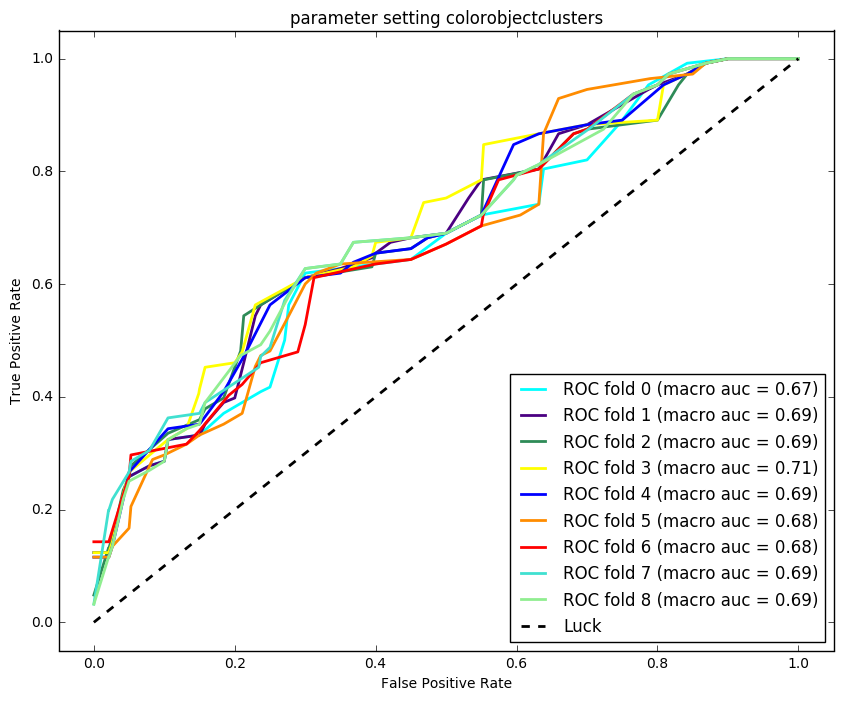

parameter setting cellclusters_maxD5_k90
(276, 8) (51, 8) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.55,macro auc = 0.74 and micro auc = 0.73
Test accuracy =0.55, macro auc = 0.69 and micro auc = 0.82
Fold 1: validation accuracy =0.35,macro auc = 0.65 and micro auc = 0.65
Test accuracy =0.53, macro auc = 0.70 and micro auc = 0.77
Fold 2: validation accuracy =0.42,macro auc = 0.75 and micro auc = 0.75
Test accuracy =0.55, macro auc = 0.68 and micro auc = 0.80
Fold 3: validation accuracy =0.45,macro auc = 0.76 and micro auc = 0.72
Test accuracy =0.55, macro auc = 0.70 and micro auc = 0.81
Fold 4: validation accuracy =0.35,macro auc = 0.71 and micro auc = 0.68
Test accuracy =0.49, macro auc = 0.69 and micro auc = 0.78
Fold 5: validation accuracy =0.45,macro auc = 0.73 and micro auc = 0.72
Test accuracy =0.55, macro auc = 0.70 and micro auc = 0.80
Fold 6: validation accuracy =0.50,macro auc = 0.72 and micro auc = 0.72
Test accuracy =0.53, macro auc = 0.7

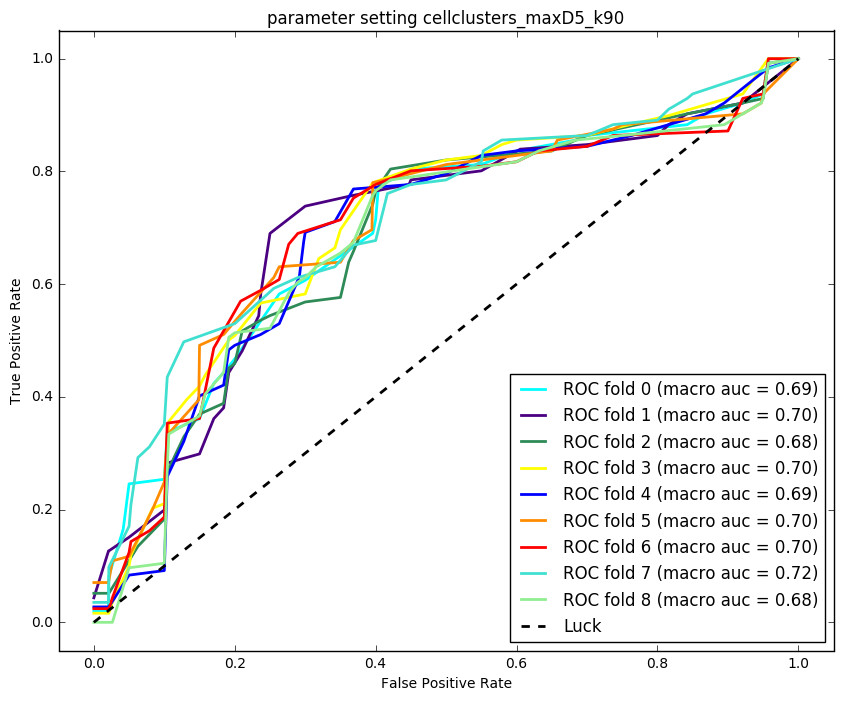

parameter setting cellclusters_maxD5_k90_SI
(276, 7) (51, 7) 276 51
Regularization parameter:  0.0464158883361
Fold 0: validation accuracy =0.36,macro auc = 0.72 and micro auc = 0.65
Test accuracy =0.47, macro auc = 0.72 and micro auc = 0.78
Fold 1: validation accuracy =0.23,macro auc = 0.57 and micro auc = 0.57
Test accuracy =0.47, macro auc = 0.72 and micro auc = 0.78
Fold 2: validation accuracy =0.42,macro auc = 0.63 and micro auc = 0.64
Test accuracy =0.47, macro auc = 0.72 and micro auc = 0.78
Fold 3: validation accuracy =0.35,macro auc = 0.65 and micro auc = 0.61
Test accuracy =0.45, macro auc = 0.72 and micro auc = 0.78
Fold 4: validation accuracy =0.45,macro auc = 0.66 and micro auc = 0.63
Test accuracy =0.47, macro auc = 0.72 and micro auc = 0.78
Fold 5: validation accuracy =0.45,macro auc = 0.80 and micro auc = 0.70
Test accuracy =0.47, macro auc = 0.72 and micro auc = 0.77
Fold 6: validation accuracy =0.47,macro auc = 0.70 and micro auc = 0.68
Test accuracy =0.47, macro auc 

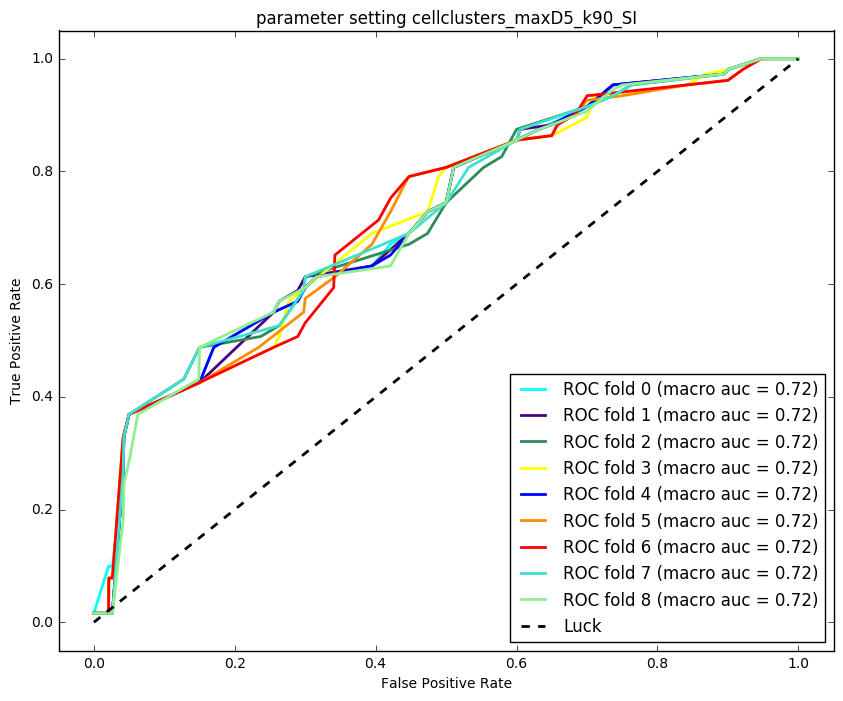

parameter setting cellclusters_maxD5_k95
(276, 14) (51, 14) 276 51
Regularization parameter:  0.0464158883361
Fold 0: validation accuracy =0.48,macro auc = 0.68 and micro auc = 0.67
Test accuracy =0.63, macro auc = 0.68 and micro auc = 0.84
Fold 1: validation accuracy =0.39,macro auc = 0.63 and micro auc = 0.67
Test accuracy =0.65, macro auc = 0.69 and micro auc = 0.84
Fold 2: validation accuracy =0.45,macro auc = 0.67 and micro auc = 0.67
Test accuracy =0.63, macro auc = 0.68 and micro auc = 0.84
Fold 3: validation accuracy =0.39,macro auc = 0.71 and micro auc = 0.65
Test accuracy =0.67, macro auc = 0.71 and micro auc = 0.85
Fold 4: validation accuracy =0.45,macro auc = 0.78 and micro auc = 0.72
Test accuracy =0.65, macro auc = 0.70 and micro auc = 0.85
Fold 5: validation accuracy =0.58,macro auc = 0.73 and micro auc = 0.71
Test accuracy =0.67, macro auc = 0.73 and micro auc = 0.83
Fold 6: validation accuracy =0.43,macro auc = 0.75 and micro auc = 0.69
Test accuracy =0.65, macro auc =

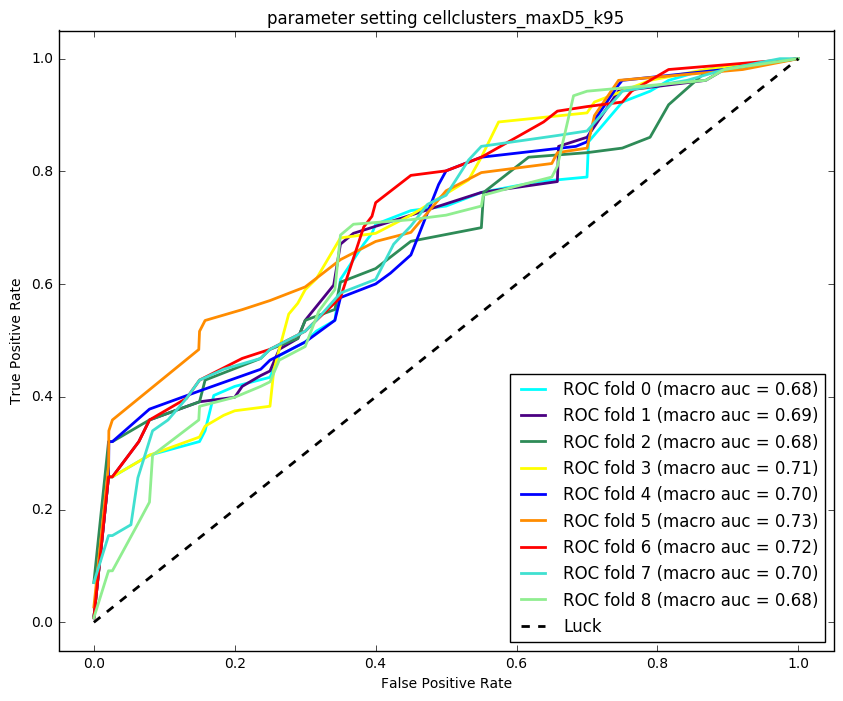

parameter setting cellclusters_maxD5_k95_SI
(276, 9) (51, 9) 276 51
Regularization parameter:  166.81005372
Fold 0: validation accuracy =0.36,macro auc = 0.70 and micro auc = 0.69
Test accuracy =0.51, macro auc = 0.63 and micro auc = 0.72
Fold 1: validation accuracy =0.23,macro auc = 0.68 and micro auc = 0.68
Test accuracy =0.47, macro auc = 0.67 and micro auc = 0.71
Fold 2: validation accuracy =0.45,macro auc = 0.77 and micro auc = 0.73
Test accuracy =0.51, macro auc = 0.68 and micro auc = 0.74
Fold 3: validation accuracy =0.39,macro auc = 0.70 and micro auc = 0.67
Test accuracy =0.45, macro auc = 0.68 and micro auc = 0.73
Fold 4: validation accuracy =0.48,macro auc = 0.71 and micro auc = 0.71
Test accuracy =0.47, macro auc = 0.68 and micro auc = 0.73
Fold 5: validation accuracy =0.35,macro auc = 0.63 and micro auc = 0.64
Test accuracy =0.43, macro auc = 0.68 and micro auc = 0.72
Fold 6: validation accuracy =0.40,macro auc = 0.70 and micro auc = 0.67
Test accuracy =0.41, macro auc = 0

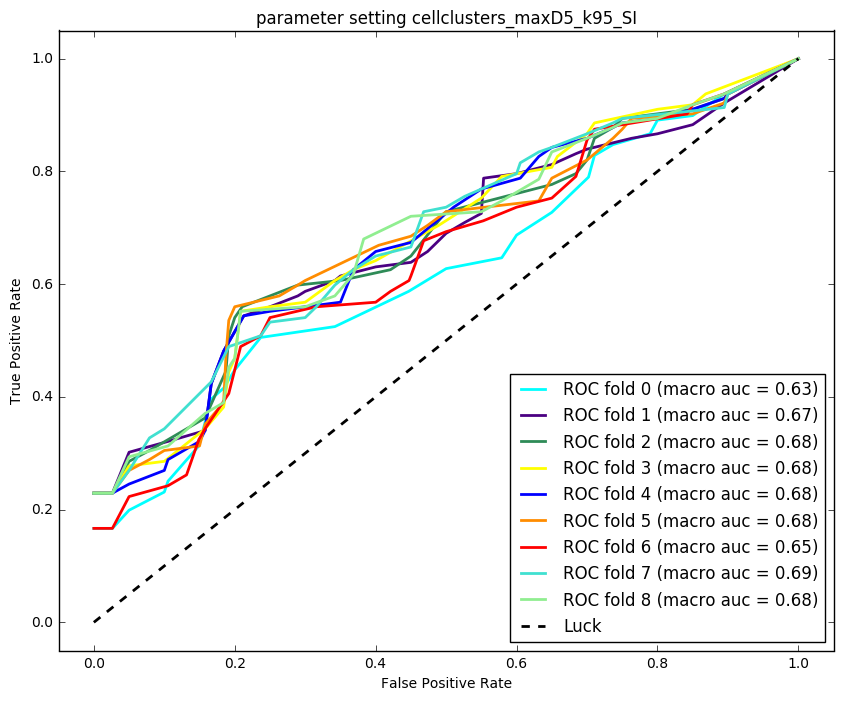

parameter setting cellclusters_maxD10_k90
(276, 13) (51, 13) 276 51
Regularization parameter:  0.0464158883361
Fold 0: validation accuracy =0.45,macro auc = 0.64 and micro auc = 0.64
Test accuracy =0.61, macro auc = 0.76 and micro auc = 0.85
Fold 1: validation accuracy =0.48,macro auc = 0.75 and micro auc = 0.72
Test accuracy =0.61, macro auc = 0.73 and micro auc = 0.85
Fold 2: validation accuracy =0.45,macro auc = 0.64 and micro auc = 0.68
Test accuracy =0.59, macro auc = 0.77 and micro auc = 0.86
Fold 3: validation accuracy =0.35,macro auc = 0.72 and micro auc = 0.67
Test accuracy =0.61, macro auc = 0.73 and micro auc = 0.86
Fold 4: validation accuracy =0.45,macro auc = 0.71 and micro auc = 0.65
Test accuracy =0.59, macro auc = 0.76 and micro auc = 0.86
Fold 5: validation accuracy =0.55,macro auc = 0.64 and micro auc = 0.67
Test accuracy =0.59, macro auc = 0.77 and micro auc = 0.86
Fold 6: validation accuracy =0.43,macro auc = 0.63 and micro auc = 0.64
Test accuracy =0.61, macro auc 

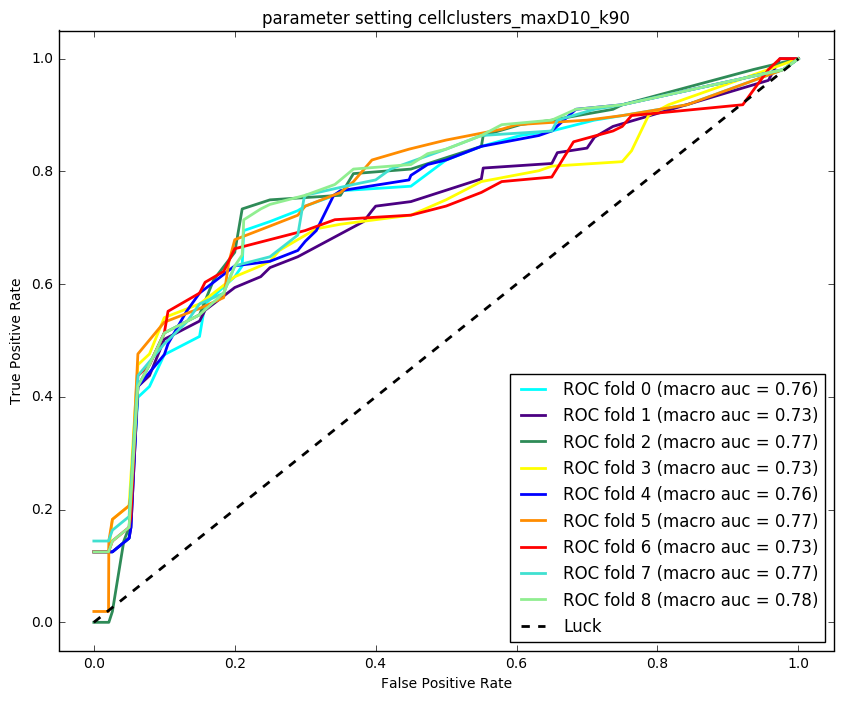

parameter setting cellclusters_maxD10_k90_SI
(276, 11) (51, 11) 276 51
Regularization parameter:  0.0464158883361
Fold 0: validation accuracy =0.33,macro auc = 0.64 and micro auc = 0.59
Test accuracy =0.63, macro auc = 0.64 and micro auc = 0.84
Fold 1: validation accuracy =0.39,macro auc = 0.65 and micro auc = 0.66
Test accuracy =0.61, macro auc = 0.64 and micro auc = 0.83
Fold 2: validation accuracy =0.35,macro auc = 0.66 and micro auc = 0.66
Test accuracy =0.67, macro auc = 0.61 and micro auc = 0.83
Fold 3: validation accuracy =0.35,macro auc = 0.68 and micro auc = 0.67
Test accuracy =0.65, macro auc = 0.67 and micro auc = 0.84
Fold 4: validation accuracy =0.35,macro auc = 0.61 and micro auc = 0.62
Test accuracy =0.63, macro auc = 0.64 and micro auc = 0.83
Fold 5: validation accuracy =0.32,macro auc = 0.60 and micro auc = 0.64
Test accuracy =0.27, macro auc = 0.67 and micro auc = 0.74
Fold 6: validation accuracy =0.43,macro auc = 0.68 and micro auc = 0.69
Test accuracy =0.61, macro a

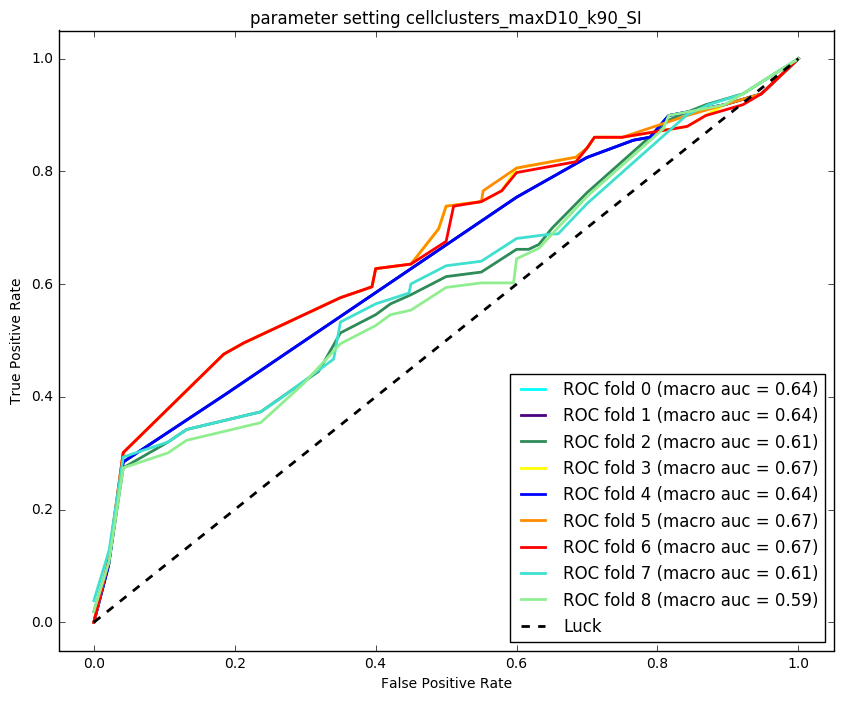

parameter setting cellclusters_maxD10_k95
(276, 14) (51, 14) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.48,macro auc = 0.70 and micro auc = 0.70
Test accuracy =0.63, macro auc = 0.75 and micro auc = 0.85
Fold 1: validation accuracy =0.52,macro auc = 0.70 and micro auc = 0.73
Test accuracy =0.57, macro auc = 0.72 and micro auc = 0.83
Fold 2: validation accuracy =0.45,macro auc = 0.75 and micro auc = 0.73
Test accuracy =0.65, macro auc = 0.74 and micro auc = 0.86
Fold 3: validation accuracy =0.35,macro auc = 0.67 and micro auc = 0.67
Test accuracy =0.63, macro auc = 0.76 and micro auc = 0.87
Fold 4: validation accuracy =0.52,macro auc = 0.69 and micro auc = 0.69
Test accuracy =0.67, macro auc = 0.76 and micro auc = 0.87
Fold 5: validation accuracy =0.32,macro auc = 0.69 and micro auc = 0.68
Test accuracy =0.67, macro auc = 0.79 and micro auc = 0.87
Fold 6: validation accuracy =0.33,macro auc = 0.68 and micro auc = 0.68
Test accuracy =0.67, macro auc = 

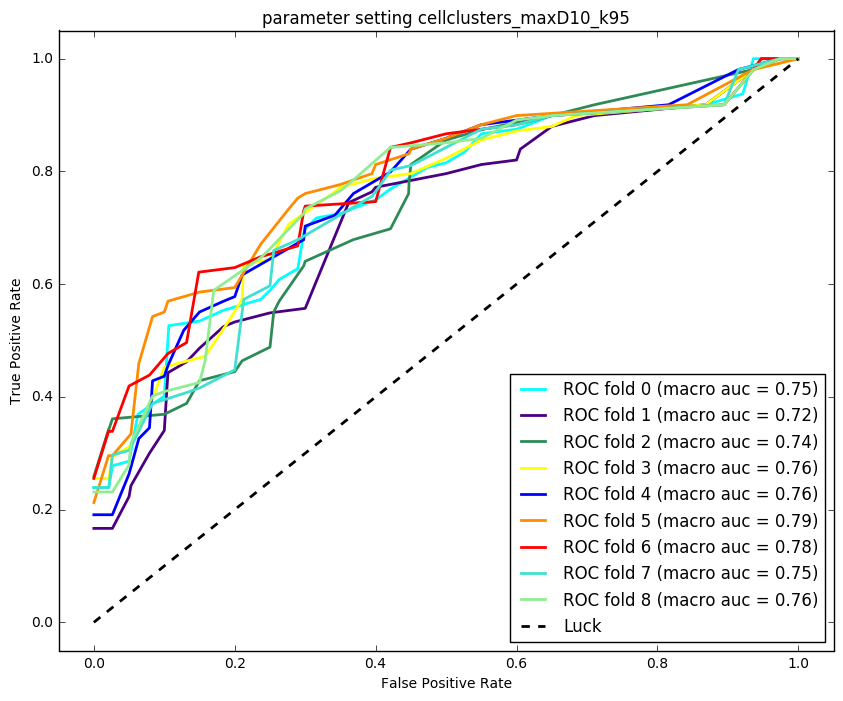

parameter setting cellclusters_maxD10_k95_SI
(276, 17) (51, 17) 276 51
Regularization parameter:  10000.0
Fold 0: validation accuracy =0.45,macro auc = 0.74 and micro auc = 0.74
Test accuracy =0.63, macro auc = 0.69 and micro auc = 0.81
Fold 1: validation accuracy =0.32,macro auc = 0.61 and micro auc = 0.64
Test accuracy =0.63, macro auc = 0.69 and micro auc = 0.80
Fold 2: validation accuracy =0.39,macro auc = 0.77 and micro auc = 0.76
Test accuracy =0.63, macro auc = 0.68 and micro auc = 0.81
Fold 3: validation accuracy =0.23,macro auc = 0.65 and micro auc = 0.60
Test accuracy =0.63, macro auc = 0.68 and micro auc = 0.80
Fold 4: validation accuracy =0.48,macro auc = 0.69 and micro auc = 0.69
Test accuracy =0.63, macro auc = 0.68 and micro auc = 0.77
Fold 5: validation accuracy =0.52,macro auc = 0.64 and micro auc = 0.68
Test accuracy =0.65, macro auc = 0.68 and micro auc = 0.81
Fold 6: validation accuracy =0.43,macro auc = 0.76 and micro auc = 0.75
Test accuracy =0.63, macro auc = 0.7

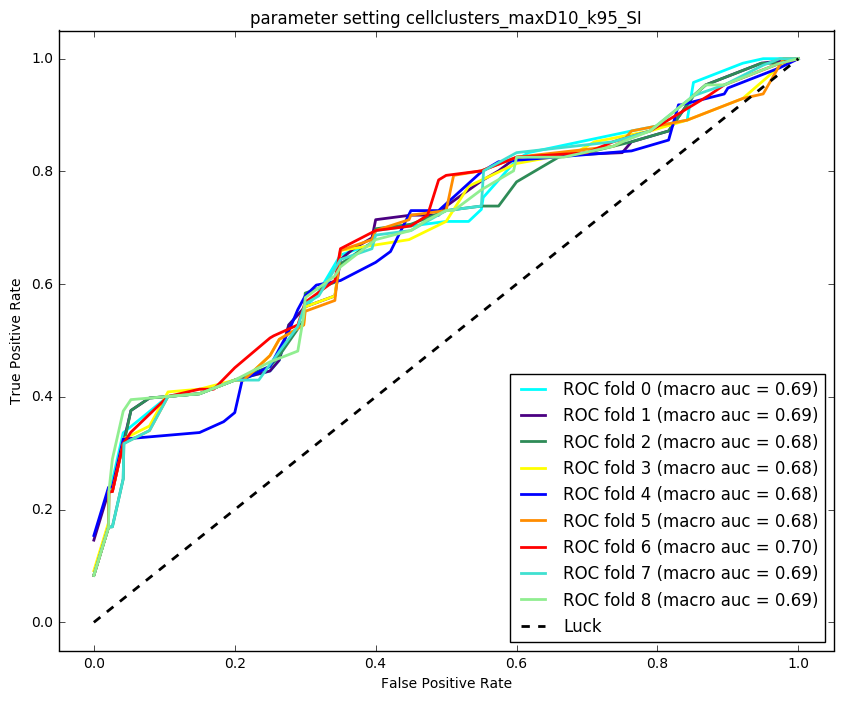

parameter setting combinedcellclusters_maxD5_k90
(276, 9) (51, 9) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.52,macro auc = 0.82 and micro auc = 0.80
Test accuracy =0.43, macro auc = 0.71 and micro auc = 0.72
Fold 1: validation accuracy =0.52,macro auc = 0.76 and micro auc = 0.77
Test accuracy =0.47, macro auc = 0.70 and micro auc = 0.71
Fold 2: validation accuracy =0.52,macro auc = 0.72 and micro auc = 0.72
Test accuracy =0.51, macro auc = 0.72 and micro auc = 0.72
Fold 3: validation accuracy =0.39,macro auc = 0.68 and micro auc = 0.74
Test accuracy =0.49, macro auc = 0.74 and micro auc = 0.74
Fold 4: validation accuracy =0.48,macro auc = 0.75 and micro auc = 0.70
Test accuracy =0.45, macro auc = 0.71 and micro auc = 0.71
Fold 5: validation accuracy =0.42,macro auc = 0.76 and micro auc = 0.76
Test accuracy =0.49, macro auc = 0.72 and micro auc = 0.70
Fold 6: validation accuracy =0.40,macro auc = 0.67 and micro auc = 0.71
Test accuracy =0.47, macro a

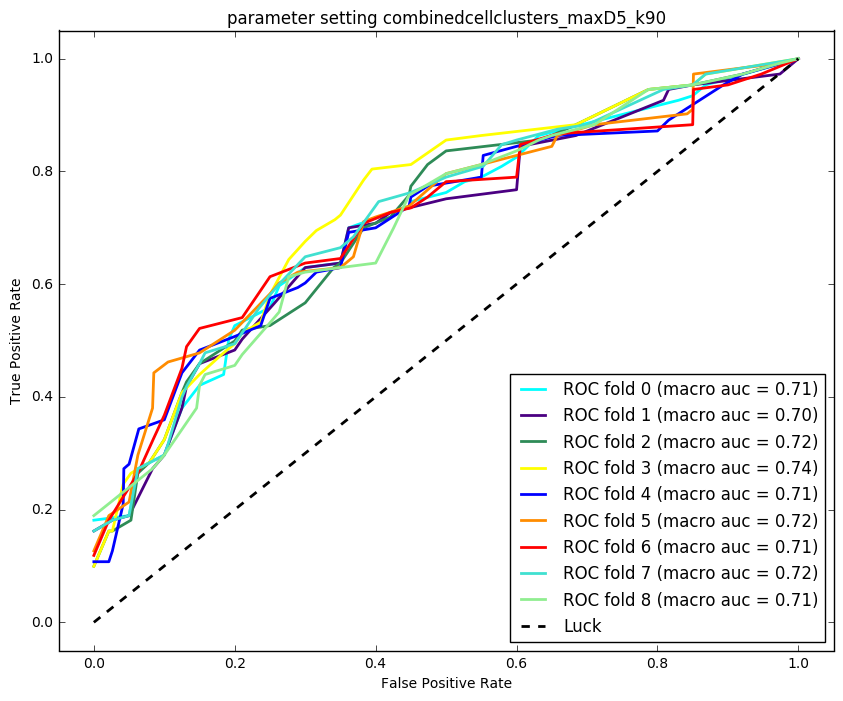

parameter setting combinedcellclusters_maxD5_k90_SI
(276, 11) (51, 11) 276 51
Regularization parameter:  0.0001
Fold 0: validation accuracy =0.27,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 0.50 and micro auc = 0.50
Fold 1: validation accuracy =0.29,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 0.50 and micro auc = 0.50
Fold 2: validation accuracy =0.29,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 0.50 and micro auc = 0.50
Fold 3: validation accuracy =0.29,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 0.50 and micro auc = 0.50
Fold 4: validation accuracy =0.29,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 0.50 and micro auc = 0.50
Fold 5: validation accuracy =0.29,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 0.50 and micro auc = 0.50
Fold 6: validation accuracy =0.30,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc

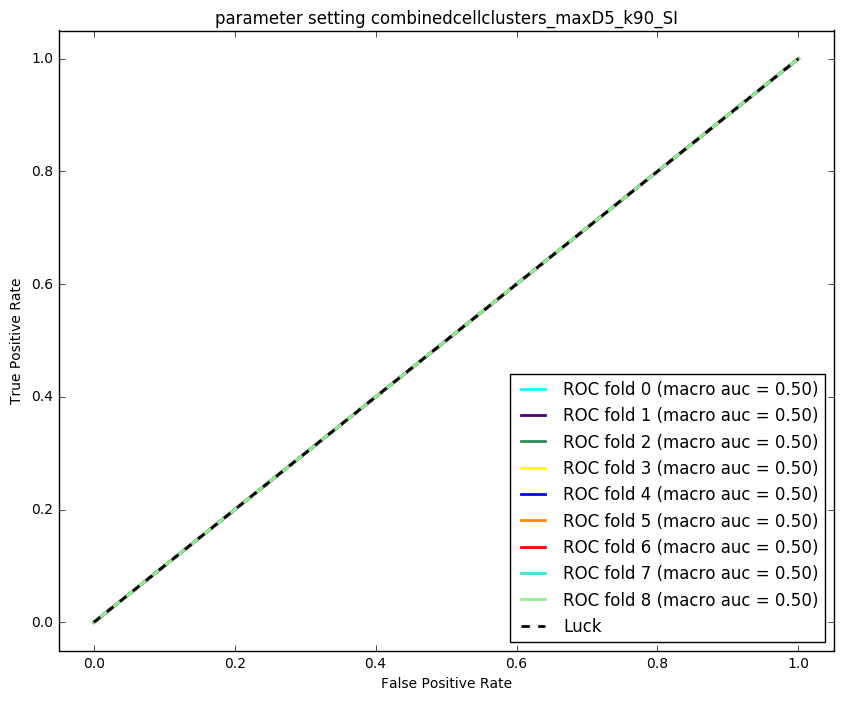

parameter setting combinedcellclusters_maxD5_k95
(276, 17) (51, 17) 276 51
Regularization parameter:  0.0001
Fold 0: validation accuracy =0.27,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 0.50 and micro auc = 0.50
Fold 1: validation accuracy =0.29,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 0.50 and micro auc = 0.50
Fold 2: validation accuracy =0.29,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 0.50 and micro auc = 0.50
Fold 3: validation accuracy =0.29,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 0.50 and micro auc = 0.50
Fold 4: validation accuracy =0.29,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 0.50 and micro auc = 0.50
Fold 5: validation accuracy =0.29,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 0.50 and micro auc = 0.50
Fold 6: validation accuracy =0.30,macro auc = 0.50 and micro auc = 0.50
Test accuracy =0.61, macro auc = 

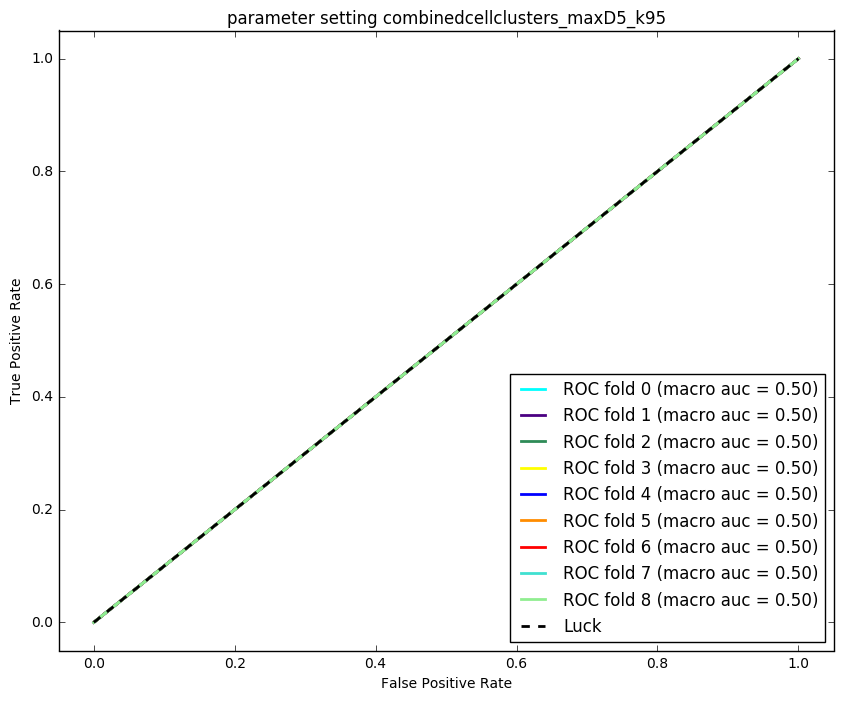

parameter setting combinedcellclusters_maxD5_k95_SI
(276, 12) (51, 12) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.42,macro auc = 0.54 and micro auc = 0.51
Test accuracy =0.41, macro auc = 0.58 and micro auc = 0.70
Fold 1: validation accuracy =0.32,macro auc = 0.58 and micro auc = 0.58
Test accuracy =0.41, macro auc = 0.49 and micro auc = 0.65
Fold 2: validation accuracy =0.32,macro auc = 0.61 and micro auc = 0.62
Test accuracy =0.43, macro auc = 0.51 and micro auc = 0.68
Fold 3: validation accuracy =0.39,macro auc = 0.70 and micro auc = 0.67
Test accuracy =0.41, macro auc = 0.47 and micro auc = 0.68
Fold 4: validation accuracy =0.32,macro auc = 0.56 and micro auc = 0.56
Test accuracy =0.39, macro auc = 0.52 and micro auc = 0.65
Fold 5: validation accuracy =0.35,macro auc = 0.54 and micro auc = 0.58
Test accuracy =0.43, macro auc = 0.48 and micro auc = 0.65
Fold 6: validation accuracy =0.20,macro auc = 0.52 and micro auc = 0.53
Test accuracy =0.43, ma

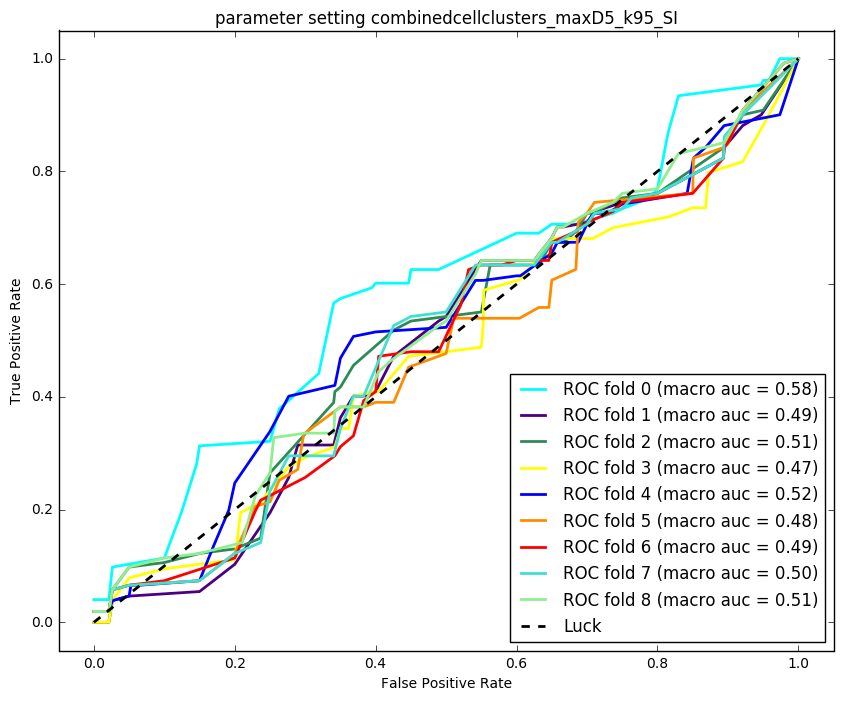

parameter setting combinedcellclusters_maxD10_k90
(276, 10) (51, 10) 276 51
Regularization parameter:  0.0464158883361
Fold 0: validation accuracy =0.48,macro auc = 0.67 and micro auc = 0.68
Test accuracy =0.65, macro auc = 0.72 and micro auc = 0.85
Fold 1: validation accuracy =0.48,macro auc = 0.69 and micro auc = 0.71
Test accuracy =0.65, macro auc = 0.71 and micro auc = 0.85
Fold 2: validation accuracy =0.42,macro auc = 0.67 and micro auc = 0.67
Test accuracy =0.65, macro auc = 0.72 and micro auc = 0.85
Fold 3: validation accuracy =0.32,macro auc = 0.61 and micro auc = 0.63
Test accuracy =0.67, macro auc = 0.77 and micro auc = 0.85
Fold 4: validation accuracy =0.52,macro auc = 0.76 and micro auc = 0.71
Test accuracy =0.65, macro auc = 0.70 and micro auc = 0.84
Fold 5: validation accuracy =0.55,macro auc = 0.71 and micro auc = 0.75
Test accuracy =0.67, macro auc = 0.79 and micro auc = 0.85
Fold 6: validation accuracy =0.40,macro auc = 0.67 and micro auc = 0.68
Test accuracy =0.65, ma

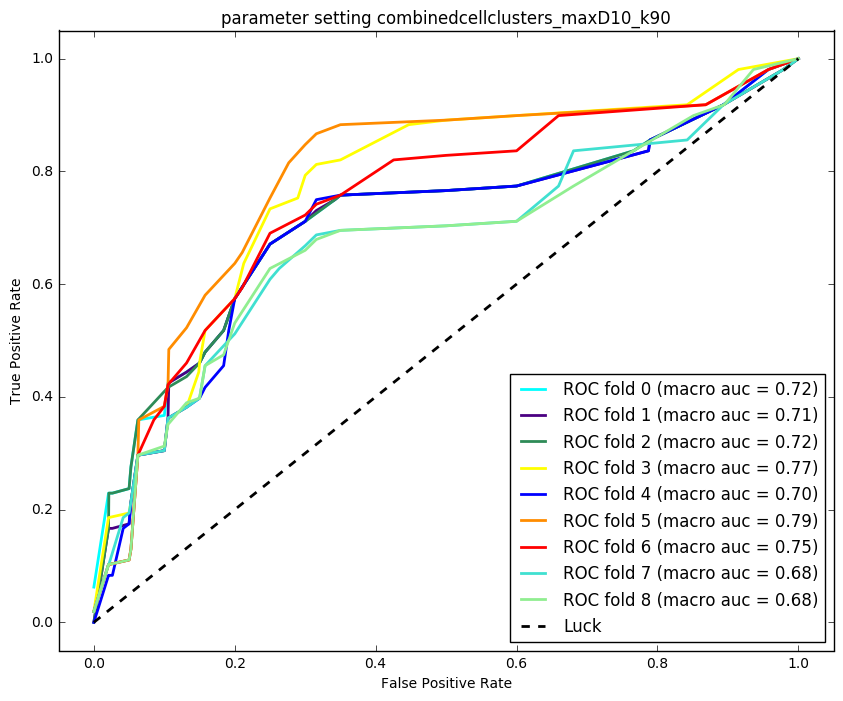

parameter setting combinedcellclusters_maxD10_k90_SI
(276, 18) (51, 18) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.48,macro auc = 0.78 and micro auc = 0.75
Test accuracy =0.57, macro auc = 0.67 and micro auc = 0.77
Fold 1: validation accuracy =0.35,macro auc = 0.66 and micro auc = 0.66
Test accuracy =0.51, macro auc = 0.67 and micro auc = 0.75
Fold 2: validation accuracy =0.39,macro auc = 0.80 and micro auc = 0.74
Test accuracy =0.51, macro auc = 0.65 and micro auc = 0.77
Fold 3: validation accuracy =0.26,macro auc = 0.61 and micro auc = 0.59
Test accuracy =0.53, macro auc = 0.66 and micro auc = 0.73
Fold 4: validation accuracy =0.39,macro auc = 0.69 and micro auc = 0.68
Test accuracy =0.53, macro auc = 0.66 and micro auc = 0.75
Fold 5: validation accuracy =0.45,macro auc = 0.71 and micro auc = 0.71
Test accuracy =0.49, macro auc = 0.68 and micro auc = 0.73
Fold 6: validation accuracy =0.30,macro auc = 0.61 and micro auc = 0.59
Test accuracy =0.51, m

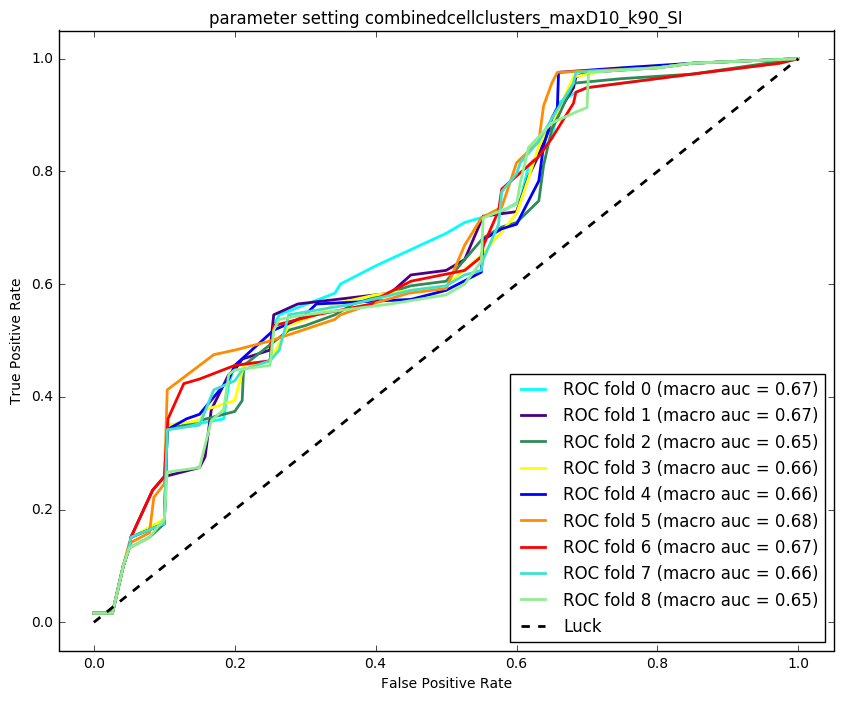

parameter setting combinedcellclusters_maxD10_k95
(276, 23) (51, 23) 276 51
Regularization parameter:  0.35938136638
Fold 0: validation accuracy =0.52,macro auc = 0.72 and micro auc = 0.76
Test accuracy =0.31, macro auc = 0.67 and micro auc = 0.65
Fold 1: validation accuracy =0.48,macro auc = 0.74 and micro auc = 0.76
Test accuracy =0.39, macro auc = 0.69 and micro auc = 0.66
Fold 2: validation accuracy =0.45,macro auc = 0.75 and micro auc = 0.76
Test accuracy =0.33, macro auc = 0.71 and micro auc = 0.65
Fold 3: validation accuracy =0.45,macro auc = 0.65 and micro auc = 0.69
Test accuracy =0.31, macro auc = 0.71 and micro auc = 0.62
Fold 4: validation accuracy =0.55,macro auc = 0.83 and micro auc = 0.78
Test accuracy =0.29, macro auc = 0.70 and micro auc = 0.65
Fold 5: validation accuracy =0.58,macro auc = 0.79 and micro auc = 0.84
Test accuracy =0.29, macro auc = 0.68 and micro auc = 0.63
Fold 6: validation accuracy =0.43,macro auc = 0.70 and micro auc = 0.69
Test accuracy =0.33, macr

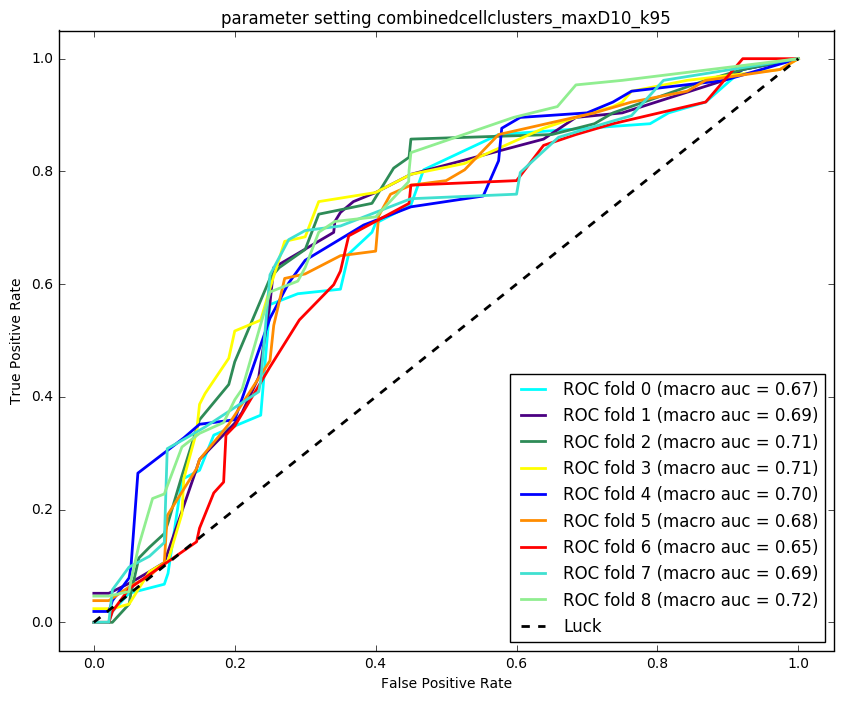

parameter setting combinedcellclusters_maxD10_k95_SI
(276, 22) (51, 22) 276 51
Regularization parameter:  166.81005372
Fold 0: validation accuracy =0.58,macro auc = 0.76 and micro auc = 0.75
Test accuracy =0.45, macro auc = 0.68 and micro auc = 0.75
Fold 1: validation accuracy =0.32,macro auc = 0.66 and micro auc = 0.65
Test accuracy =0.53, macro auc = 0.67 and micro auc = 0.75
Fold 2: validation accuracy =0.45,macro auc = 0.74 and micro auc = 0.72
Test accuracy =0.51, macro auc = 0.64 and micro auc = 0.74
Fold 3: validation accuracy =0.35,macro auc = 0.54 and micro auc = 0.59
Test accuracy =0.51, macro auc = 0.66 and micro auc = 0.72
Fold 4: validation accuracy =0.35,macro auc = 0.63 and micro auc = 0.58
Test accuracy =0.51, macro auc = 0.65 and micro auc = 0.73
Fold 5: validation accuracy =0.45,macro auc = 0.77 and micro auc = 0.76
Test accuracy =0.53, macro auc = 0.65 and micro auc = 0.72
Fold 6: validation accuracy =0.27,macro auc = 0.52 and micro auc = 0.50
Test accuracy =0.49, ma

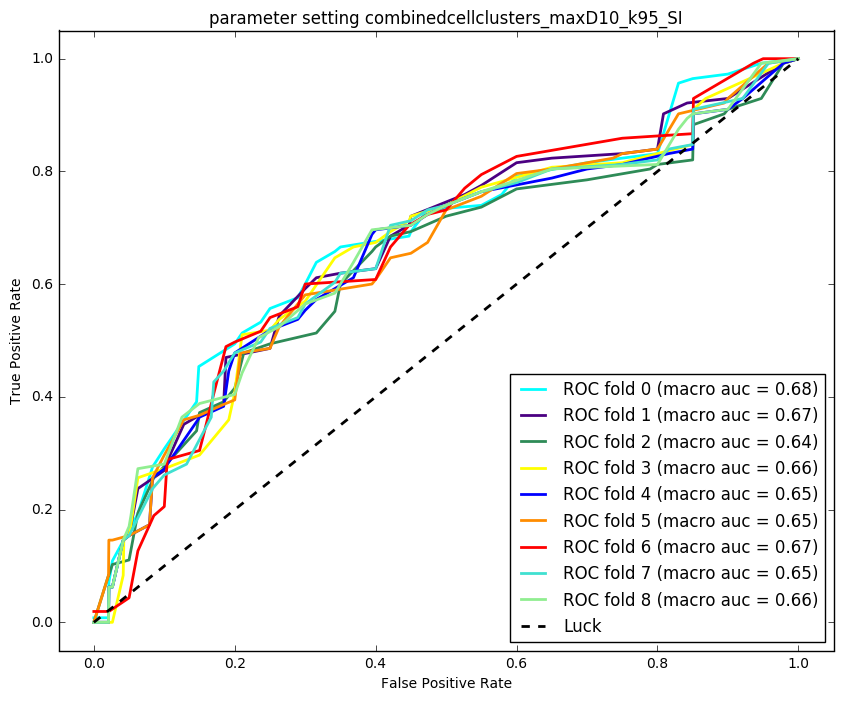

In [295]:
colors = cycle(['cyan', 'indigo', 'seagreen', 'yellow', 'blue', 'darkorange',
               'red','turquoise','lightgreen'])
lw = 2
cv = StratifiedKFold(n_splits=9)

# CaseName = []
# ClassGrade = []
# Hospital = []
# rw_data = []
for param_set in xrange(len(rw_settings)):
    print('parameter setting %s' %(rw_settings[param_set]))
    # read in the file
    CaseName = []
    ClassGrade = []
    Hospital = []
    rw_data = []
    with open(os.path.join(rw_dir, (
                'train_test_list_' + rw_settings[param_set]+'.csv')),'rb') as csvfile:
        f_csv = csv.reader(csvfile,delimiter = ',')
        for row in f_csv:
            CaseName.append(row[0])
            ClassGrade.append(int(row[1]))
            Hospital.append(int(row[2]))
            rw_data.append([float(row[i]) for i in xrange(3,len(row))])
    data = np.vstack(rw_data)
    ClassGrade = np.asarray(ClassGrade)
    ClassGradeBin = preprocessing.label_binarize(ClassGrade, classes =[0,1,2,3])
    ClassLabel = np.asarray([int(ClassGrade[i] > 0) for i in 
                                 xrange(len(ClassGrade))])
    Hospital = np.asarray(Hospital)
    #print rw_data.shape, ClassGrade.shape
    data_train = data[Hospital == 1,:]
    data_test = data[Hospital == 0, :]
    
    ###################################################
    ###################BINARY###################
    ###################################################
    scaler = preprocessing.StandardScaler().fit(data_train)
    data_train_scaled = scaler.transform(data_train)
    data_test_scaled = scaler.transform(data_test)
    X = data_train_scaled
    y = ClassGrade[Hospital == 1]
    y_bin = ClassGradeBin
    y_train = ClassGrade[Hospital == 1]
    y_test = ClassGrade[Hospital == 0]
    y_train_bin = y_bin[Hospital == 1]
    y_test_bin = y_bin[Hospital == 0]
    print data_train.shape, data_test.shape, len(y_train), len(y_test)
    random_state = np.random.RandomState(123)
    
    cv_model = linear_model.LogisticRegressionCV(cv = 9, penalty='l1', scoring='roc_auc',solver='liblinear')
    cv_model.fit(X,y)
    #print np.mean(cv_model.C_)
    C = mode(cv_model.C_)[0][0]
    #C = .5 #BEST ONE
    #clf = linear_model.LogisticRegression(penalty='l1',C = C, 
    #                                      random_state=random_state)
    
    print 'Regularization parameter: ', C
    i = 0
    model = []
    model_perf = []
    fpr_cv = dict()
    tpr_cv = dict()
    auc_cv = dict()
    acc_cv = dict()   
    plt.figure()
    for (train, test), color in zip(cv.split(X, y), colors):
        clf = linear_model.LogisticRegression(penalty='l1',C = C, 
                                              random_state=random_state)
        model.append(clf.fit(X[train], y[train]))
        probas_ = model[i].predict_proba(X[test])
        fpr = dict()
        tpr = dict()
        roc_auc = dict()
    
        for j in range(n_classes):
            fpr[j], tpr[j], _ = roc_curve(y_train_bin[test,j], probas_[:, j])
            roc_auc[j] = auc(fpr[j], tpr[j])

        # Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_train_bin[test].ravel(), 
                                                  probas_.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
        # macro average ROC curve and ROC area
        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))

        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for j in range(n_classes):
            mean_tpr += interp(all_fpr, fpr[j], tpr[j])

        # Finally average it and compute AUC
        mean_tpr /= n_classes

        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    
        # accuracy    
        ypred = model[i].predict(X[test])
        acc = accuracy_score(y[test],ypred)
        model_perf.append(acc + roc_auc['micro'] + roc_auc['macro'])
    
        #plt.plot(fpr['macro'], tpr['macro'], lw=lw, color=color,
        #     label='ROC fold %d (macro auc = %0.2f)' % (i, roc_auc['macro']))
    
        fpr_cv[(i,'micro', 'val')] = fpr['micro']
        tpr_cv[(i,'micro','val')] = tpr['micro']
        auc_cv[(i,'micro','val')] = roc_auc['micro']
    
        fpr_cv[(i,'macro', 'val')] = fpr['macro']
        tpr_cv[(i,'macro','val')] = tpr['macro']
        auc_cv[(i,'macro','val')] = roc_auc['macro']
        acc_cv[(i,'val')] = acc
        print(('Fold %d: validation accuracy =%0.2f,'+
          'macro auc = %0.2f and micro auc = %0.2f') %(
            i, acc, roc_auc['macro'],roc_auc['micro']))
        
        ### ### ### ### ### ### ### ### ### ### 
        ### ### make it to test set ### ### ### 
        ### ### ### ### ### ### ### ### ### ###
        probas_ = model[i].predict_proba(data_test_scaled)
        # Compute ROC curve and area the curve
    
        for j in range(n_classes):
            fpr[j], tpr[j], _ = roc_curve(y_test_bin[:,j], probas_[:, j])
            roc_auc[j] = auc(fpr[j], tpr[j])

        # Compute micro-average ROC curve and ROC area
        fpr["micro"], tpr["micro"], _ = roc_curve(y_test_bin.ravel(), probas_.ravel())
        roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
        # macro average ROC curve and ROC area
        # First aggregate all false positive rates
        all_fpr = np.unique(np.concatenate([fpr[j] for j in range(n_classes)]))

        # Then interpolate all ROC curves at this points
        mean_tpr = np.zeros_like(all_fpr)
        for j in range(n_classes):
            mean_tpr += interp(all_fpr, fpr[j], tpr[j])

        # Finally average it and compute AUC
        mean_tpr /= n_classes

        fpr["macro"] = all_fpr
        tpr["macro"] = mean_tpr
        roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
    
        # accuracy    
        ypred = model[i].predict(data_test_scaled)
        acc = accuracy_score(y_test,ypred)
        
        plt.plot(fpr['macro'], tpr['macro'], lw=lw, color=color,
             label='ROC fold %d (macro auc = %0.2f)' % (i, roc_auc['macro']))
    
        fpr_cv[(i,'micro', 'test')] = fpr['micro']
        tpr_cv[(i,'micro','test')] = tpr['micro']
        auc_cv[(i,'micro','test')] = roc_auc['micro']
    
        fpr_cv[(i,'macro', 'test')] = fpr['macro']
        tpr_cv[(i,'macro','test')] = tpr['macro']
        auc_cv[(i,'macro','test')] = roc_auc['macro']
        acc_cv[(i,'test')] = acc
    
        print(('Test accuracy =%0.2f, macro auc = %0.2f and micro auc = %0.2f') %(
            acc, roc_auc['macro'],roc_auc['micro']))
        
        i += 1
            
    plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

    plt.xlim([-0.05, 1.05])
    plt.ylim([-0.05, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(('parameter setting %s') %(rw_settings[param_set]))
    plt.legend(loc="lower right")
    plt.show()
    
    # get the best model
    model_perf = np.asarray(model_perf)
    best_model = np.argmax(model_perf)
    
    curr_key = (rw_settings[param_set] + '_micro' + '_val' + '_4way' )
    fpr_dict[curr_key] = fpr_cv[(best_model,'micro', 'val')]
    tpr_dict[curr_key] = tpr_cv[(best_model,'micro','val')]
    auc_dict[curr_key] = auc_cv[(best_model,'micro','val')]

    curr_key = (rw_settings[param_set] + '_macro' + '_val' + '_4way' )
    fpr_dict[curr_key] = fpr_cv[(best_model,'macro', 'val')]
    tpr_dict[curr_key] = tpr_cv[(best_model,'macro','val')]
    auc_dict[curr_key] = auc_cv[(best_model,'macro','val')]
    
    curr_key = (rw_settings[param_set] + '_val' + '_4way' )
    acc_dict[curr_key] = acc_cv[(best_model,'val')]
    
    #########################################################
    curr_key = (rw_settings[param_set] + '_micro' + '_test' + '_4way' )
    fpr_dict[curr_key] = fpr_cv[(best_model,'micro', 'test')]
    tpr_dict[curr_key] = tpr_cv[(best_model,'micro','test')]
    auc_dict[curr_key] = auc_cv[(best_model,'micro','test')]

    curr_key = (rw_settings[param_set] + '_macro' + '_test' + '_4way' )
    fpr_dict[curr_key] = fpr_cv[(best_model,'macro', 'test')]
    tpr_dict[curr_key] = tpr_cv[(best_model,'macro','test')]
    auc_dict[curr_key] = auc_cv[(best_model,'macro','test')]
    
    curr_key = (rw_settings[param_set] + '_test' + '_4way' )
    acc_dict[curr_key] = acc_cv[(best_model,'test')]

In [155]:
# print ClassGrade
print model_perf
ClassGradeBin = preprocessing.label_binarize(ClassGrade,classes=[
        'UDH','Low_DCIS','Medium_DCIS','High_DCIS'])
ClassGradeLabel = np.argmax(ClassGradeBin,axis = 1)
print ClassGradeLabel

[ 1.61570738  1.52725202  1.67196962  1.2802395   1.90348995  1.24636135
  1.31276786  1.4460301   1.52507569]
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0]


In [403]:
print('%s, %s, %s, %s, %s, %s, %s' %('settings','acc_cv','auc_cv',
                            'acc_val','auc_val','acc_test','auc_test'))
for key in fpr_dict:
    if '_val_bin' in key:
        key_split = key.split('_')
        clf_mode = key_split[-1]
        val_test_mode = key_split[-2]
        setting = '_'.join(key_split[:-2])
        
        print('%s, %0.2f, %0.2f,%0.2f, %0.2f, %0.2f,%0.2f' %(
                setting,acc_dict[(setting + '_CV_'+clf_mode)], auc_dict[(setting + '_CV_'+clf_mode)],
                acc_dict[(setting + '_val_'+clf_mode)],auc_dict[(setting + '_val_'+clf_mode)], 
                acc_dict[(setting + '_test_'+clf_mode)],auc_dict[(setting + '_test_'+clf_mode)]    
            ))

settings, acc_cv, auc_cv, acc_val, auc_val, acc_test, auc_test
combinedcellclusters_maxD10_k90_SI, 0.69, 0.70,0.71, 0.70, 0.39,0.60
cellclusters_maxD5_k95, 0.68, 0.72,0.71, 0.73, 0.43,0.64
combinedcellclusters_maxD10_k90, 0.73, 0.79,0.75, 0.82, 0.41,0.75
cellclusters_maxD10_k95, 0.72, 0.79,0.74, 0.77, 0.75,0.84
combinedcellclusters_maxD10_k95_SI, 0.69, 0.72,0.74, 0.73, 0.45,0.60
cellclusters_maxD5_k90, 0.68, 0.74,0.72, 0.73, 0.37,0.63
cellclusters_maxD5_k90_SI, 0.68, 0.71,0.71, 0.68, 0.39,0.64
cellclusters_maxD5_k95_SI, 0.66, 0.69,0.71, 0.70, 0.39,0.58
combinedcellclusters_maxD5_k95, 0.65, 0.76,0.79, 0.82, 0.43,0.67
colorobjectclusters, 0.78, 0.84,0.79, 0.87, 0.53,0.68
cellclusters_maxD10_k95_SI, 0.70, 0.75,0.71, 0.73, 0.39,0.64
cellclusters_maxD10_k90_SI, 0.67, 0.73,0.71, 0.70, 0.39,0.58
combinedcellclusters_maxD10_k95, 0.71, 0.78,0.76, 0.83, 0.47,0.75
combinedcellclusters_maxD5_k90, 0.65, 0.78,0.73, 0.84, 0.43,0.65
nucFeats, 0.94, 1.00,1.00, 1.00, 0.61,0.75
combinedcellclusters_maxD5

In [181]:
for key in fpr_dict:
    if 'bin' in key:
        print key

cellclusters_maxD10_k95_SI_test_bin
cellclusters_maxD5_k95_val_bin
combinedcellclusters_maxD5_k95_SI_macro_test_4way
combinedcellclusters_maxD5_k90_SI_test_bin
combinedcellclusters_maxD5_k90_SI_micro_val_4way
combinedcellclusters_maxD5_k90_SI_macro_test_4way
cellclusters_maxD5_k95_test_bin
cellclusters_maxD10_k95_val_bin
cellclusters_maxD10_k95_test_bin
combinedcellclusters_maxD5_k90_SI_macro_val_4way
cellclusters_maxD5_k90_val_bin
combinedcellclusters_maxD5_k90_CV_bin
cellclusters_maxD5_k90_SI_val_bin
cellclusters_maxD5_k95_SI_test_bin
cellclusters_maxD5_k95_SI_val_bin
cellclusters_maxD10_k90_test_bin
combinedcellclusters_maxD5_k95_test_bin
combinedcellclusters_maxD5_k90_macro_val_4way
colorobjectclusters_test_bin
combinedcellclusters_maxD5_k95_val_bin
cellclusters_maxD5_k90_SI_CV_bin
combinedcellclusters_maxD5_k95_macro_val_4way
colorobjectclusters_val_bin
combinedcellclusters_maxD5_k95_SI_test_bin
cellclusters_maxD10_k95_SI_val_bin
combinedcellclusters_maxD5_k95_SI_micro_test_4way
c

In [179]:
key
clf_mode = key_split[-1]
val_test_mode = key_split[-2]
setting = '_'.join(key_split[:-2])

print clf_mode, val_test_mode, setting

4way val combinedcellclusters_maxD5_k95_SI_micro


In [402]:
print('%s, %s, %s, %s, %s, %s, %s, %s, %s, %s' %('settings','acc_cv','auc_macro_cv','auc_micro_cv',
                            'acc_val','auc_micro_val','auc_maco_val',
                            'acc_test','auc_micro_test','auc_macro_test'))
for key in fpr_dict:
    if 'micro_val_4way' in key:
        key_split = key.split('_')
        clf_mode = key_split[-1]
        val_test_mode = key_split[-2]
        micro_macro_mode = key_split[-3]
        setting = '_'.join(key_split[:-3])
        
        print('%s, %0.2f, %0.2f,%0.2f, %0.2f, %0.2f,%0.2f, %0.2f, %0.2f,%0.2f' %(
                setting,acc_dict[(setting + '_CV_'+clf_mode)], auc_dict[(setting + '_macro_CV_'+clf_mode)],
                auc_dict[(setting + '_micro_CV_'+clf_mode)],
                acc_dict[(setting + '_val_'+clf_mode)],auc_dict[(setting + '_macro_val_'+clf_mode)], 
                auc_dict[(setting + '_micro_val_'+clf_mode)],
                acc_dict[(setting + '_test_'+clf_mode)],auc_dict[(setting + '_macro_test_'+clf_mode)], 
                auc_dict[(setting + '_micro_test_'+clf_mode)]               
            
            ))

settings, acc_cv, auc_macro_cv, auc_micro_cv, acc_val, auc_micro_val, auc_maco_val, acc_test, auc_micro_test, auc_macro_test
cellclusters_maxD10_k90_SI, 0.47, 0.71,0.74, 0.37, 0.70,0.69, 0.65, 0.72,0.82
combinedcellclusters_maxD5_k90_SI, 0.30, 0.60,0.62, 0.31, 0.61,0.61, 0.25, 0.63,0.64
cellclusters_maxD10_k95_SI, 0.49, 0.73,0.76, 0.45, 0.74,0.75, 0.67, 0.68,0.82
cellclusters_maxD10_k90, 0.51, 0.79,0.79, 0.48, 0.78,0.76, 0.63, 0.77,0.86
combinedcellclusters_maxD10_k95_SI, 0.45, 0.71,0.73, 0.44, 0.72,0.72, 0.51, 0.68,0.75
colorobjectclusters, 0.49, 0.75,0.78, 0.49, 0.77,0.79, 0.51, 0.69,0.73
cellclusters_maxD5_k90, 0.47, 0.75,0.76, 0.48, 0.76,0.76, 0.59, 0.66,0.81
cellclusters_maxD10_k95, 0.54, 0.78,0.80, 0.51, 0.77,0.77, 0.65, 0.77,0.88
combinedcellclusters_maxD5_k90, 0.49, 0.72,0.74, 0.55, 0.77,0.79, 0.43, 0.70,0.69
cellclusters_maxD5_k90_SI, 0.44, 0.68,0.71, 0.43, 0.69,0.68, 0.55, 0.56,0.71
combinedcellclusters_maxD10_k90_SI, 0.44, 0.70,0.71, 0.42, 0.70,0.71, 0.53, 0.66,0.74
NucFeats

In [166]:
print key
key_split = key.split('_')
val_test_mode = key_split[-2]
clf_mode = key_split[-1]

print clf_mode, val_test_mode
setting =  '_'.join(key_split[:-2])
print setting
#setting = str.join((key_split[:-2]),'_')


combinedcellclusters_maxD5_k95_SI_val_bin
bin val
combinedcellclusters_maxD5_k95_SI


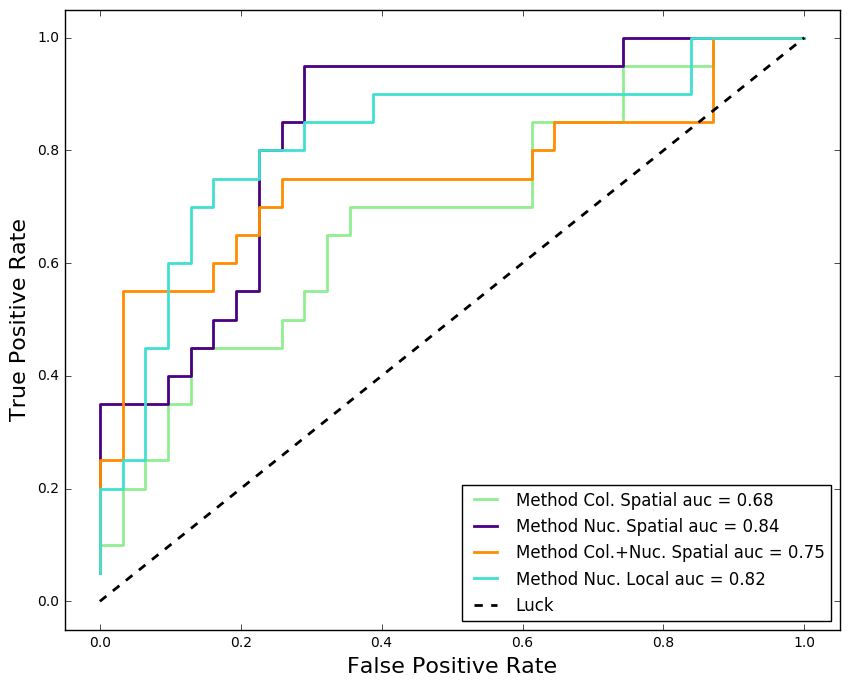

In [433]:
# plot for binary
methods = ['colorobjectclusters','cellclusters_maxD10_k95',
        'combinedcellclusters_maxD10_k95', 'nucFeats']
lg_txt = ['Col. Spatial','Nuc. Spatial', 
          'Col.+Nuc. Spatial','Nuc. Local']
colors = ['lightgreen', 'indigo', 'darkorange','turquoise'
          ,'blue']
plt.figure()
for method, color,lg in zip(methods, colors, lg_txt):
    key = (method+'_test_bin')
    plt.plot(fpr_dict[key], tpr_dict[key], lw=lw, color=color,
             label='Method %s auc = %0.2f' % (lg, auc_dict[key]))

plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate',size=16)
plt.ylabel('True Positive Rate', size = 16)
#plt.title('Binary classification results')
plt.legend(loc="lower right")
plt.show()

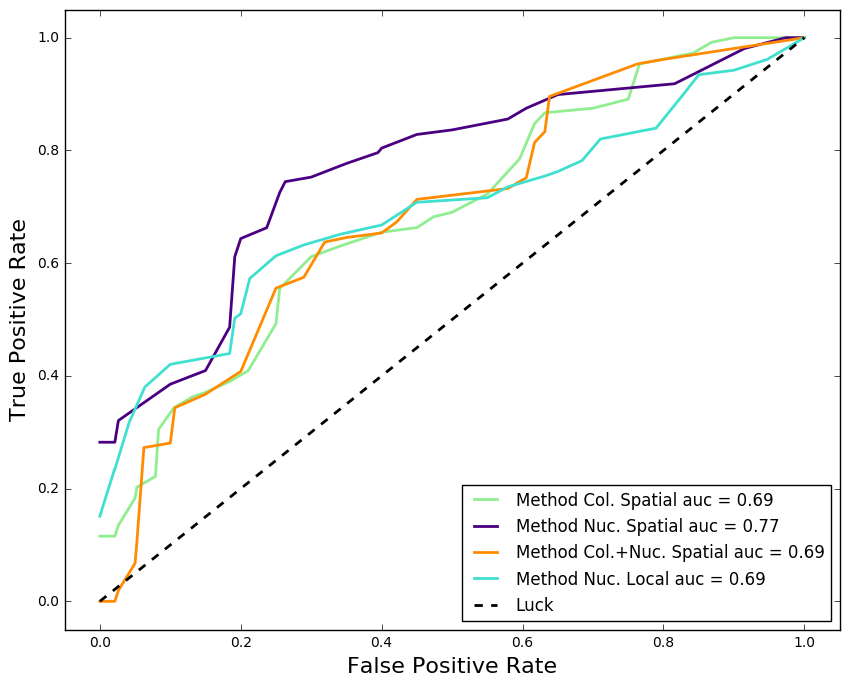

In [420]:
# plot for binary
methods = ['colorobjectclusters','cellclusters_maxD10_k95',
        'combinedcellclusters_maxD10_k95', 'nucFeats']
lg_txt = ['Col. Spatial','Nuc. Spatial', 
          'Col.+Nuc. Spatial','Nuc. Local']
colors = ['lightgreen', 'indigo', 'darkorange','turquoise'
          ,'blue']
lw = 2
plt.figure()
for method, color,lg in zip(methods, colors, lg_txt):
    key = (method+'_macro_test_4way')
    plt.plot(fpr_dict[key], tpr_dict[key], lw=lw, color=color,
             label='Method %s auc = %0.2f' % (lg, auc_dict[key]))

plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k',
         label='Luck')

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate',size=16)
plt.ylabel('True Positive Rate', size = 16)
#plt.title('Binary classification results')
plt.legend(loc="lower right")
plt.show()

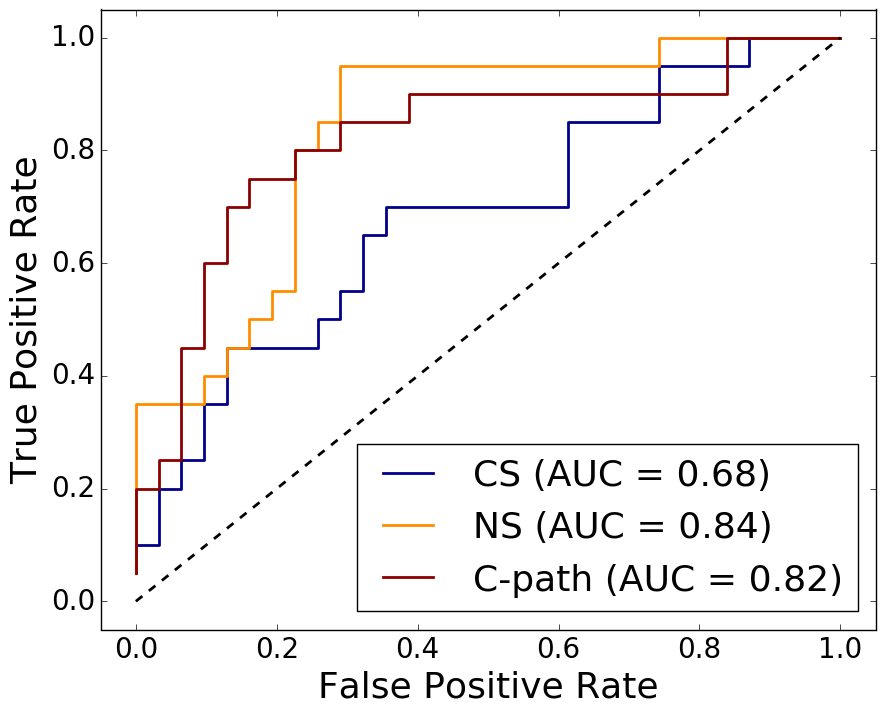

In [443]:
# plot for binary
# 'combinedcellclusters_maxD10_k95',
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
methods = ['colorobjectclusters','cellclusters_maxD10_k95',
         'nucFeats']
lg_txt = ['CS','NS', 'C-path']
colors = ['darkblue','darkorange', 'darkred', 'darkblue','blue']
plt.figure()
for method, color,lg in zip(methods, colors, lg_txt):
    key = (method+'_test_bin')
    plt.plot(fpr_dict[key], tpr_dict[key], lw=lw, color=color,
             label='%s (AUC = %0.2f)' % (lg, auc_dict[key]))

plt.plot([0, 1], [0, 1], linestyle='--', lw=lw, color='k')

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
font_size = 26
plt.xlabel('False Positive Rate',size=font_size)
plt.ylabel('True Positive Rate', size = font_size)
#plt.title('Binary classification results')
plt.legend(loc="lower right",prop={'size':font_size})
plt.show()